# importing the needed libraries

In [4]:
import os
import cv2
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
from scipy.ndimage import center_of_mass
from skimage.draw import polygon
from skimage.segmentation import active_contour
from sklearn.metrics import accuracy_score, jaccard_score

# Loading the dataset & Preprocessing

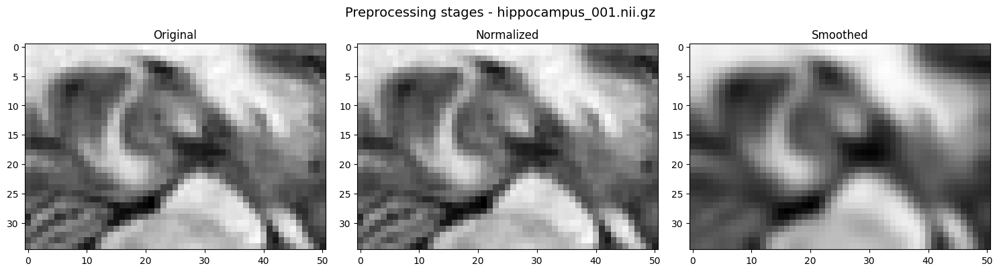

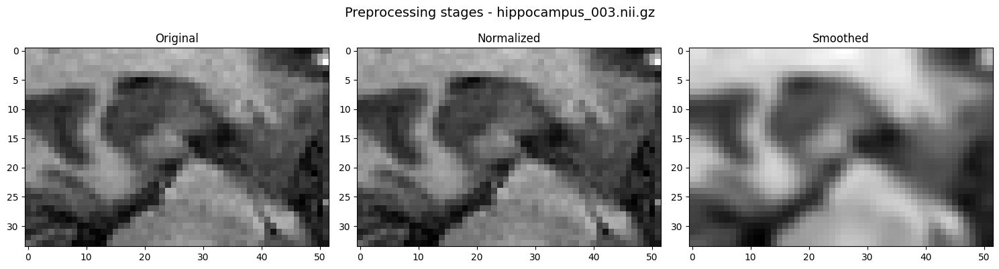

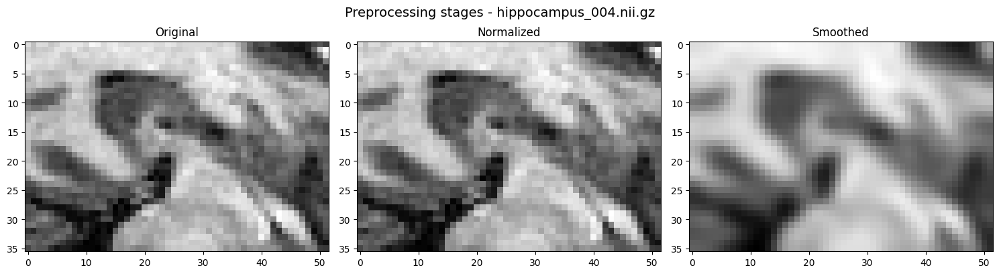

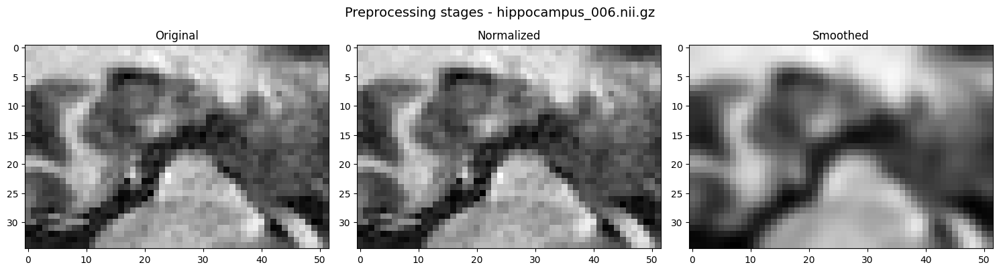

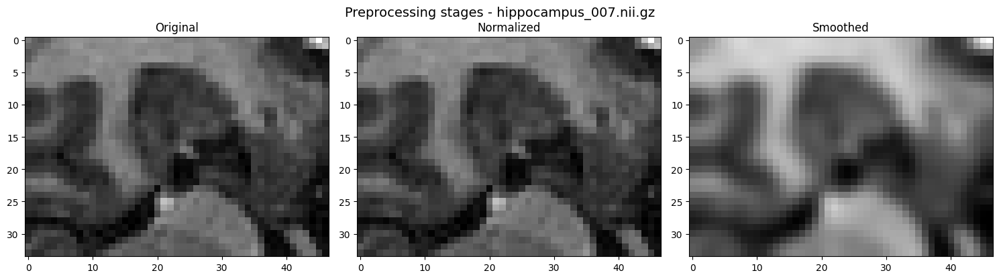

...

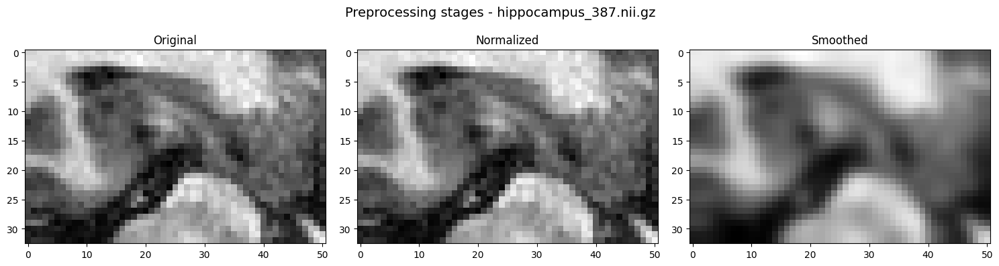

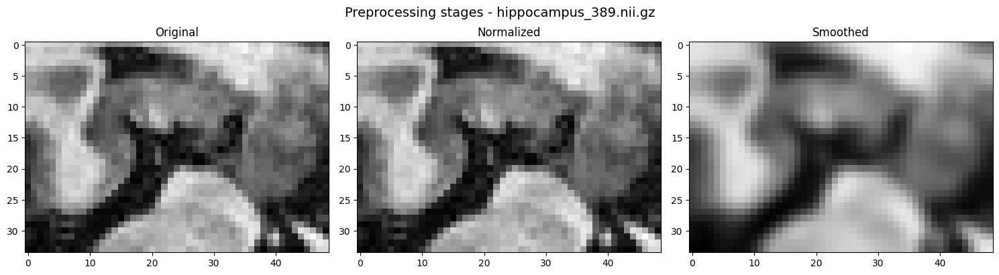

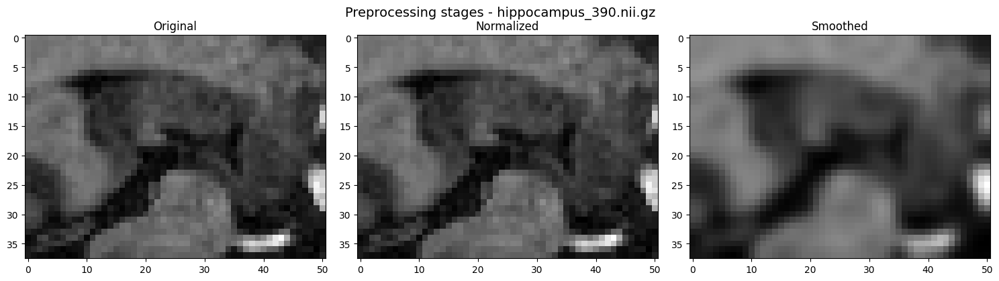

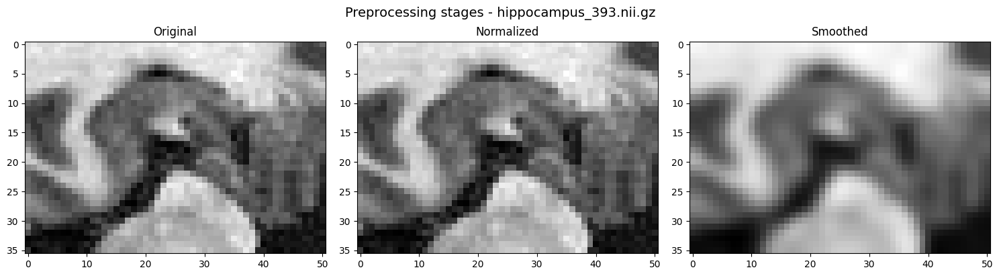

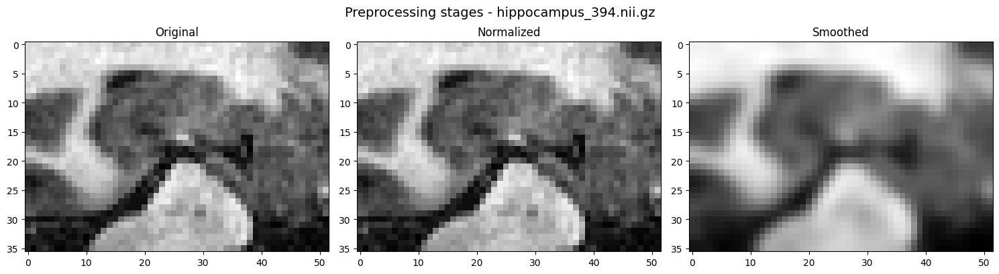

In [5]:
preprocessed_slices = []  
label_slices = []     

image_dir = r"D:\Projects\CV project\Task04_Hippocampus\imagesTr"
label_dir = r"D:\Projects\CV project\Task04_Hippocampus\labelsTr"

image_files = sorted([f for f in os.listdir(image_dir) 
                      if f.endswith(".nii.gz") and not f.startswith("._")])

for i, file in enumerate(image_files[:]):
    image_path = os.path.join(image_dir, file)
    label_path = os.path.join(label_dir, file)

    image = nib.load(image_path).get_fdata()
    label = nib.load(label_path).get_fdata()
    
# extracting a 2d slice so we can apply active contour on it   
    slice_idx = image.shape[2] // 2
    mri_slice = image[:, :, slice_idx]
    label_slice = label[:, :, slice_idx]
    
# ------------ Preprocessing -------------------------

# 1- normalization
    norm_slice = (mri_slice - np.min(mri_slice)) / (np.max(mri_slice) - np.min(mri_slice) + 1e-8)
    norm_slice = cv2.normalize(norm_slice, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    
# 2- smoothing    
    smoothed = cv2.GaussianBlur(norm_slice, (5, 5), 0)
    final_slice = smoothed.astype(np.float32) / 255.0
    

#storing the preprocessed images so we can apply active contour in the model phase 
    preprocessed_slices.append(final_slice)
    label_slices.append(label_slice)
    
    # === Visualization ===
    plt.figure(figsize=(15, 4))
    plt.suptitle(f"Preprocessing stages - {file}", fontsize=14)

    plt.subplot(1, 3, 1)
    plt.imshow(mri_slice, cmap='gray')
    plt.title("Original")

    plt.subplot(1, 3, 2)
    plt.imshow(norm_slice, cmap='gray')
    plt.title("Normalized")

    plt.subplot(1, 3, 3)
    plt.imshow(final_slice, cmap='gray')
    plt.title("Smoothed")

    plt.tight_layout()
    plt.show()


hippocampus_001.nii.gz
  Accuracy: 0.9681
  Dice Coefficient: 0.7897
  IoU: 0.6524



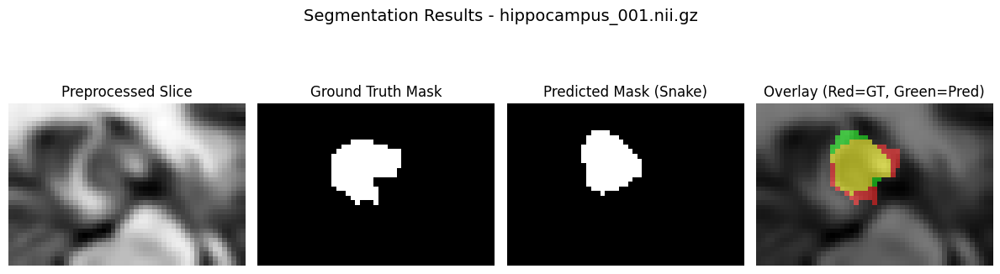

hippocampus_003.nii.gz
  Accuracy: 0.9712
  Dice Coefficient: 0.8603
  IoU: 0.7548



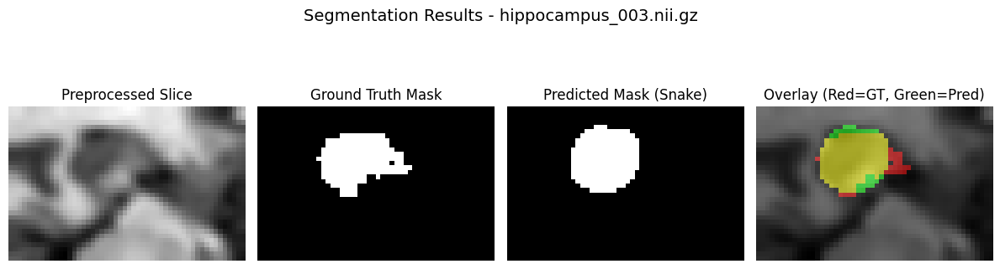

hippocampus_004.nii.gz
  Accuracy: 0.9621
  Dice Coefficient: 0.7216
  IoU: 0.5644



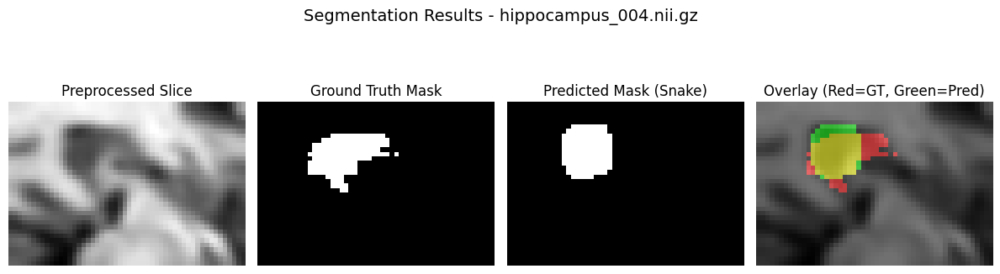

hippocampus_006.nii.gz
  Accuracy: 0.9379
  Dice Coefficient: 0.7680
  IoU: 0.6233



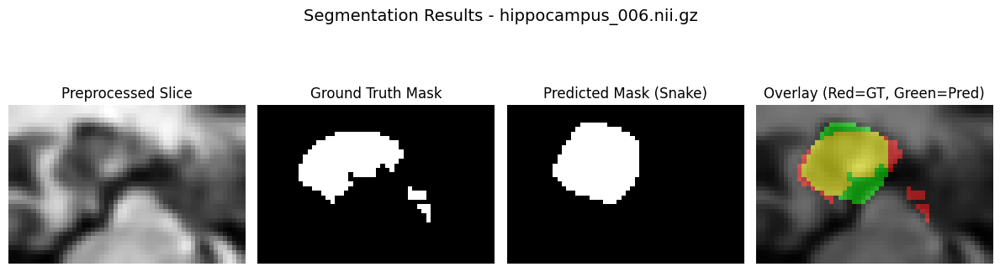

hippocampus_007.nii.gz
  Accuracy: 0.9693
  Dice Coefficient: 0.8686
  IoU: 0.7678



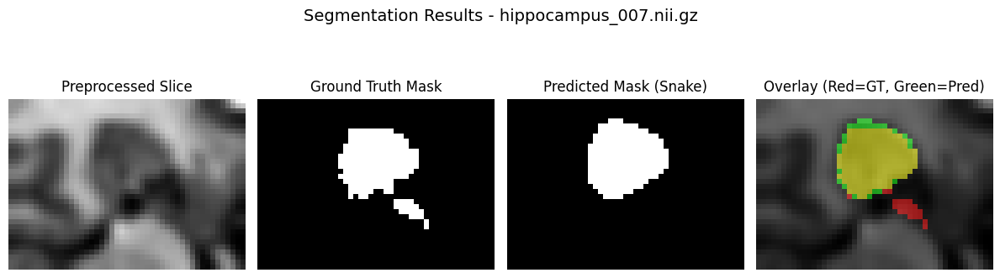

hippocampus_008.nii.gz
  Accuracy: 0.9826
  Dice Coefficient: 0.9080
  IoU: 0.8315



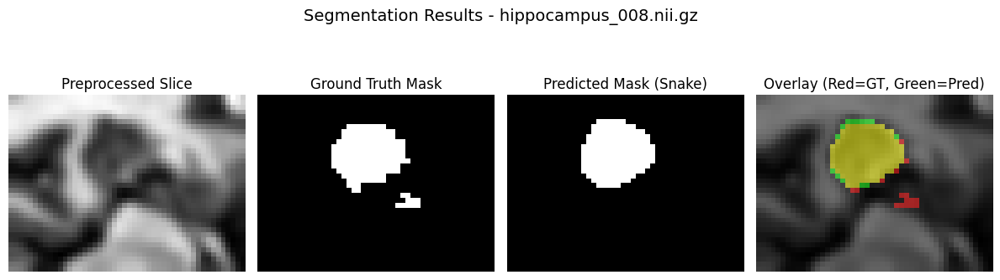

hippocampus_011.nii.gz
  Accuracy: 0.8861
  Dice Coefficient: 0.7059
  IoU: 0.5455



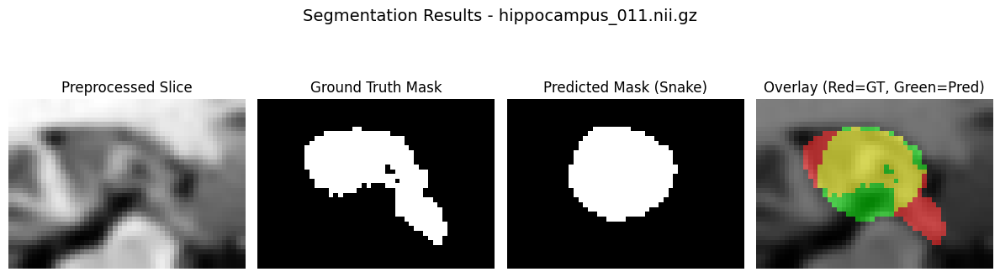

hippocampus_014.nii.gz
  Accuracy: 0.9579
  Dice Coefficient: 0.7515
  IoU: 0.6019



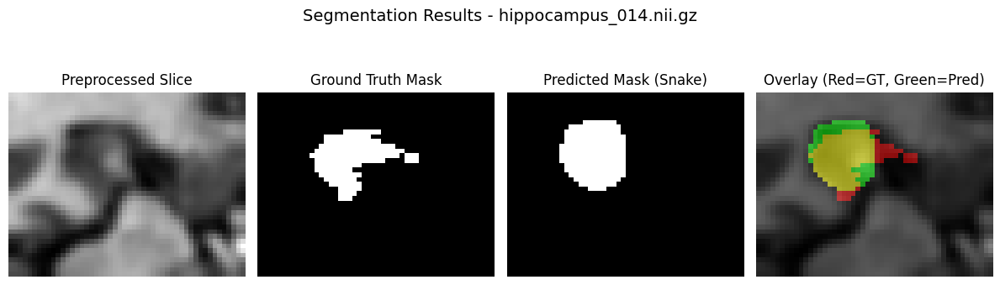

hippocampus_015.nii.gz
  Accuracy: 0.8394
  Dice Coefficient: 0.3092
  IoU: 0.1829



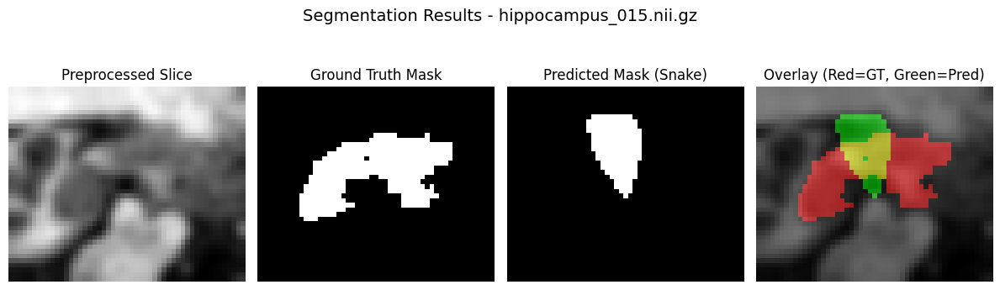

hippocampus_017.nii.gz
  Accuracy: 0.8571
  Dice Coefficient: 0.5472
  IoU: 0.3766



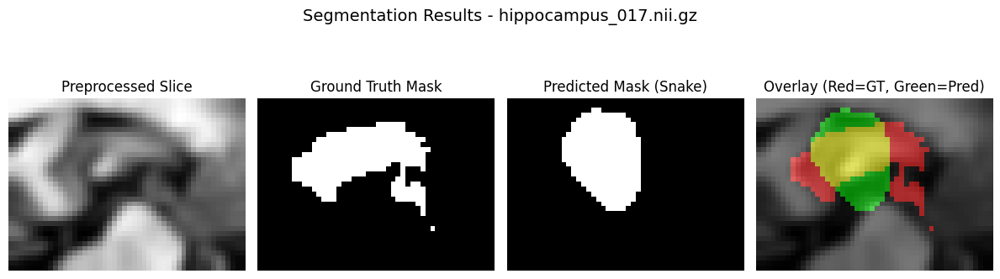

hippocampus_019.nii.gz
  Accuracy: 0.9722
  Dice Coefficient: 0.8240
  IoU: 0.7006



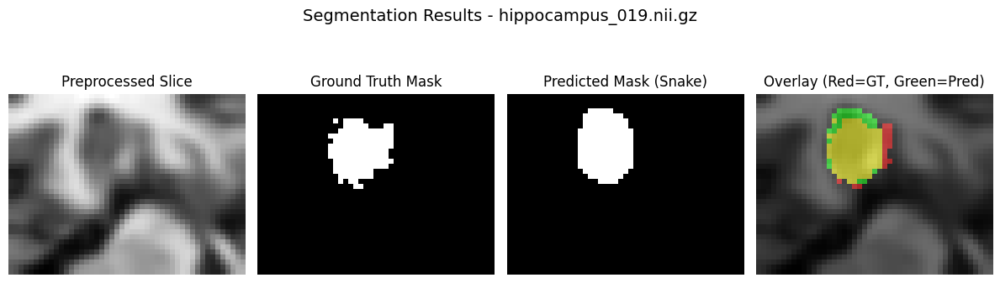

hippocampus_020.nii.gz
  Accuracy: 0.9746
  Dice Coefficient: 0.8091
  IoU: 0.6794



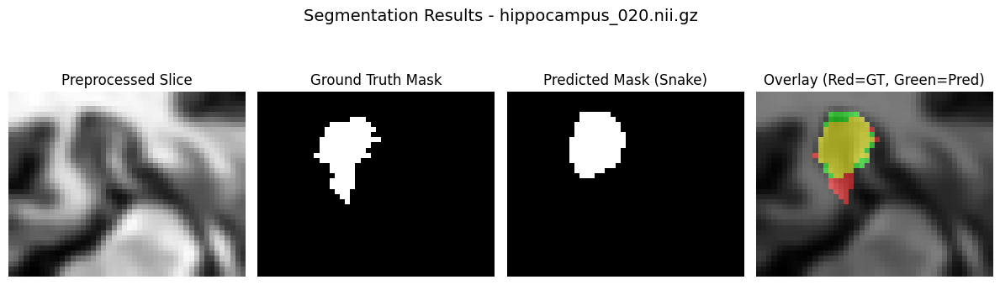

hippocampus_023.nii.gz
  Accuracy: 0.9529
  Dice Coefficient: 0.8056
  IoU: 0.6744



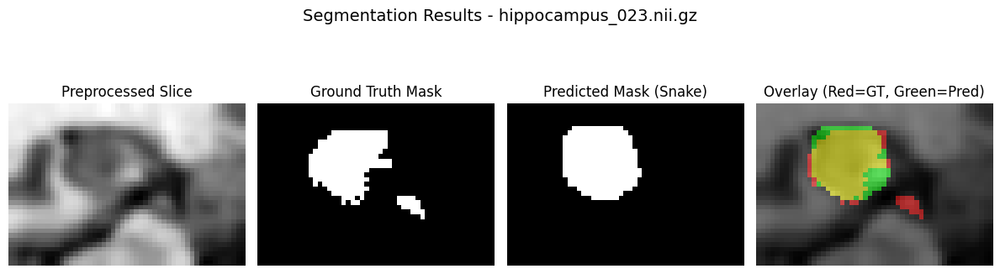

hippocampus_024.nii.gz
  Accuracy: 0.9676
  Dice Coefficient: 0.8431
  IoU: 0.7288



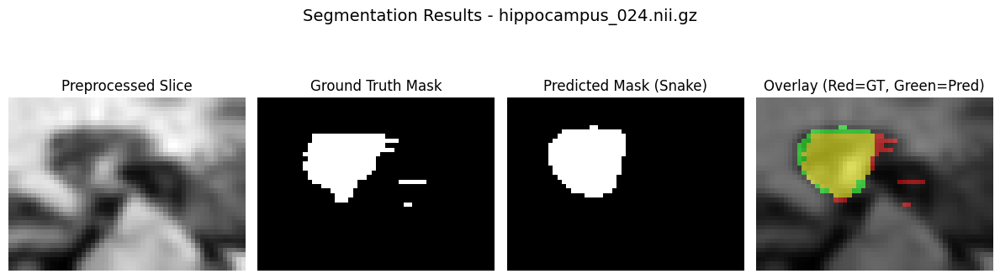

hippocampus_025.nii.gz
  Accuracy: 0.9375
  Dice Coefficient: 0.7789
  IoU: 0.6379



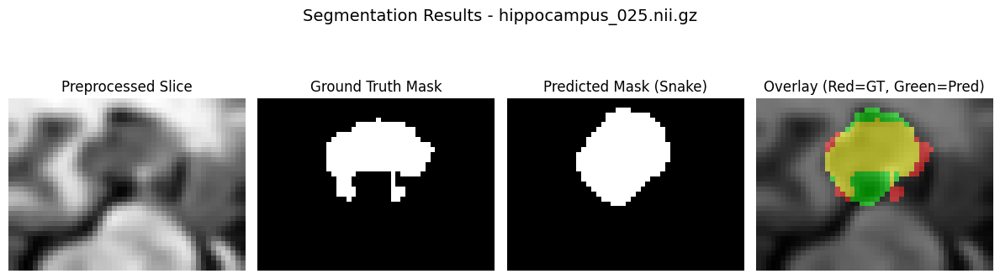

hippocampus_026.nii.gz
  Accuracy: 0.9489
  Dice Coefficient: 0.7778
  IoU: 0.6364



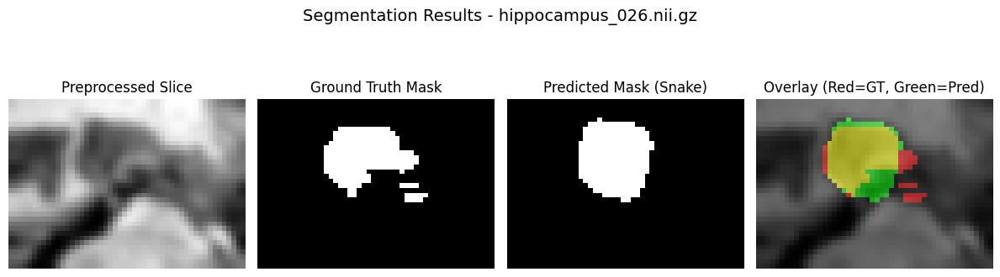

hippocampus_033.nii.gz
  Accuracy: 0.9659
  Dice Coefficient: 0.7970
  IoU: 0.6625



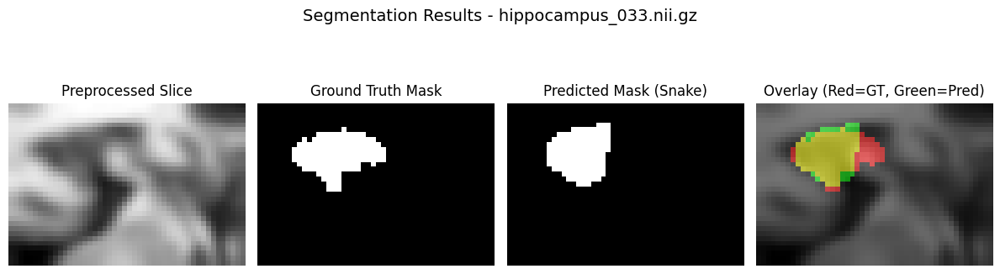

hippocampus_034.nii.gz
  Accuracy: 0.9711
  Dice Coefficient: 0.7866
  IoU: 0.6483



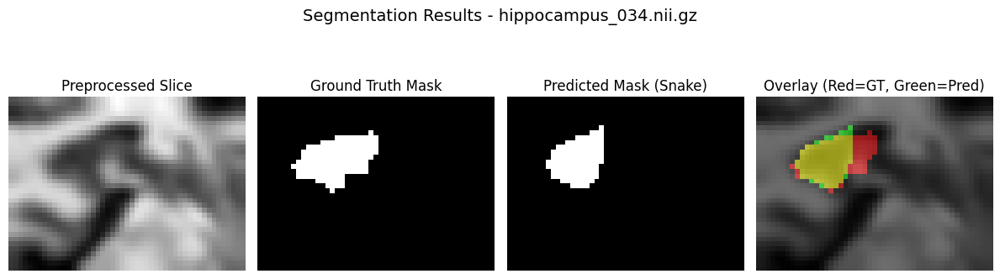

hippocampus_035.nii.gz
  Accuracy: 0.9508
  Dice Coefficient: 0.7731
  IoU: 0.6301



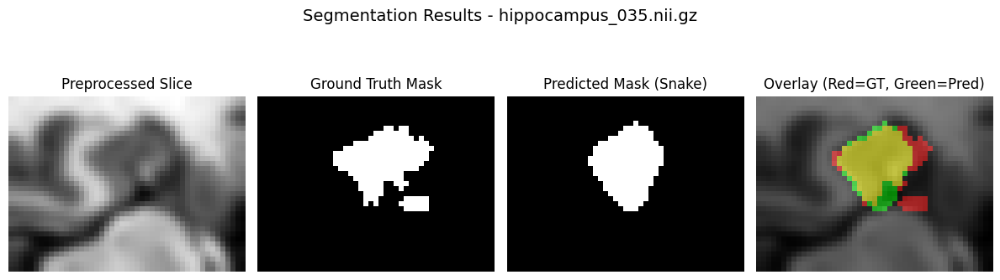

hippocampus_036.nii.gz
  Accuracy: 0.9817
  Dice Coefficient: 0.9022
  IoU: 0.8218



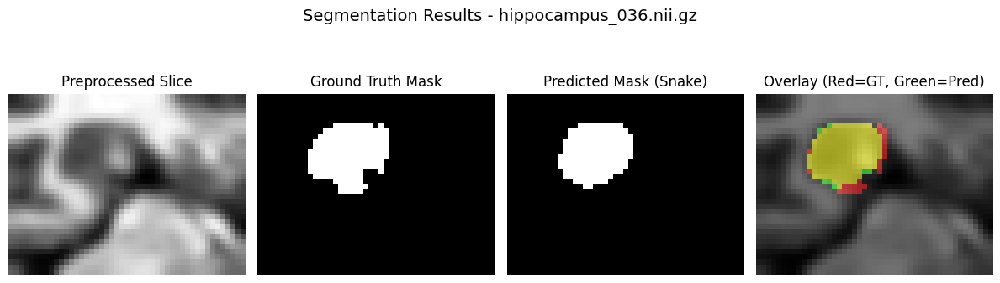

hippocampus_037.nii.gz
  Accuracy: 0.9452
  Dice Coefficient: 0.7453
  IoU: 0.5940



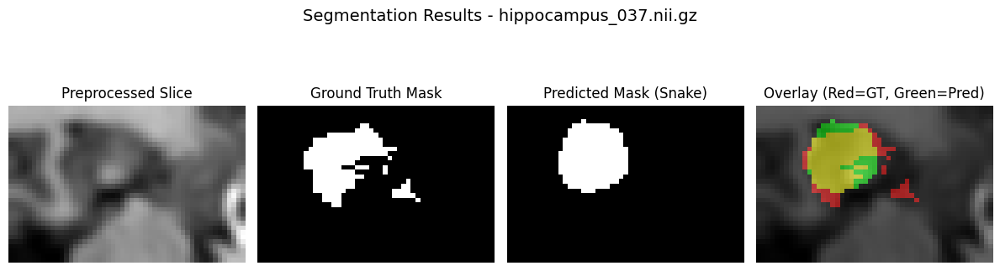

hippocampus_038.nii.gz
  Accuracy: 0.9115
  Dice Coefficient: 0.6613
  IoU: 0.4939



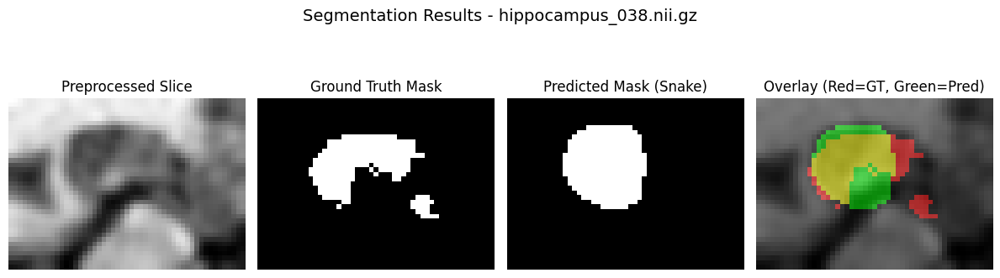

hippocampus_039.nii.gz
  Accuracy: 0.9234
  Dice Coefficient: 0.7544
  IoU: 0.6057



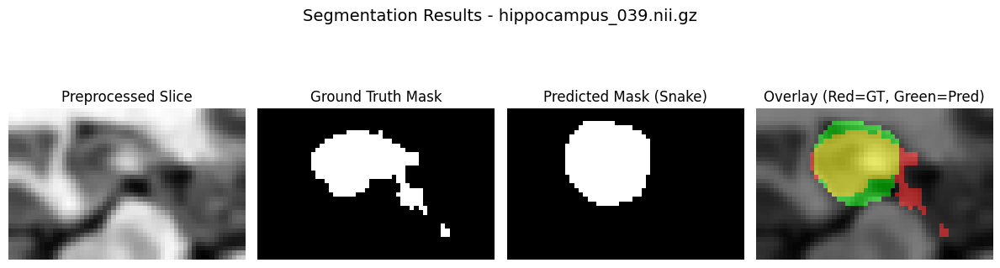

hippocampus_040.nii.gz
  Accuracy: 0.9268
  Dice Coefficient: 0.7054
  IoU: 0.5449



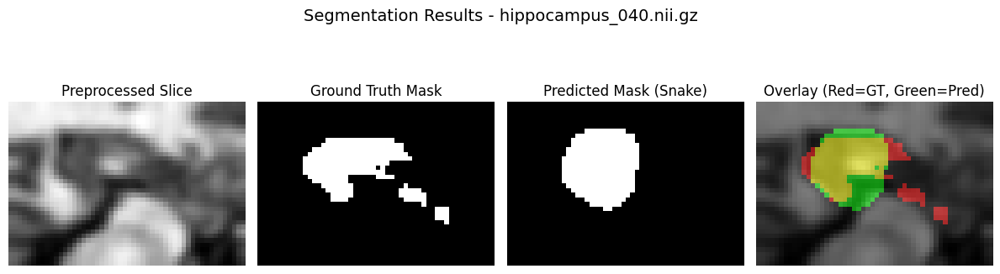

hippocampus_041.nii.gz
  Accuracy: 0.9619
  Dice Coefficient: 0.8077
  IoU: 0.6774



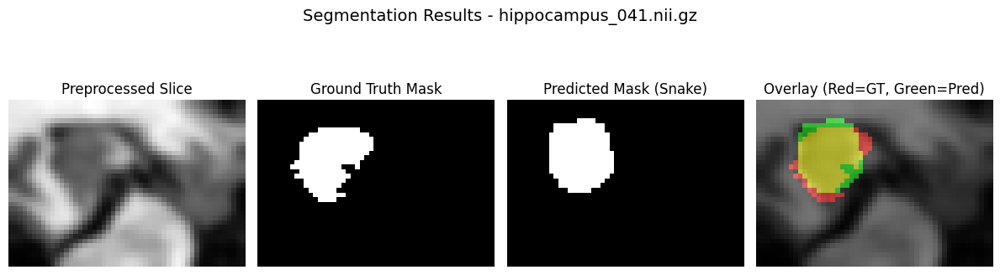

hippocampus_042.nii.gz
  Accuracy: 0.9319
  Dice Coefficient: 0.7321
  IoU: 0.5774



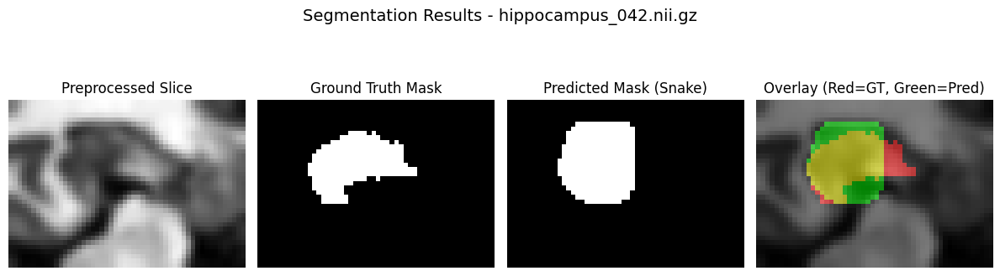

hippocampus_044.nii.gz
  Accuracy: 0.9638
  Dice Coefficient: 0.8500
  IoU: 0.7391



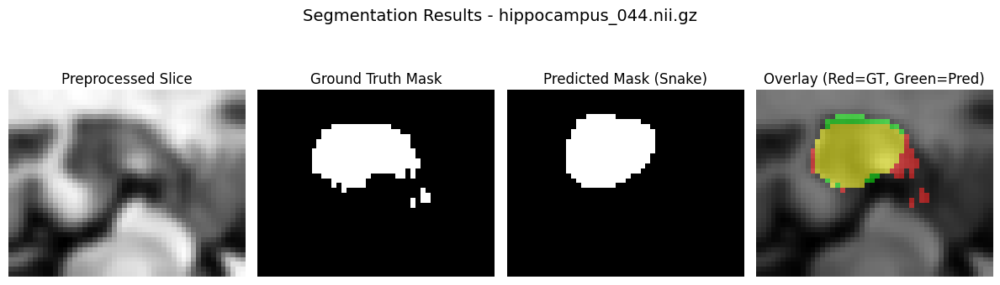

hippocampus_045.nii.gz
  Accuracy: 0.9688
  Dice Coefficient: 0.8138
  IoU: 0.6860



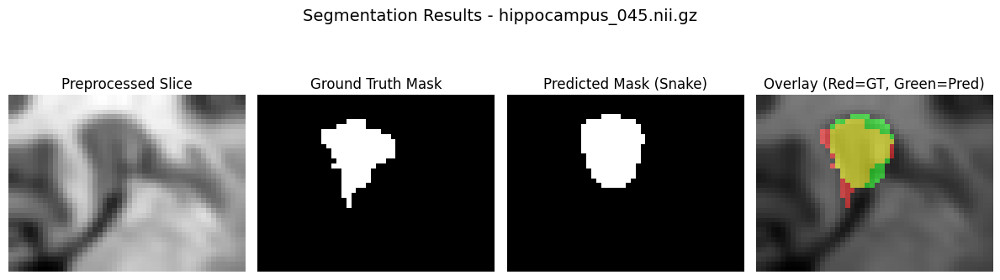

hippocampus_046.nii.gz
  Accuracy: 0.9751
  Dice Coefficient: 0.8167
  IoU: 0.6901



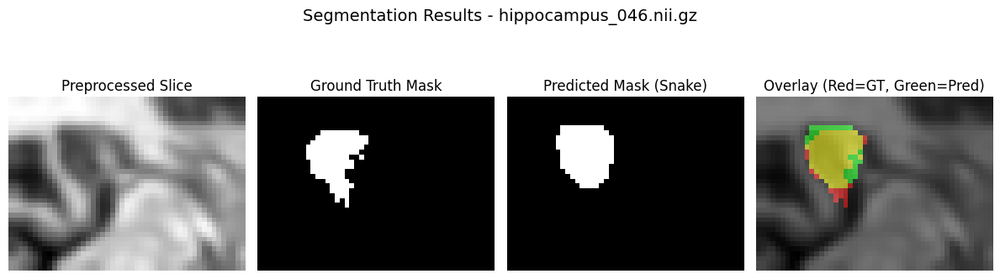

hippocampus_048.nii.gz
  Accuracy: 0.8573
  Dice Coefficient: 0.5580
  IoU: 0.3870



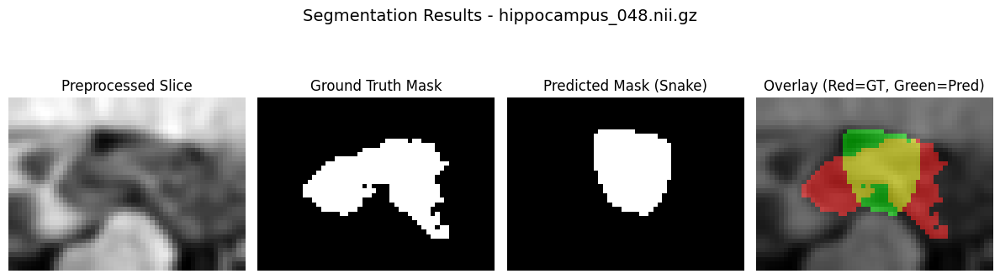

hippocampus_049.nii.gz
  Accuracy: 0.9658
  Dice Coefficient: 0.8039
  IoU: 0.6720



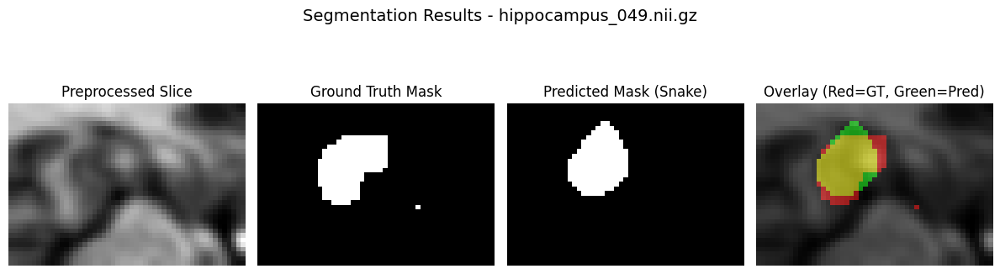

hippocampus_050.nii.gz
  Accuracy: 0.9694
  Dice Coefficient: 0.8606
  IoU: 0.7554



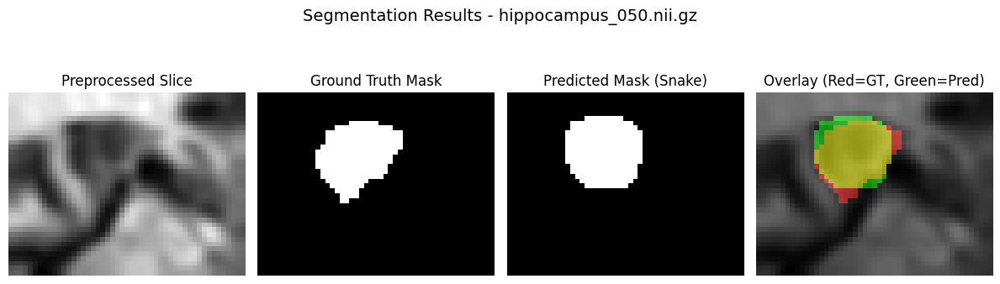

hippocampus_051.nii.gz
  Accuracy: 0.9770
  Dice Coefficient: 0.8453
  IoU: 0.7320



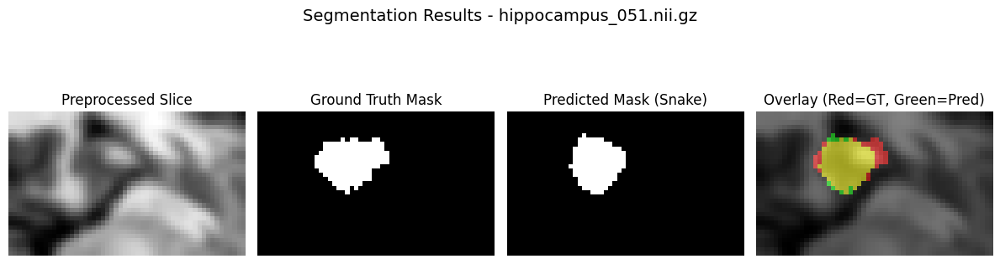

hippocampus_052.nii.gz
  Accuracy: 0.9695
  Dice Coefficient: 0.7891
  IoU: 0.6516



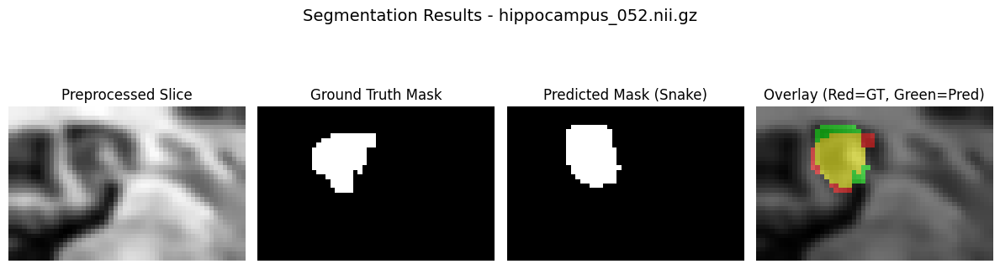

hippocampus_053.nii.gz
  Accuracy: 0.9772
  Dice Coefficient: 0.8542
  IoU: 0.7456



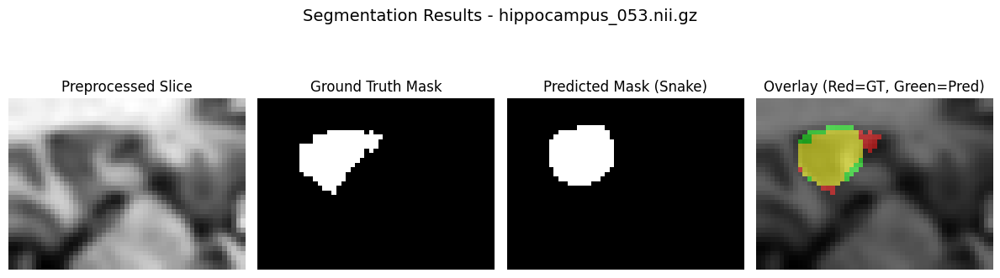

hippocampus_056.nii.gz
  Accuracy: 0.9720
  Dice Coefficient: 0.8483
  IoU: 0.7366



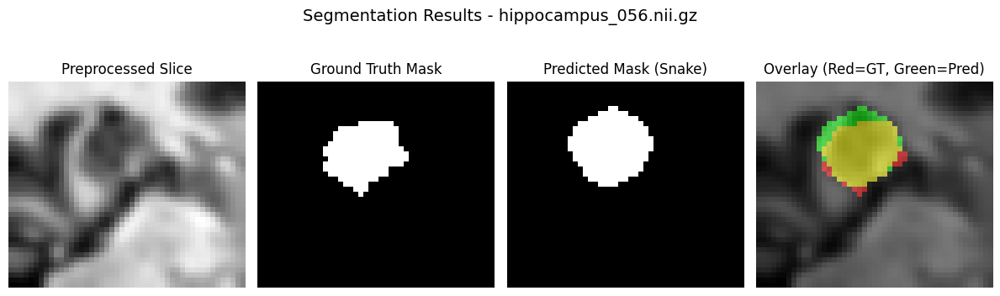

hippocampus_057.nii.gz
  Accuracy: 0.9625
  Dice Coefficient: 0.8024
  IoU: 0.6700



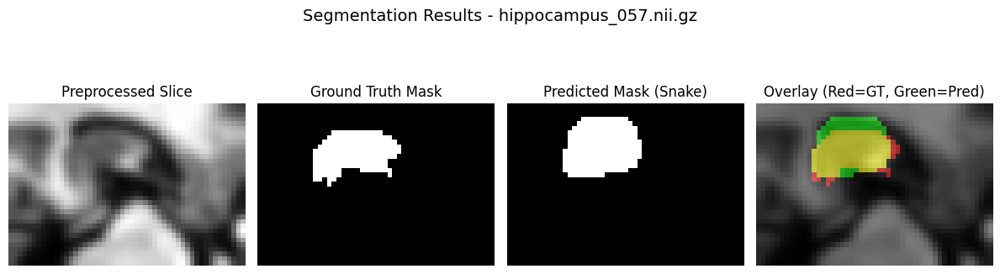

hippocampus_058.nii.gz
  Accuracy: 0.9678
  Dice Coefficient: 0.7290
  IoU: 0.5735



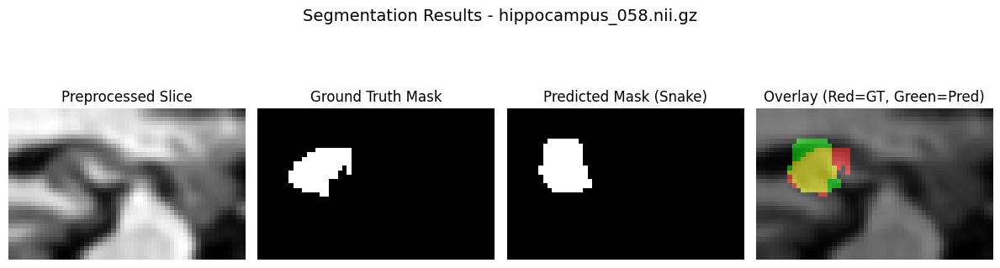

hippocampus_060.nii.gz
  Accuracy: 0.9053
  Dice Coefficient: 0.6322
  IoU: 0.4622



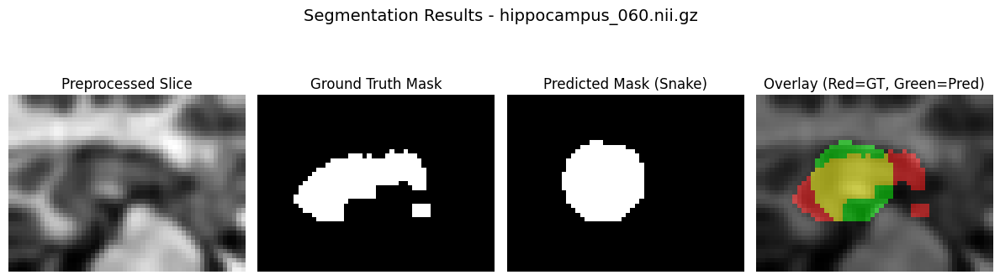

hippocampus_064.nii.gz
  Accuracy: 0.9644
  Dice Coefficient: 0.8092
  IoU: 0.6796



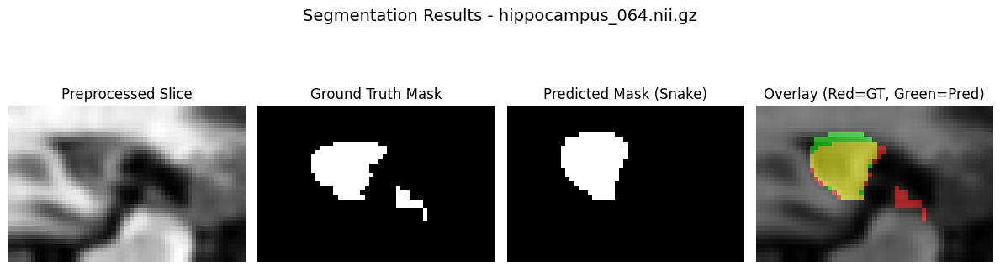

hippocampus_065.nii.gz
  Accuracy: 0.9625
  Dice Coefficient: 0.8390
  IoU: 0.7226



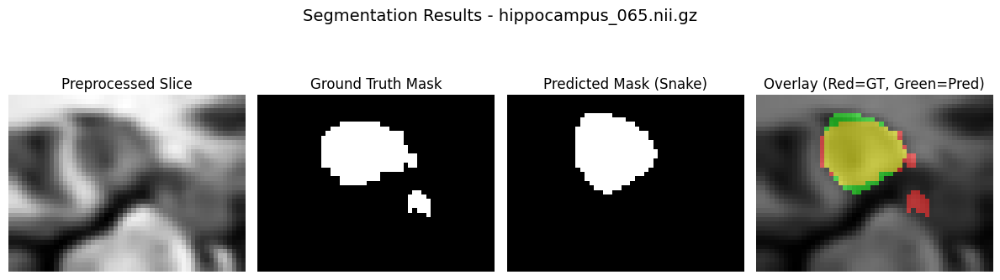

hippocampus_067.nii.gz
  Accuracy: 0.9577
  Dice Coefficient: 0.8171
  IoU: 0.6908



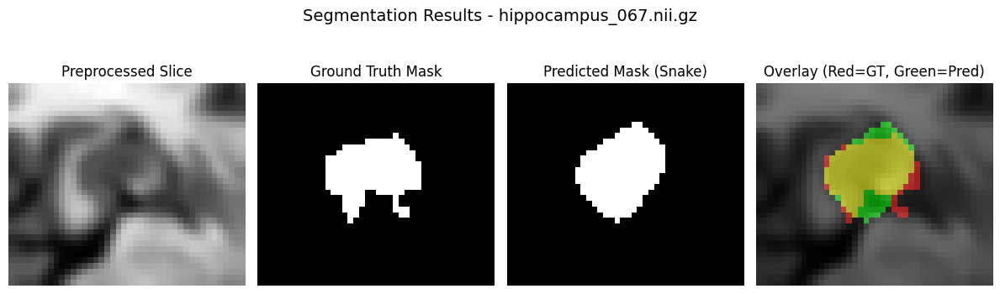

hippocampus_068.nii.gz
  Accuracy: 0.9785
  Dice Coefficient: 0.8584
  IoU: 0.7520



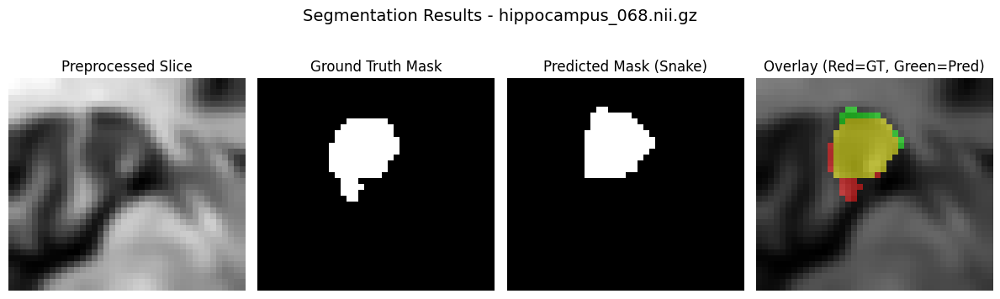

hippocampus_070.nii.gz
  Accuracy: 0.9795
  Dice Coefficient: 0.8582
  IoU: 0.7516



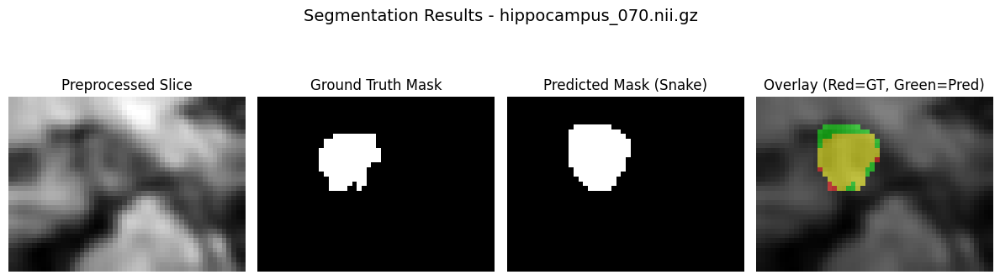

hippocampus_074.nii.gz
  Accuracy: 0.9741
  Dice Coefficient: 0.8760
  IoU: 0.7794



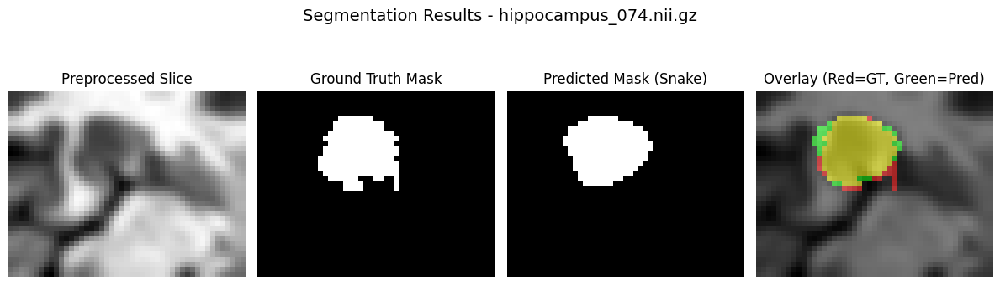

hippocampus_075.nii.gz
  Accuracy: 0.9641
  Dice Coefficient: 0.8015
  IoU: 0.6687



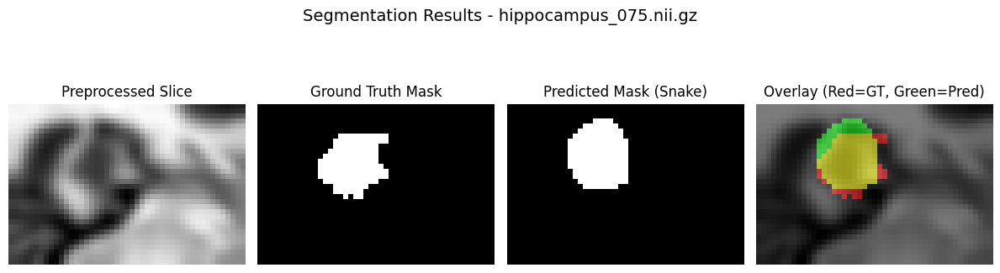

hippocampus_077.nii.gz
  Accuracy: 0.9708
  Dice Coefficient: 0.8017
  IoU: 0.6690



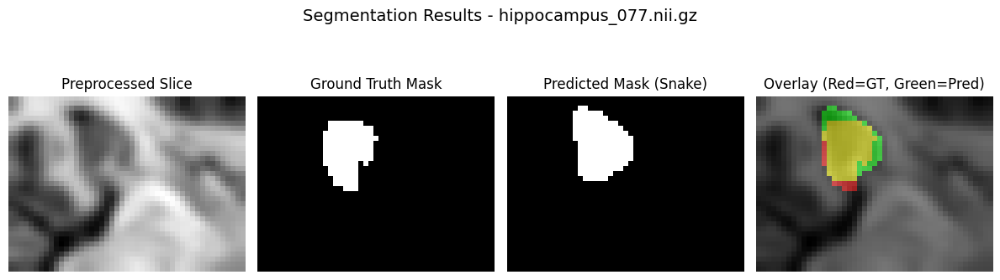

hippocampus_083.nii.gz
  Accuracy: 0.9604
  Dice Coefficient: 0.8000
  IoU: 0.6667



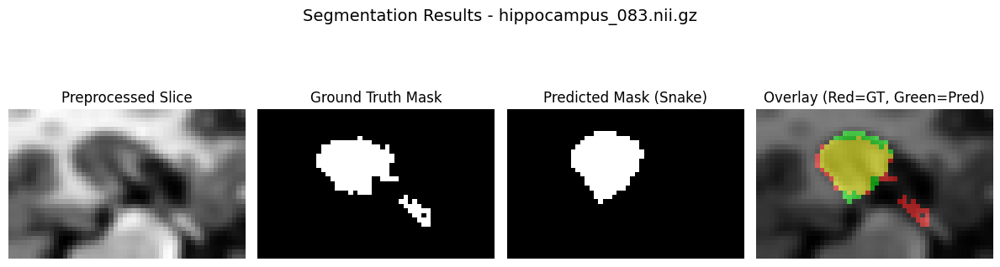

hippocampus_084.nii.gz
  Accuracy: 0.9745
  Dice Coefficient: 0.8249
  IoU: 0.7020



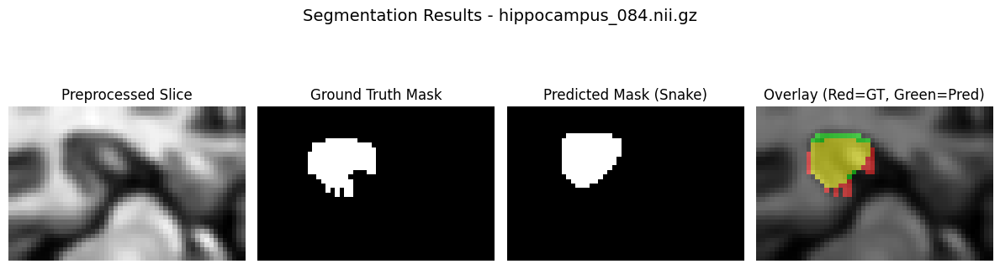

hippocampus_087.nii.gz
  Accuracy: 0.9283
  Dice Coefficient: 0.5714
  IoU: 0.4000



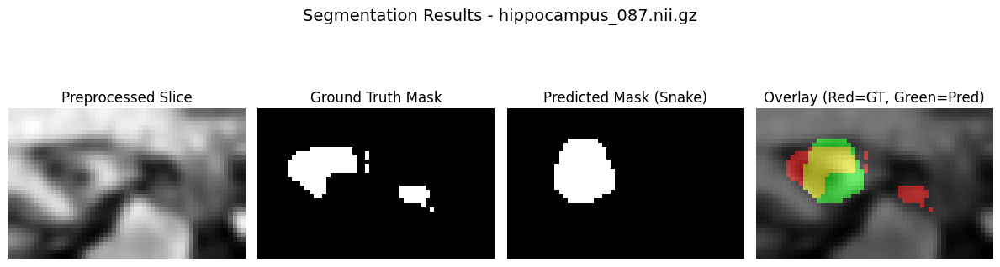

hippocampus_088.nii.gz
  Accuracy: 0.9173
  Dice Coefficient: 0.7456
  IoU: 0.5943



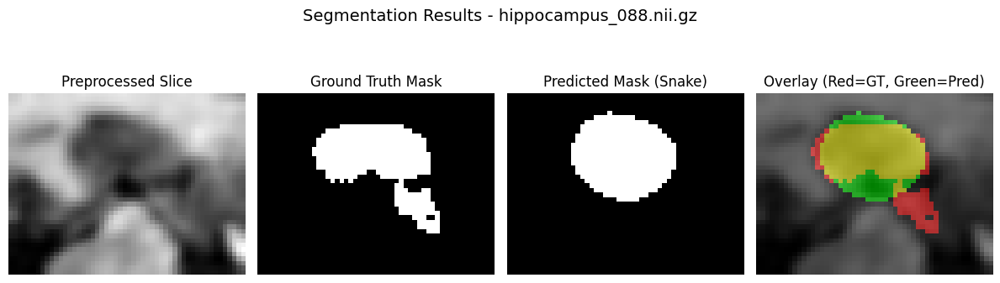

hippocampus_089.nii.gz
  Accuracy: 0.9717
  Dice Coefficient: 0.8874
  IoU: 0.7975



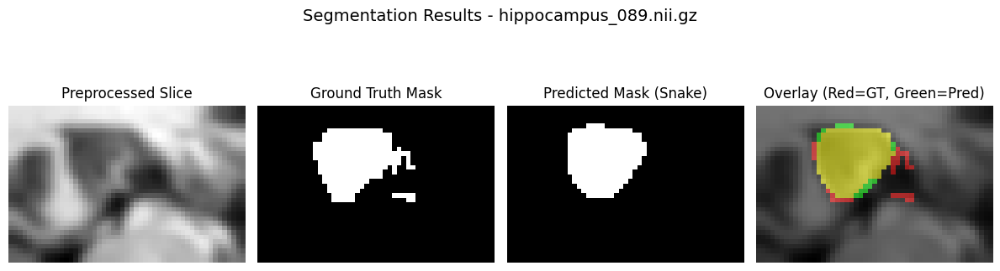

hippocampus_090.nii.gz
  Accuracy: 0.9849
  Dice Coefficient: 0.9239
  IoU: 0.8586



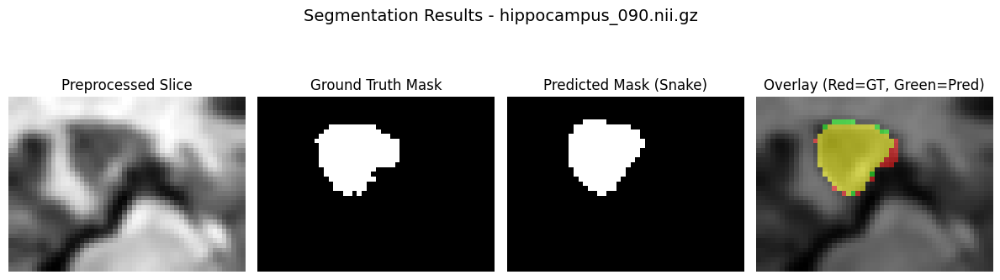

hippocampus_091.nii.gz
  Accuracy: 0.9101
  Dice Coefficient: 0.6275
  IoU: 0.4572



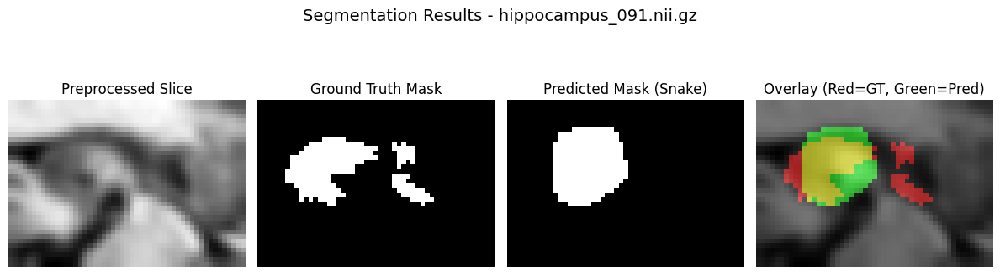

hippocampus_092.nii.gz
  Accuracy: 0.9538
  Dice Coefficient: 0.7543
  IoU: 0.6055



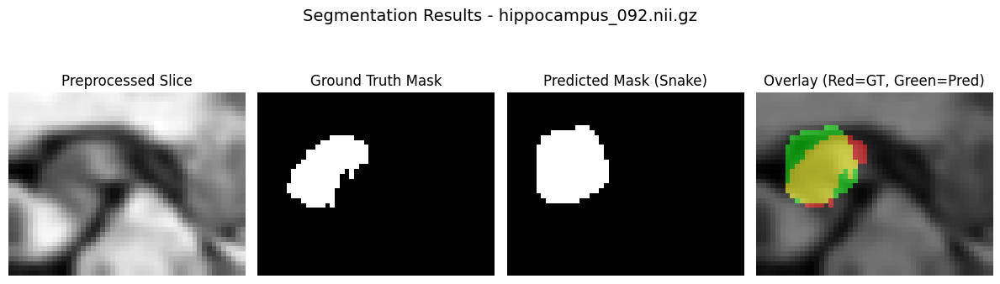

hippocampus_093.nii.gz
  Accuracy: 0.9473
  Dice Coefficient: 0.8211
  IoU: 0.6965



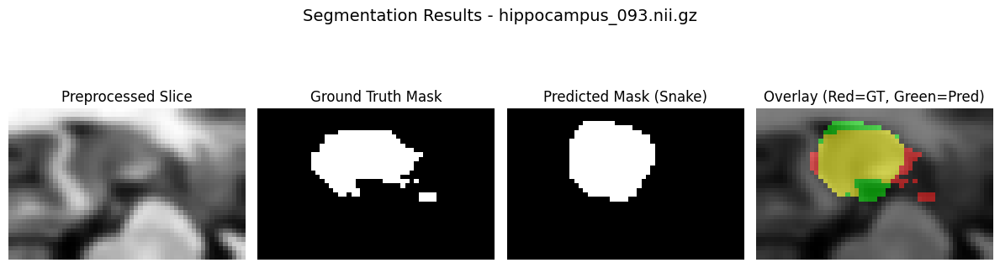

hippocampus_094.nii.gz
  Accuracy: 0.9595
  Dice Coefficient: 0.7947
  IoU: 0.6593



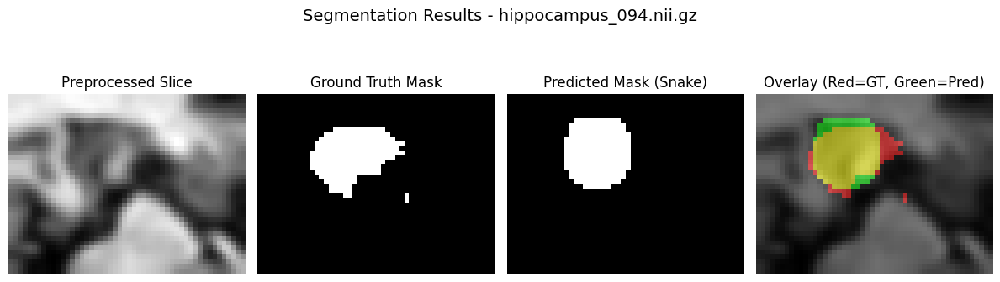

hippocampus_095.nii.gz
  Accuracy: 0.9616
  Dice Coefficient: 0.7288
  IoU: 0.5733



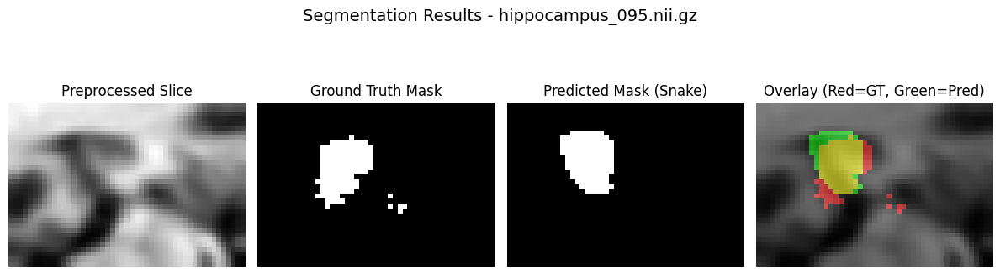

hippocampus_096.nii.gz
  Accuracy: 0.9731
  Dice Coefficient: 0.7514
  IoU: 0.6019



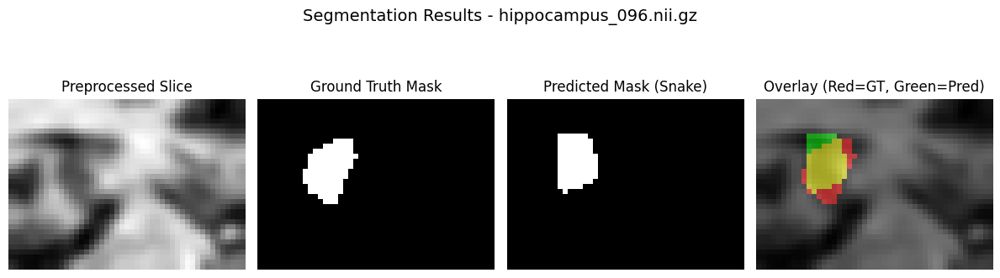

hippocampus_097.nii.gz
  Accuracy: 0.9398
  Dice Coefficient: 0.7249
  IoU: 0.5685



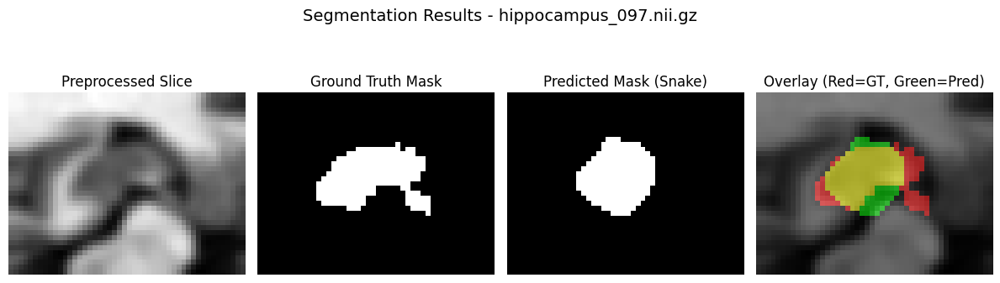

hippocampus_098.nii.gz
  Accuracy: 0.9240
  Dice Coefficient: 0.7295
  IoU: 0.5741



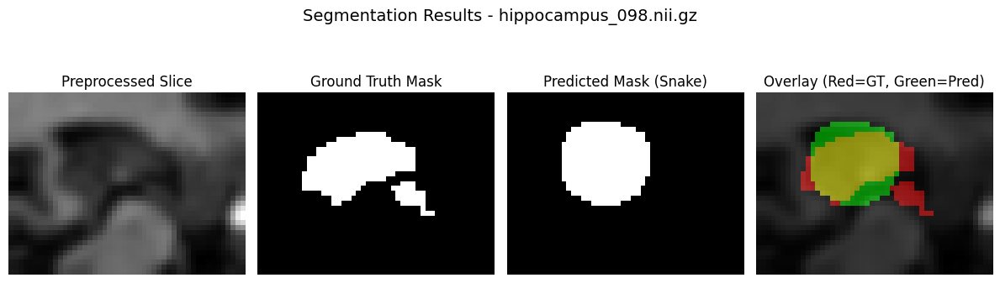

hippocampus_099.nii.gz
  Accuracy: 0.8304
  Dice Coefficient: 0.5284
  IoU: 0.3590



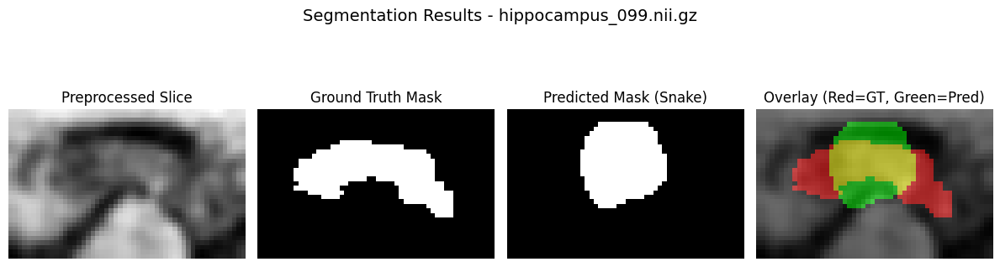

hippocampus_101.nii.gz
  Accuracy: 0.9525
  Dice Coefficient: 0.7769
  IoU: 0.6352



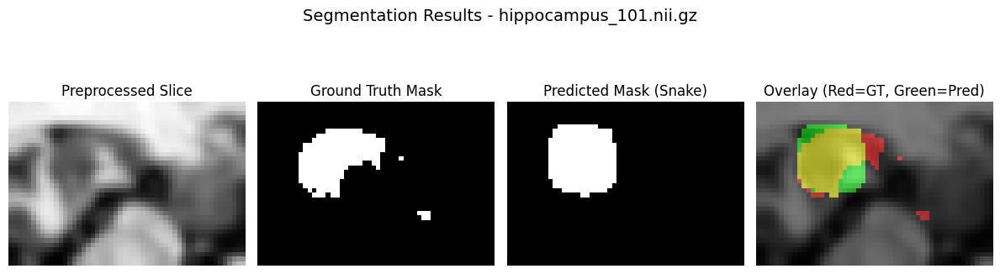

hippocampus_102.nii.gz
  Accuracy: 0.9465
  Dice Coefficient: 0.7558
  IoU: 0.6074



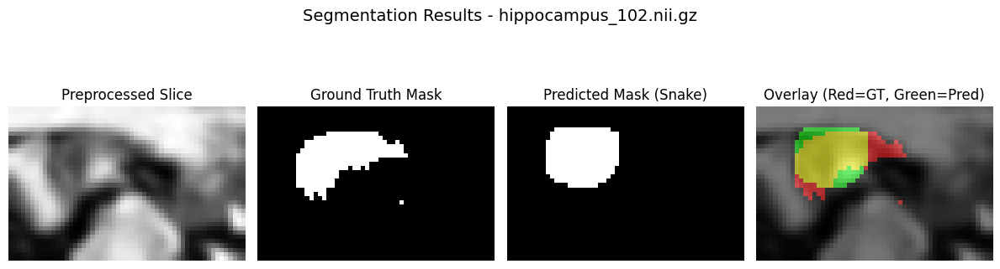

hippocampus_104.nii.gz
  Accuracy: 0.9547
  Dice Coefficient: 0.7778
  IoU: 0.6364



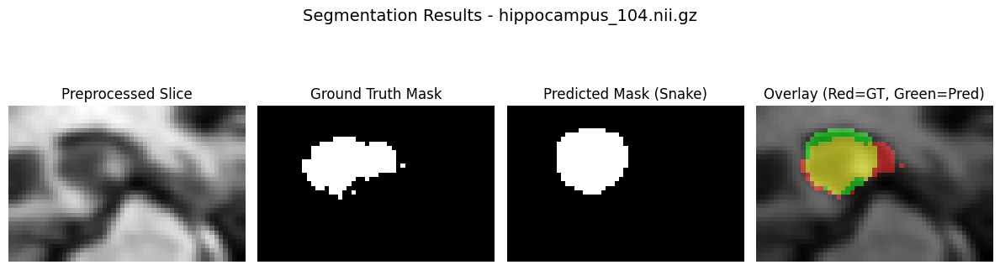

hippocampus_105.nii.gz
  Accuracy: 0.9826
  Dice Coefficient: 0.9072
  IoU: 0.8302



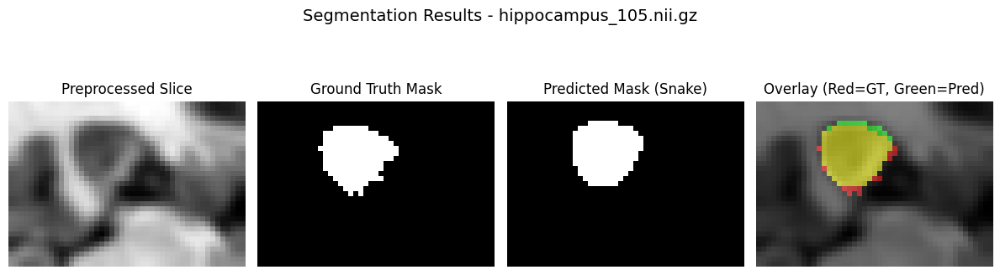

hippocampus_106.nii.gz
  Accuracy: 0.9827
  Dice Coefficient: 0.8889
  IoU: 0.8000



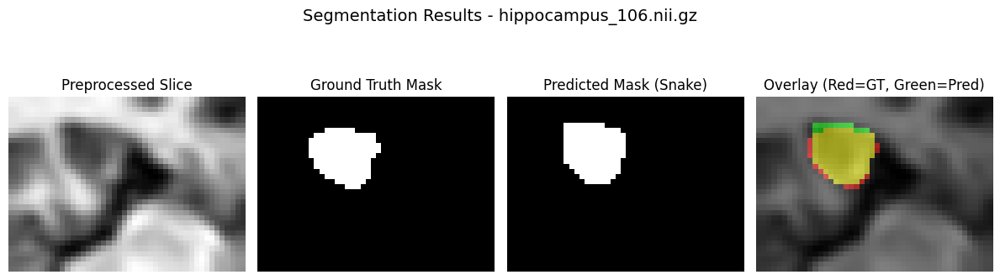

hippocampus_107.nii.gz
  Accuracy: 0.9621
  Dice Coefficient: 0.8416
  IoU: 0.7266



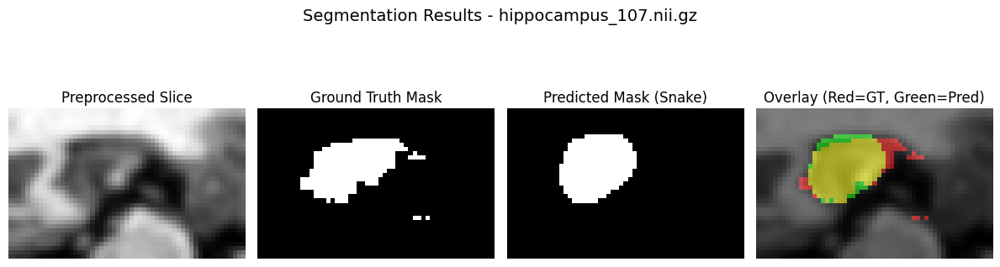

hippocampus_108.nii.gz
  Accuracy: 0.9329
  Dice Coefficient: 0.7838
  IoU: 0.6444



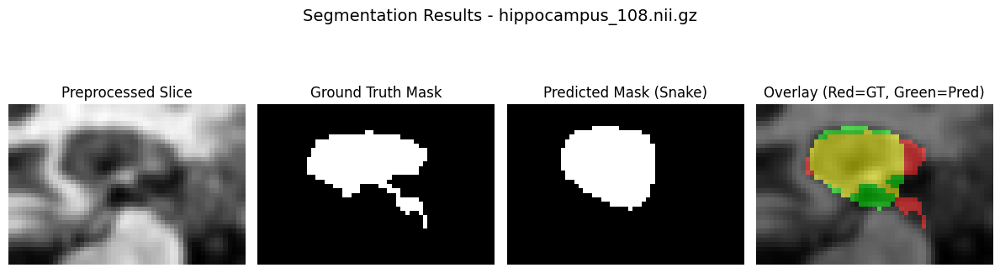

hippocampus_109.nii.gz
  Accuracy: 0.9768
  Dice Coefficient: 0.8498
  IoU: 0.7389



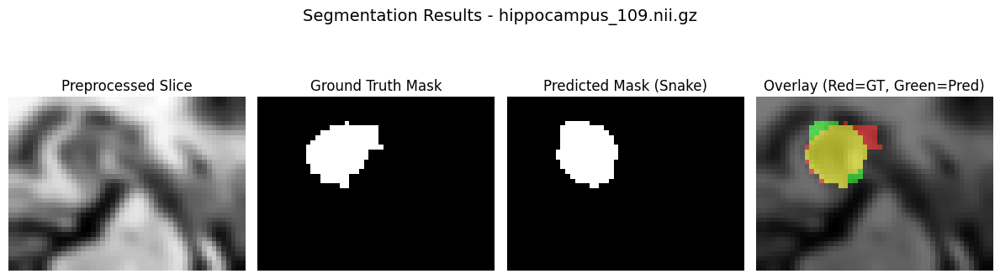

hippocampus_114.nii.gz
  Accuracy: 0.9542
  Dice Coefficient: 0.7914
  IoU: 0.6548



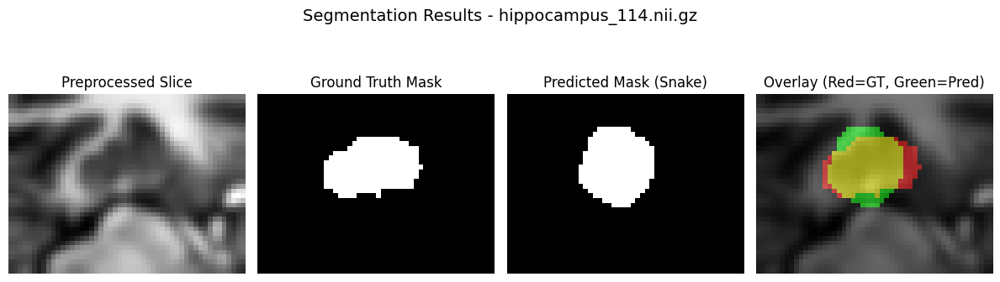

hippocampus_123.nii.gz
  Accuracy: 0.9546
  Dice Coefficient: 0.7094
  IoU: 0.5497



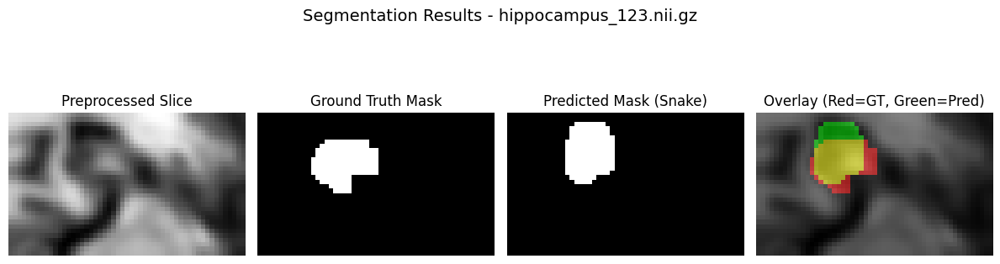

hippocampus_124.nii.gz
  Accuracy: 0.9709
  Dice Coefficient: 0.7926
  IoU: 0.6564



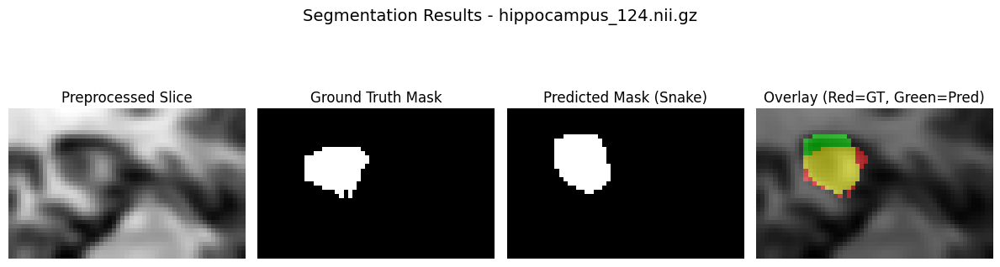

hippocampus_125.nii.gz
  Accuracy: 0.9618
  Dice Coefficient: 0.8279
  IoU: 0.7064



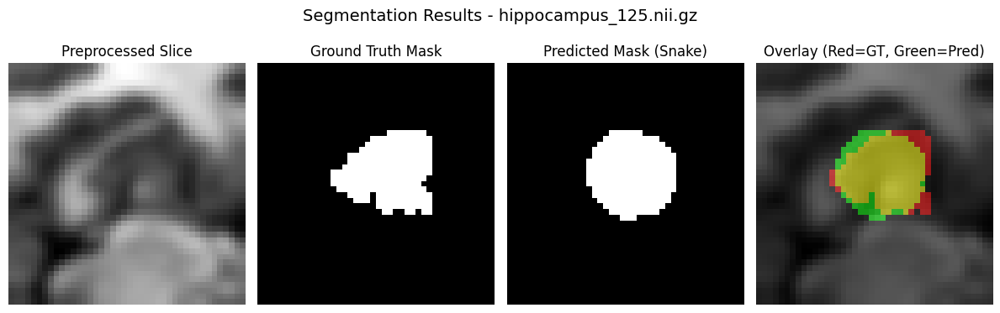

hippocampus_126.nii.gz
  Accuracy: 0.9761
  Dice Coefficient: 0.8255
  IoU: 0.7029



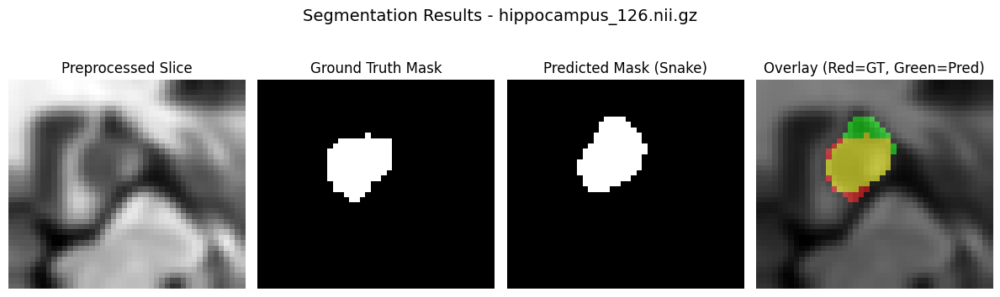

hippocampus_127.nii.gz
  Accuracy: 0.9187
  Dice Coefficient: 0.7424
  IoU: 0.5904



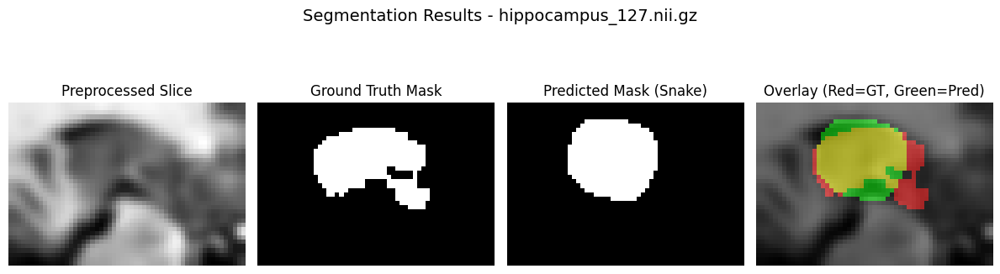

hippocampus_130.nii.gz
  Accuracy: 0.9394
  Dice Coefficient: 0.7079
  IoU: 0.5478



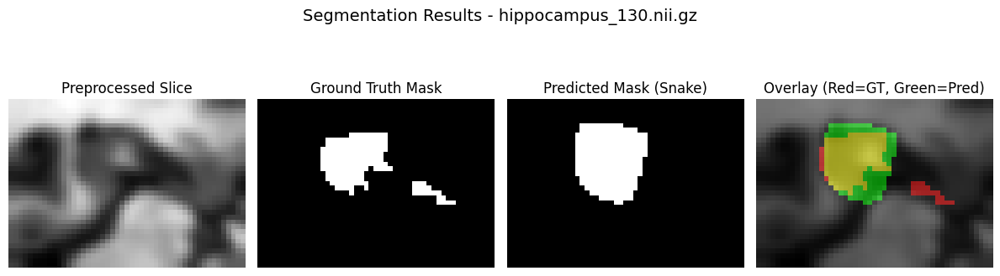

hippocampus_132.nii.gz
  Accuracy: 0.9667
  Dice Coefficient: 0.8324
  IoU: 0.7129



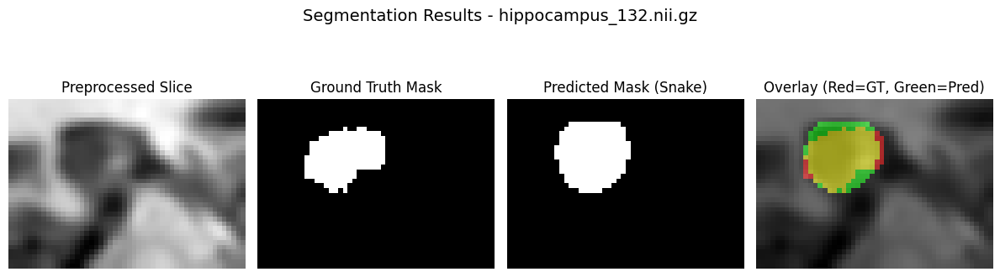

hippocampus_133.nii.gz
  Accuracy: 0.9731
  Dice Coefficient: 0.8599
  IoU: 0.7543



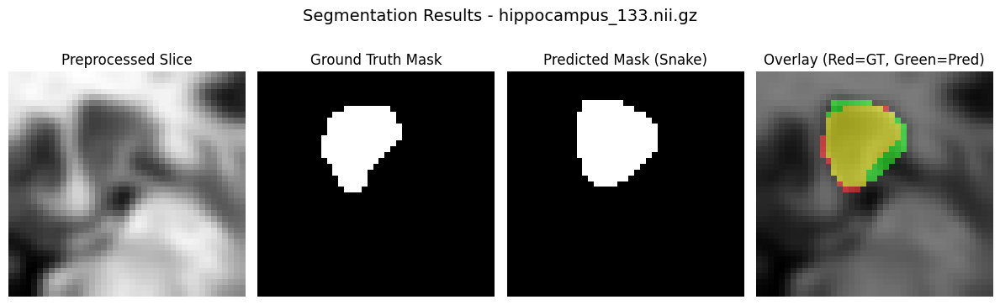

hippocampus_135.nii.gz
  Accuracy: 0.9688
  Dice Coefficient: 0.7860
  IoU: 0.6475



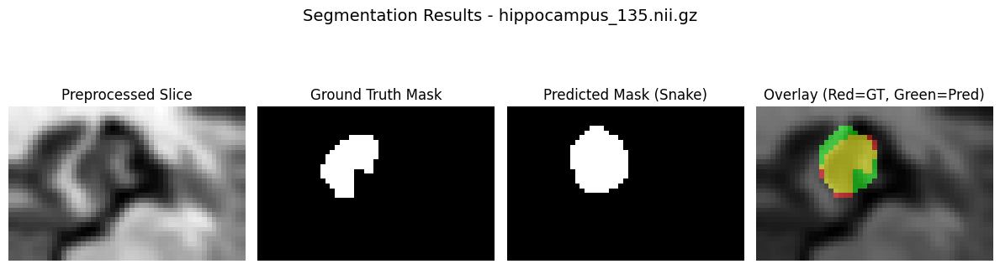

hippocampus_136.nii.gz
  Accuracy: 0.9658
  Dice Coefficient: 0.7673
  IoU: 0.6225



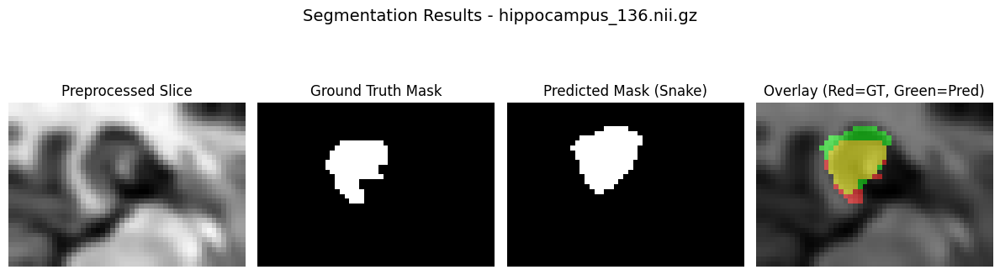

hippocampus_138.nii.gz
  Accuracy: 0.9626
  Dice Coefficient: 0.7660
  IoU: 0.6207



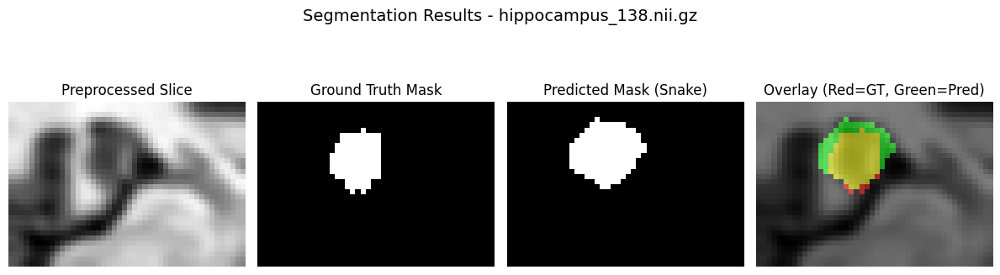

hippocampus_141.nii.gz
  Accuracy: 0.9656
  Dice Coefficient: 0.7788
  IoU: 0.6377



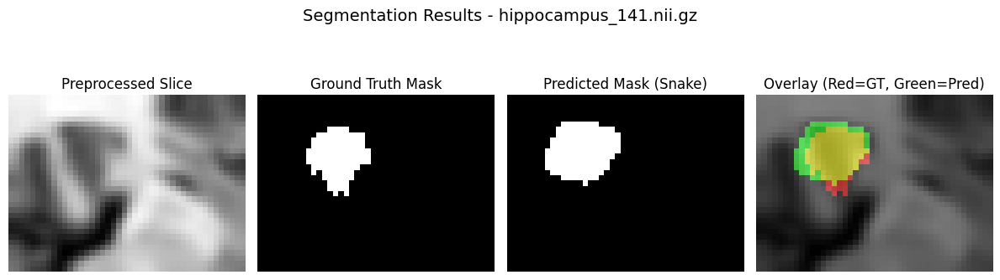

hippocampus_142.nii.gz
  Accuracy: 0.9645
  Dice Coefficient: 0.8105
  IoU: 0.6813



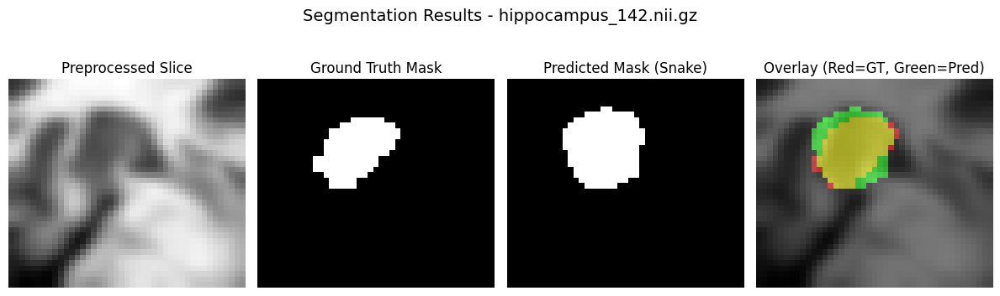

hippocampus_143.nii.gz
  Accuracy: 0.9750
  Dice Coefficient: 0.8125
  IoU: 0.6842



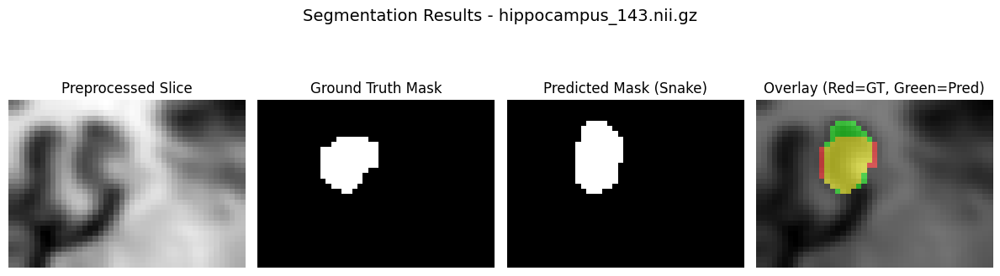

hippocampus_144.nii.gz
  Accuracy: 0.9804
  Dice Coefficient: 0.8235
  IoU: 0.7000



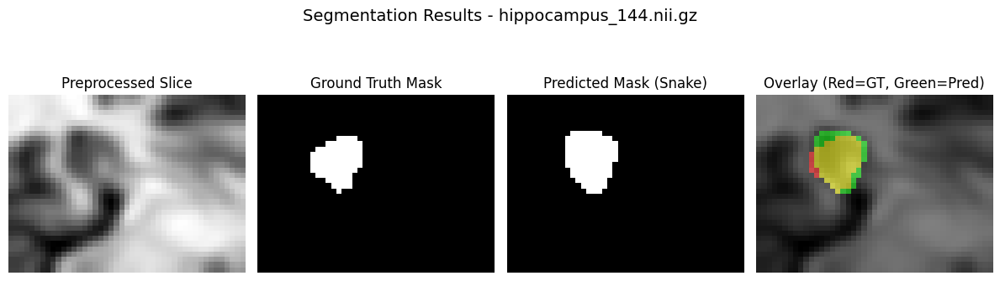

hippocampus_145.nii.gz
  Accuracy: 0.9287
  Dice Coefficient: 0.7964
  IoU: 0.6617



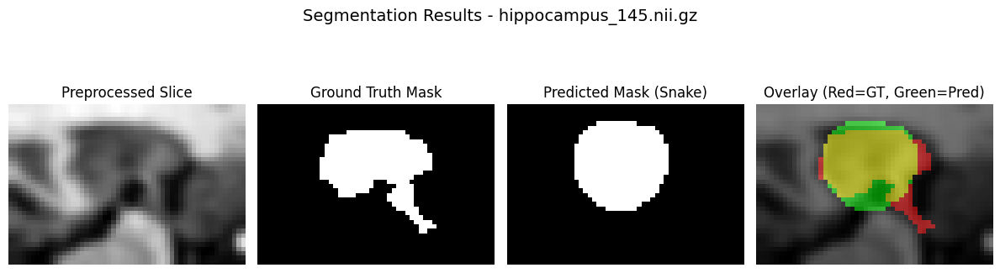

hippocampus_146.nii.gz
  Accuracy: 0.9237
  Dice Coefficient: 0.7544
  IoU: 0.6056



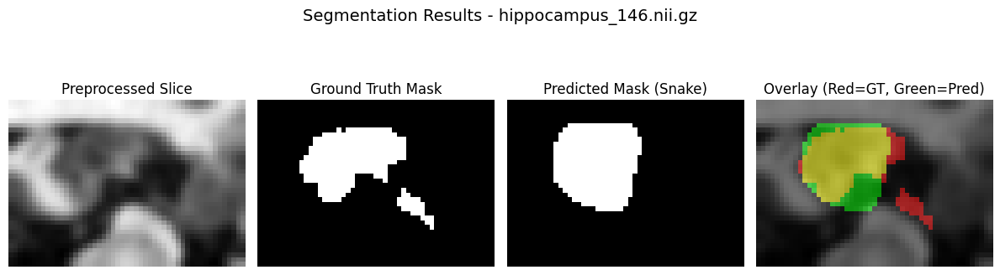

hippocampus_148.nii.gz
  Accuracy: 0.9626
  Dice Coefficient: 0.8347
  IoU: 0.7163



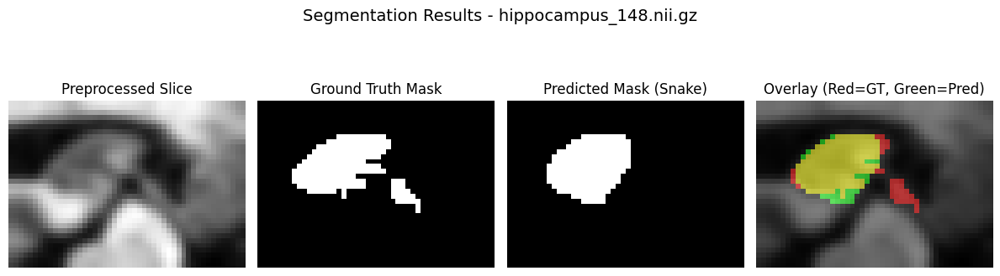

hippocampus_149.nii.gz
  Accuracy: 0.9054
  Dice Coefficient: 0.6884
  IoU: 0.5248



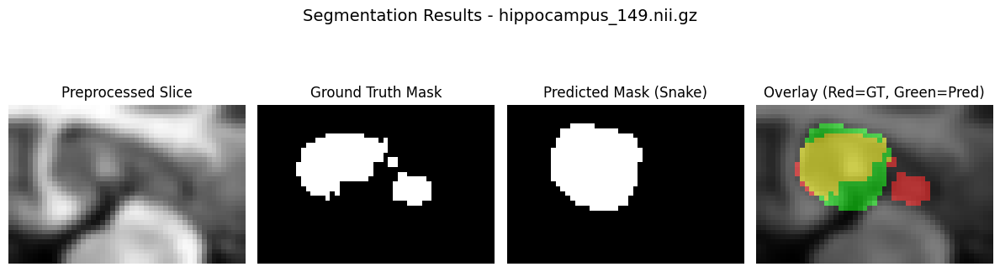

hippocampus_150.nii.gz
  Accuracy: 0.9835
  Dice Coefficient: 0.8921
  IoU: 0.8052



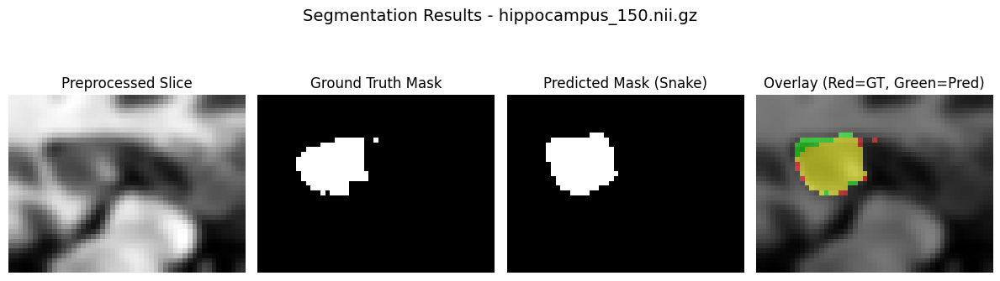

hippocampus_152.nii.gz
  Accuracy: 0.9623
  Dice Coefficient: 0.7931
  IoU: 0.6571



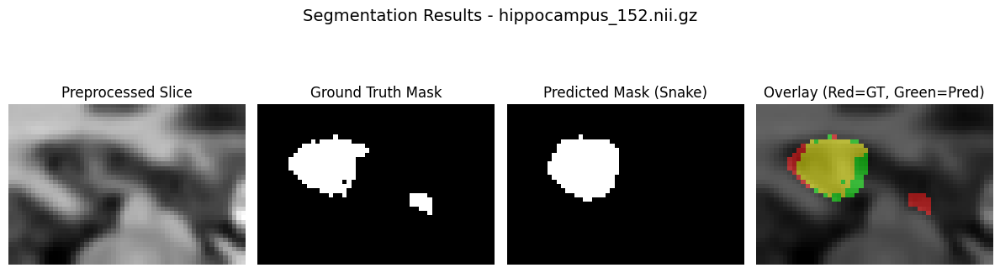

hippocampus_154.nii.gz
  Accuracy: 0.9627
  Dice Coefficient: 0.7902
  IoU: 0.6532



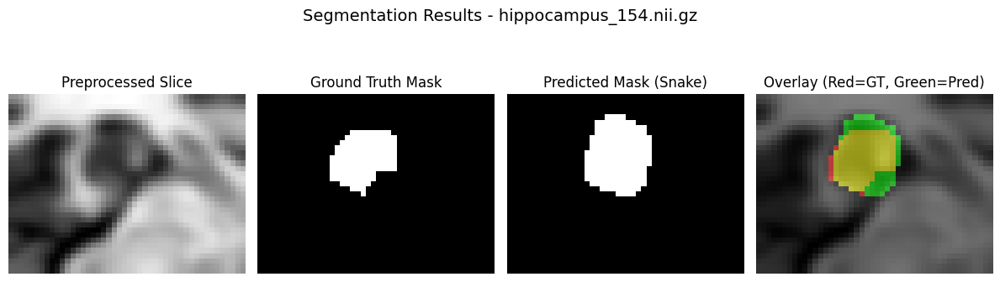

hippocampus_155.nii.gz
  Accuracy: 0.8996
  Dice Coefficient: 0.6642
  IoU: 0.4972



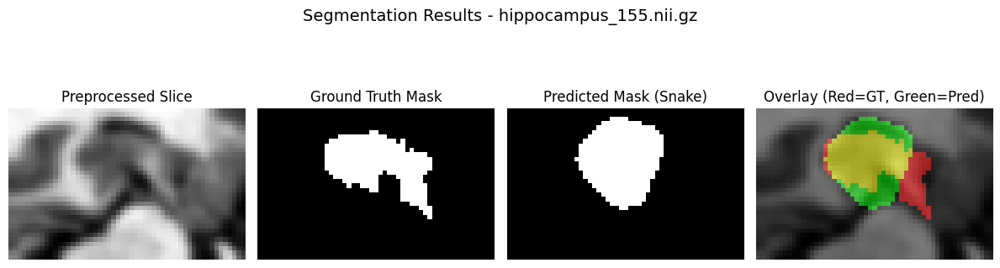

hippocampus_156.nii.gz
  Accuracy: 0.9658
  Dice Coefficient: 0.7908
  IoU: 0.6541



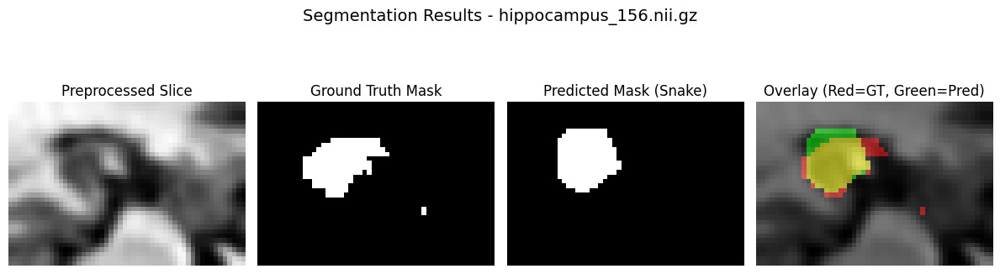

hippocampus_157.nii.gz
  Accuracy: 0.9553
  Dice Coefficient: 0.7819
  IoU: 0.6419



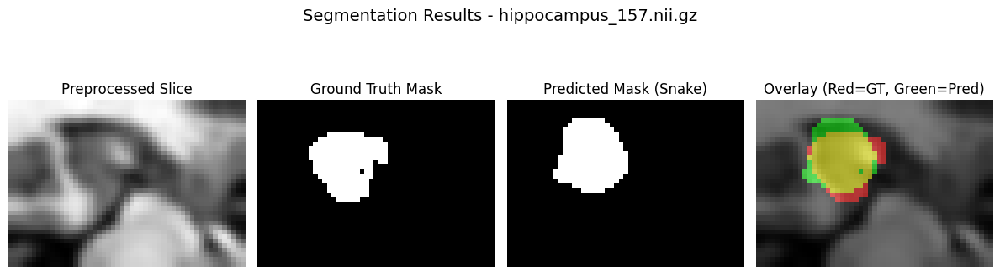

hippocampus_158.nii.gz
  Accuracy: 0.9722
  Dice Coefficient: 0.8378
  IoU: 0.7208



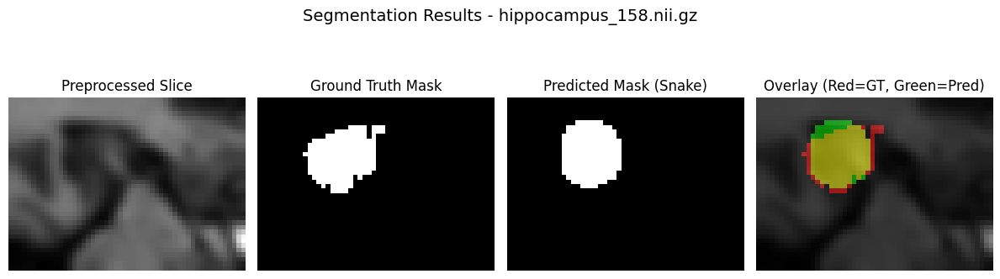

hippocampus_160.nii.gz
  Accuracy: 0.8593
  Dice Coefficient: 0.6102
  IoU: 0.4391



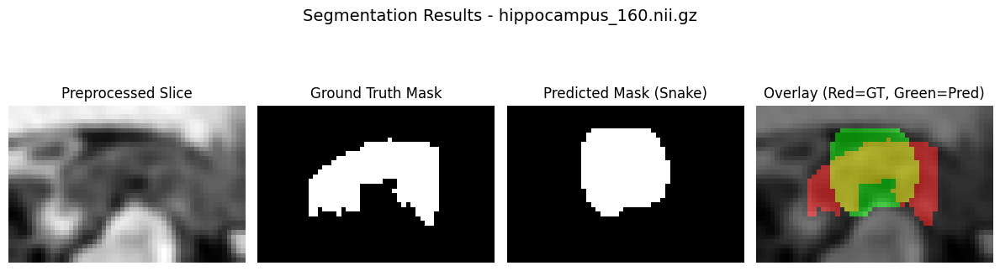

hippocampus_161.nii.gz
  Accuracy: 0.9613
  Dice Coefficient: 0.8470
  IoU: 0.7346



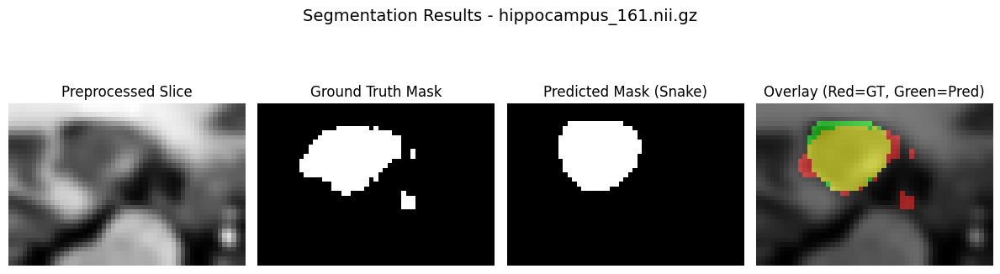

hippocampus_162.nii.gz
  Accuracy: 0.9556
  Dice Coefficient: 0.7817
  IoU: 0.6417



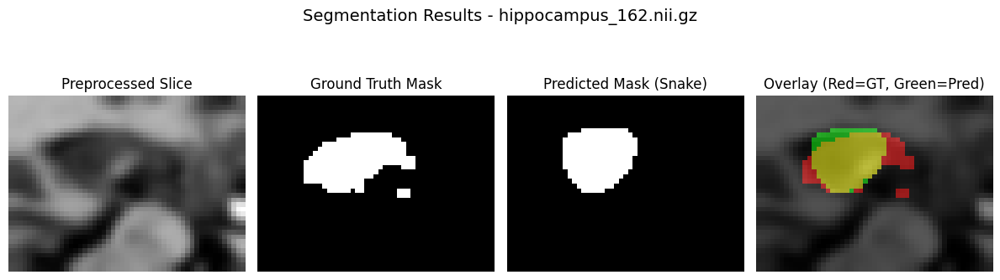

hippocampus_163.nii.gz
  Accuracy: 0.9817
  Dice Coefficient: 0.8692
  IoU: 0.7687



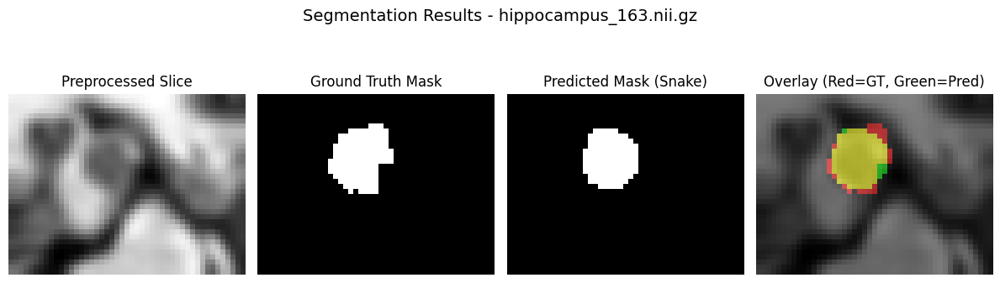

hippocampus_164.nii.gz
  Accuracy: 0.9736
  Dice Coefficient: 0.7903
  IoU: 0.6533



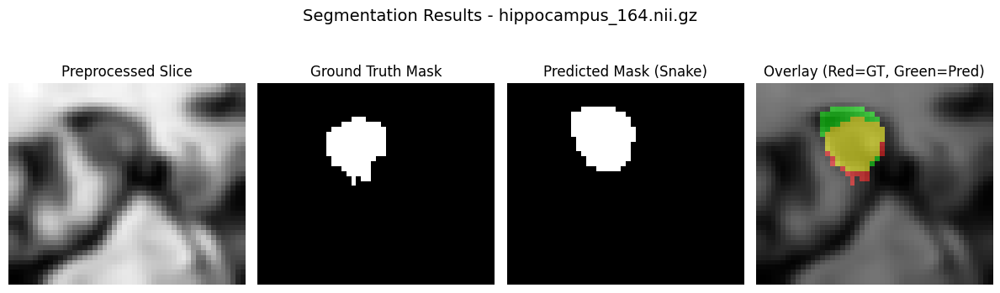

hippocampus_165.nii.gz
  Accuracy: 0.8691
  Dice Coefficient: 0.3473
  IoU: 0.2101



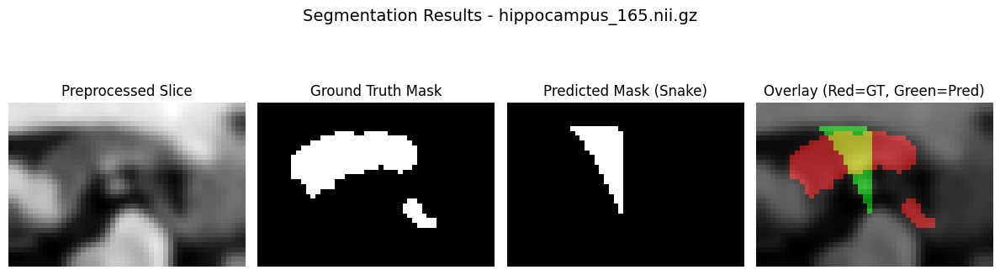

hippocampus_166.nii.gz
  Accuracy: 0.9099
  Dice Coefficient: 0.7083
  IoU: 0.5483



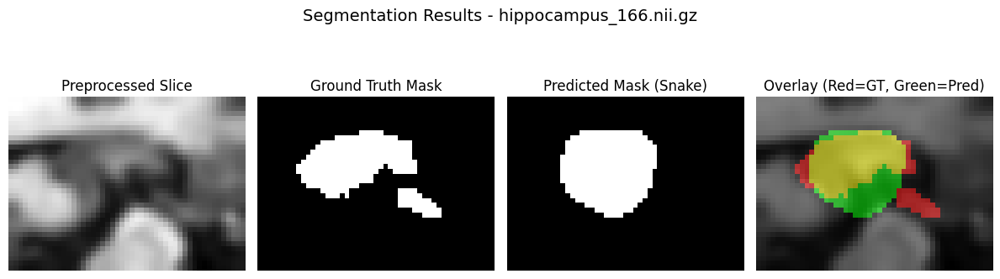

hippocampus_169.nii.gz
  Accuracy: 0.9667
  Dice Coefficient: 0.8235
  IoU: 0.7000



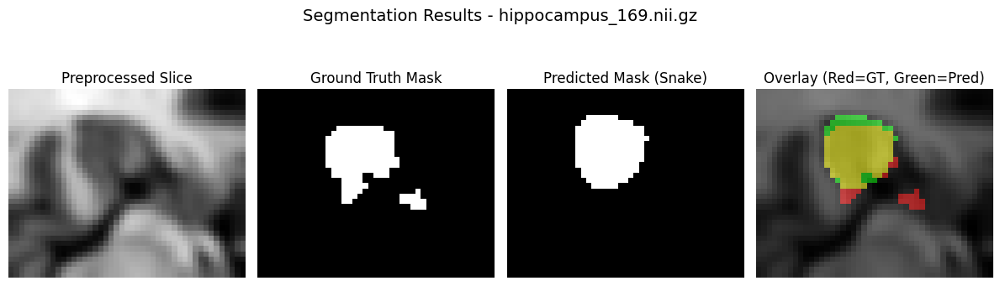

hippocampus_170.nii.gz
  Accuracy: 0.9730
  Dice Coefficient: 0.8394
  IoU: 0.7233



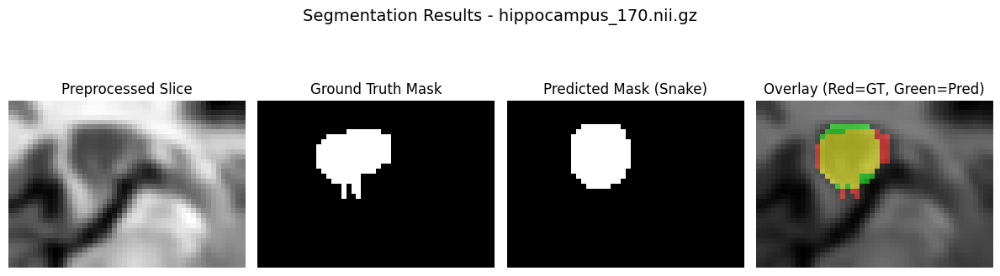

hippocampus_171.nii.gz
  Accuracy: 0.8184
  Dice Coefficient: 0.4145
  IoU: 0.2614



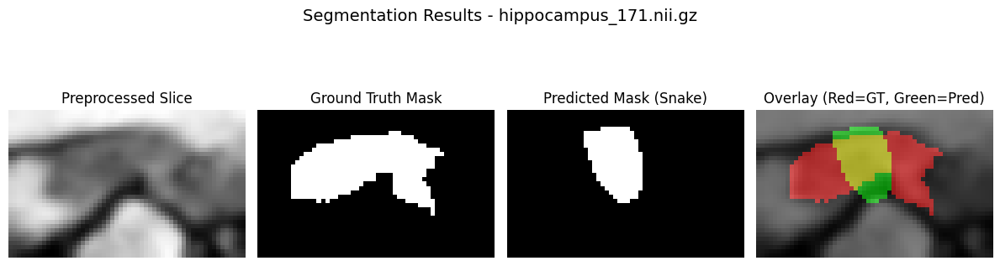

hippocampus_172.nii.gz
  Accuracy: 0.8472
  Dice Coefficient: 0.5789
  IoU: 0.4073



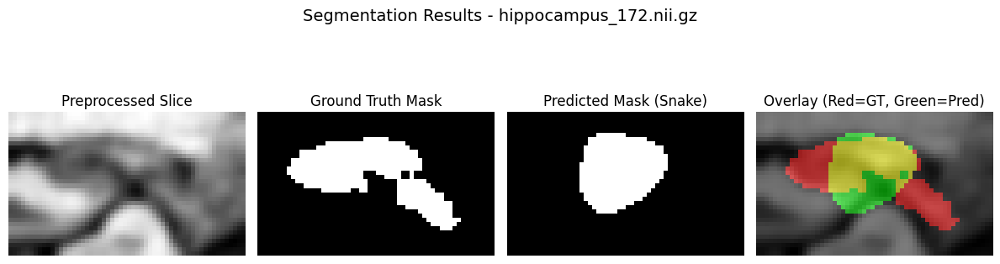

hippocampus_173.nii.gz
  Accuracy: 0.9358
  Dice Coefficient: 0.7430
  IoU: 0.5911



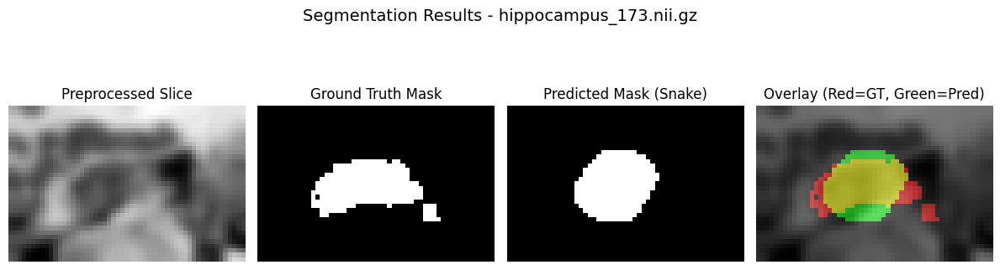

hippocampus_174.nii.gz
  Accuracy: 0.9376
  Dice Coefficient: 0.7465
  IoU: 0.5955



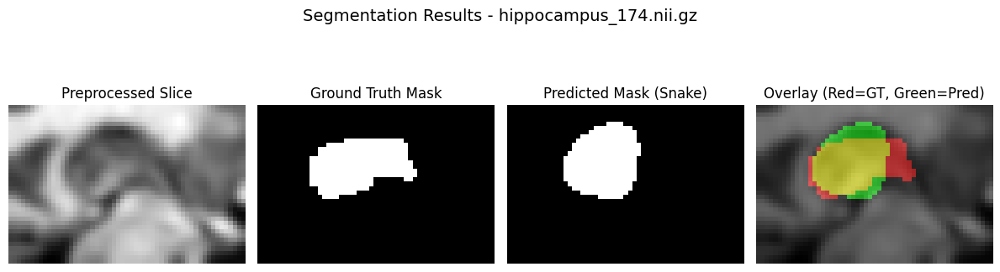

hippocampus_175.nii.gz
  Accuracy: 0.9684
  Dice Coefficient: 0.8444
  IoU: 0.7308



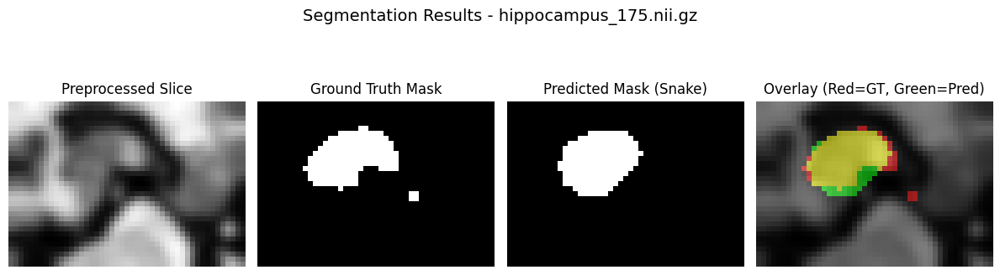

hippocampus_176.nii.gz
  Accuracy: 0.9691
  Dice Coefficient: 0.7611
  IoU: 0.6143



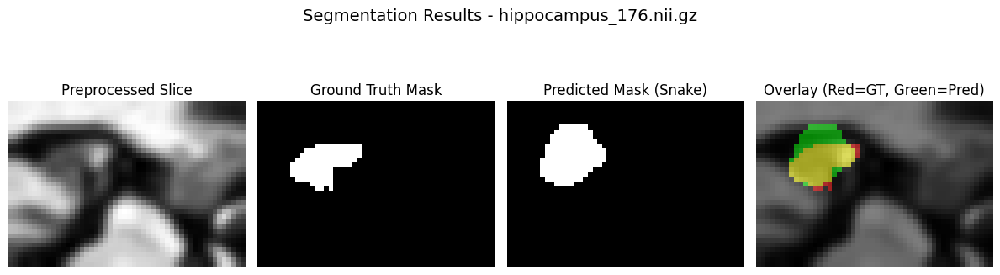

hippocampus_177.nii.gz
  Accuracy: 0.9807
  Dice Coefficient: 0.8772
  IoU: 0.7812



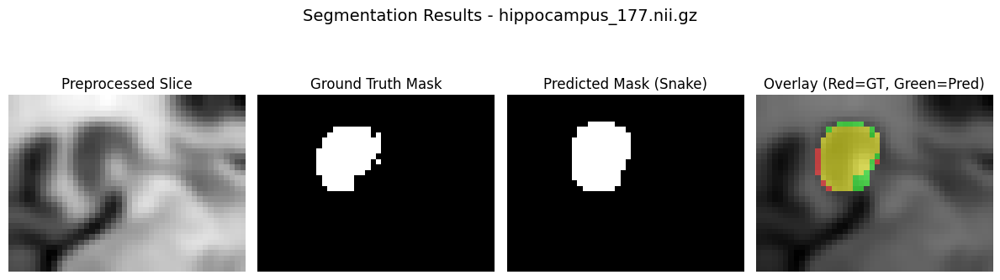

hippocampus_178.nii.gz
  Accuracy: 0.9786
  Dice Coefficient: 0.8254
  IoU: 0.7027



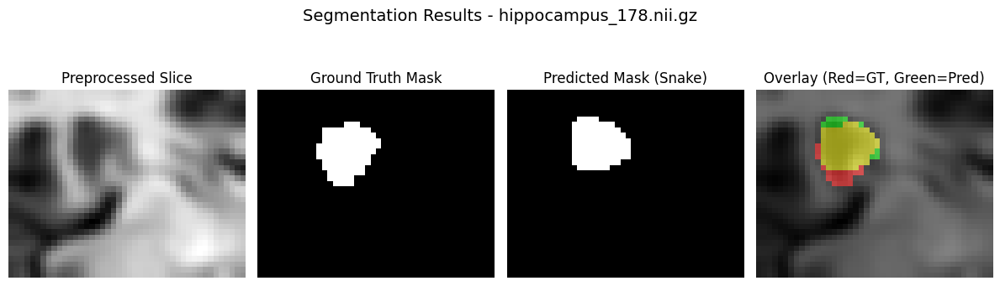

hippocampus_180.nii.gz
  Accuracy: 0.9700
  Dice Coefficient: 0.8148
  IoU: 0.6875



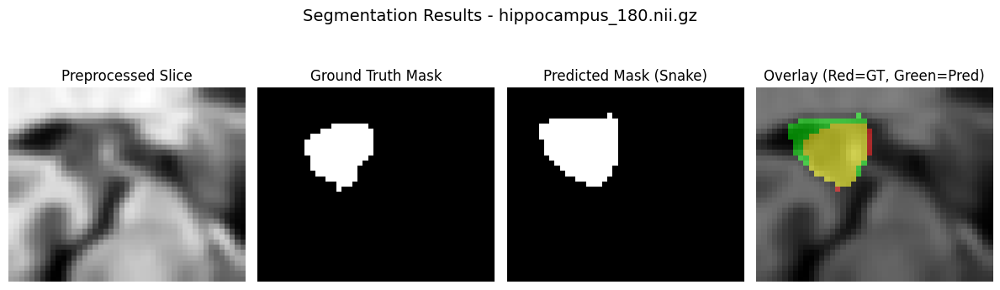

hippocampus_181.nii.gz
  Accuracy: 0.9443
  Dice Coefficient: 0.7668
  IoU: 0.6218



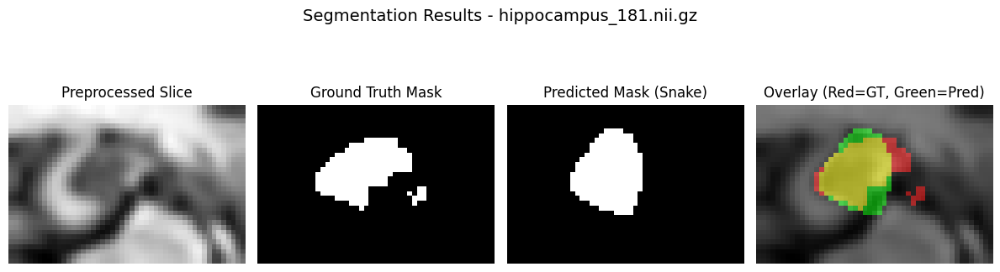

hippocampus_184.nii.gz
  Accuracy: 0.9597
  Dice Coefficient: 0.7865
  IoU: 0.6481



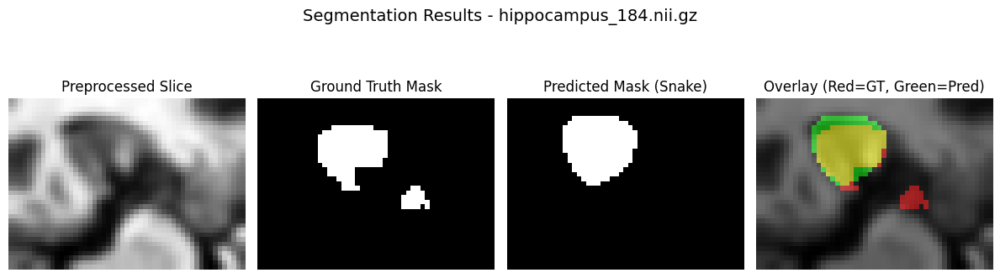

hippocampus_185.nii.gz
  Accuracy: 0.9190
  Dice Coefficient: 0.7732
  IoU: 0.6303



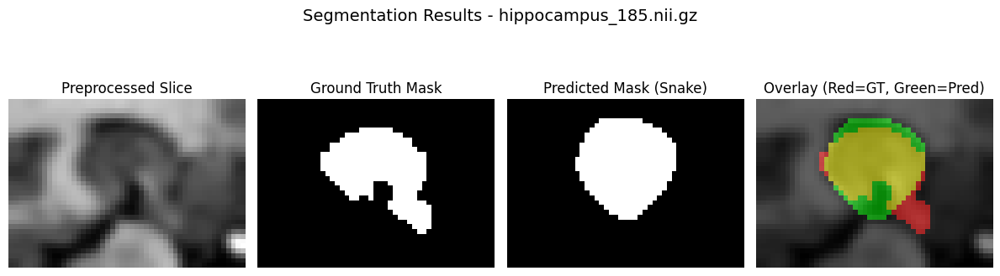

hippocampus_188.nii.gz
  Accuracy: 0.9494
  Dice Coefficient: 0.7828
  IoU: 0.6431



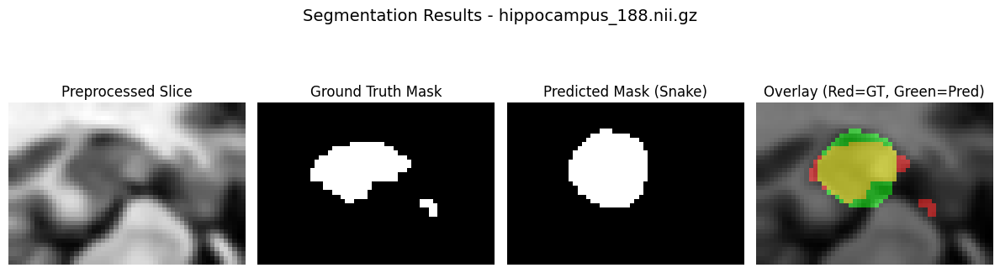

hippocampus_189.nii.gz
  Accuracy: 0.8501
  Dice Coefficient: 0.4208
  IoU: 0.2665



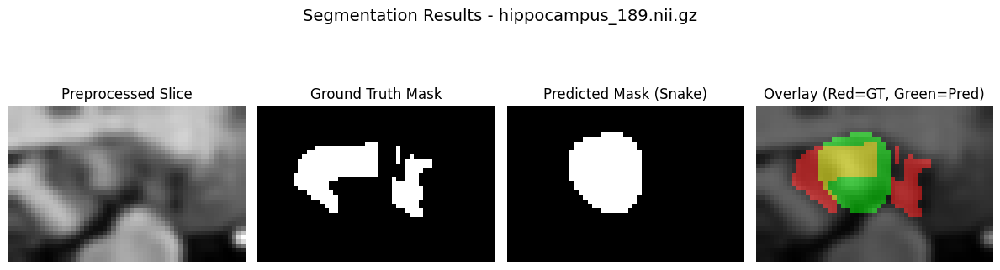

hippocampus_190.nii.gz
  Accuracy: 0.9506
  Dice Coefficient: 0.6520
  IoU: 0.4837



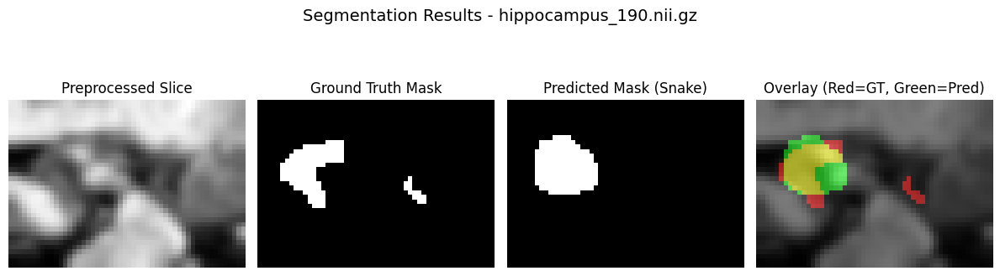

hippocampus_193.nii.gz
  Accuracy: 0.8776
  Dice Coefficient: 0.5647
  IoU: 0.3934



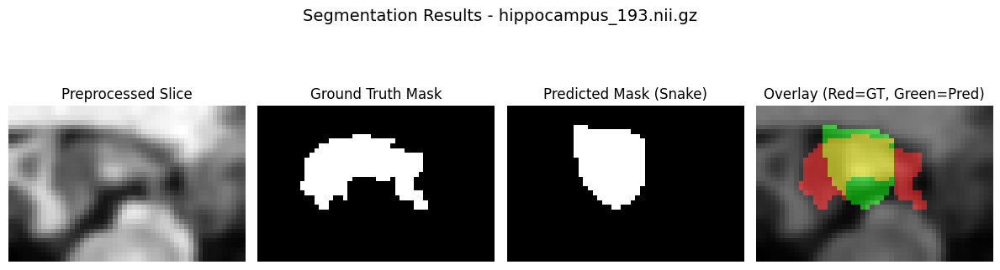

hippocampus_194.nii.gz
  Accuracy: 0.9709
  Dice Coefficient: 0.7901
  IoU: 0.6531



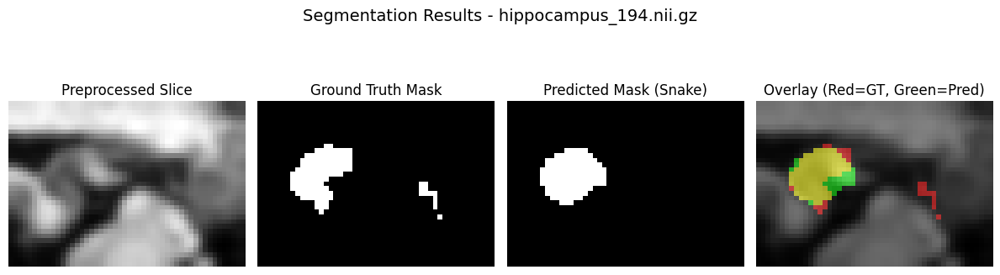

hippocampus_195.nii.gz
  Accuracy: 0.8788
  Dice Coefficient: 0.7072
  IoU: 0.5470



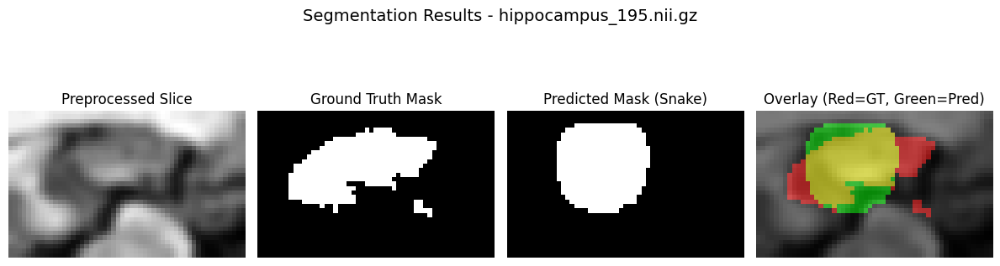

hippocampus_197.nii.gz
  Accuracy: 0.9572
  Dice Coefficient: 0.8431
  IoU: 0.7288



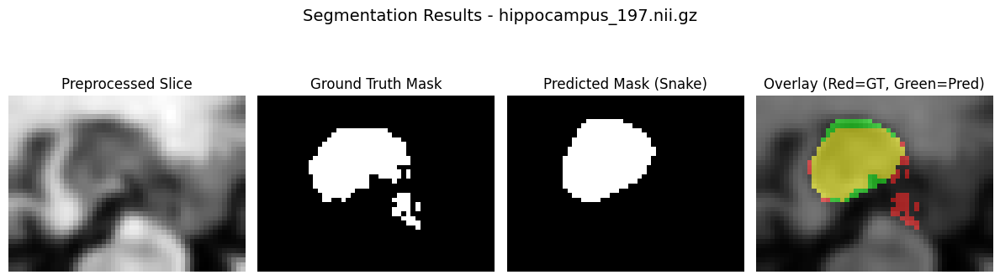

hippocampus_199.nii.gz
  Accuracy: 0.8571
  Dice Coefficient: 0.5985
  IoU: 0.4271



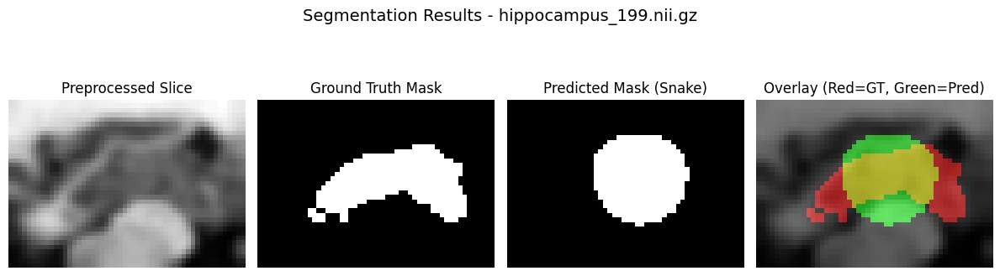

hippocampus_203.nii.gz
  Accuracy: 0.9772
  Dice Coefficient: 0.8021
  IoU: 0.6696



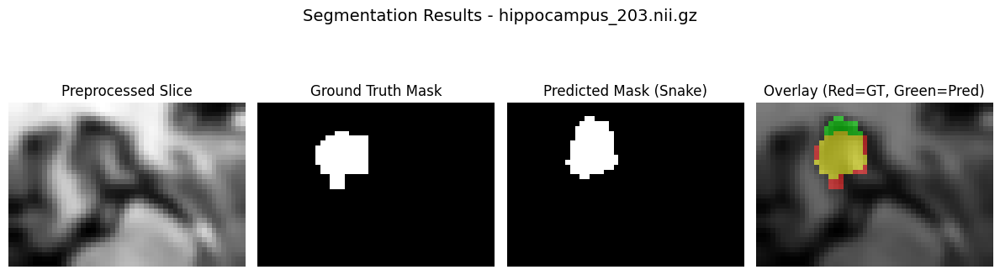

hippocampus_204.nii.gz
  Accuracy: 0.9786
  Dice Coefficient: 0.8398
  IoU: 0.7239



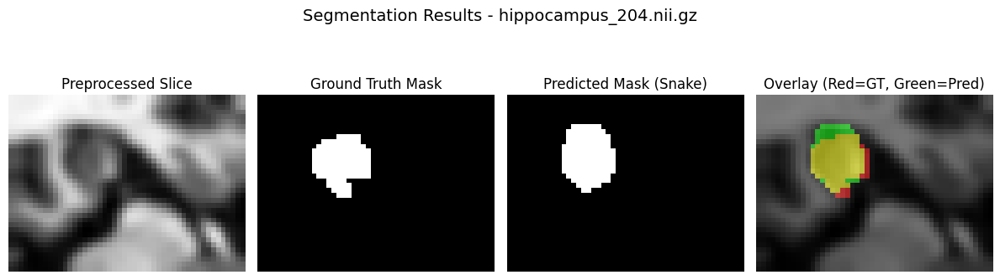

hippocampus_205.nii.gz
  Accuracy: 0.8876
  Dice Coefficient: 0.5848
  IoU: 0.4132



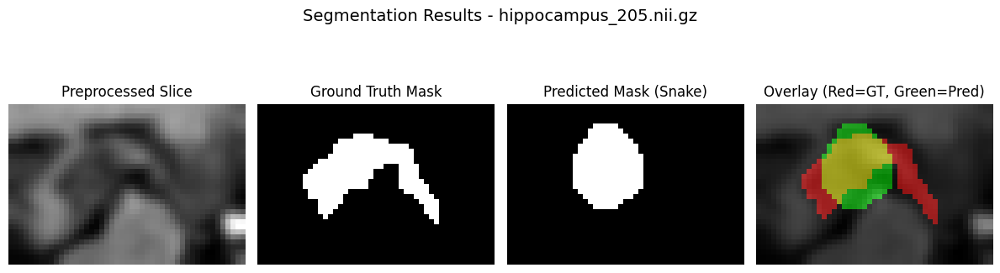

hippocampus_207.nii.gz
  Accuracy: 0.9019
  Dice Coefficient: 0.7407
  IoU: 0.5882



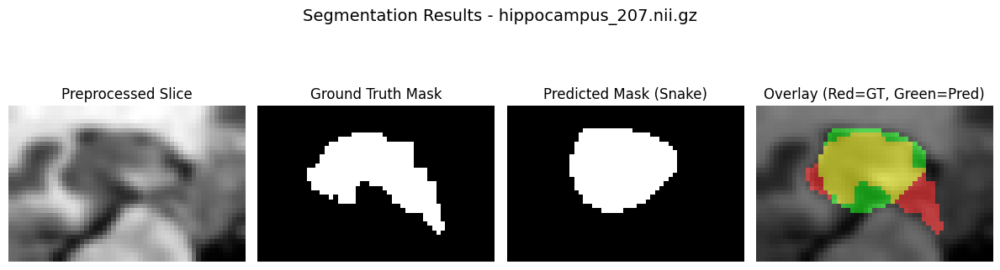

hippocampus_210.nii.gz
  Accuracy: 0.9718
  Dice Coefficient: 0.8145
  IoU: 0.6871



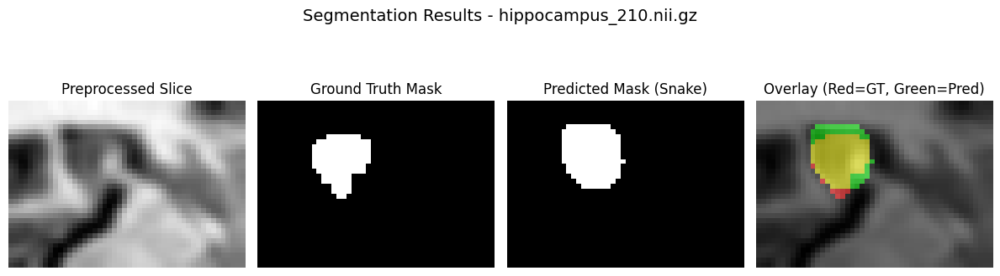

hippocampus_212.nii.gz
  Accuracy: 0.9347
  Dice Coefficient: 0.7205
  IoU: 0.5631



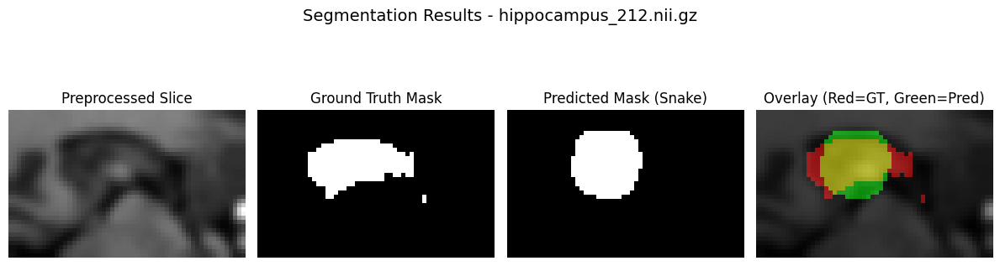

hippocampus_215.nii.gz
  Accuracy: 0.9493
  Dice Coefficient: 0.7642
  IoU: 0.6184



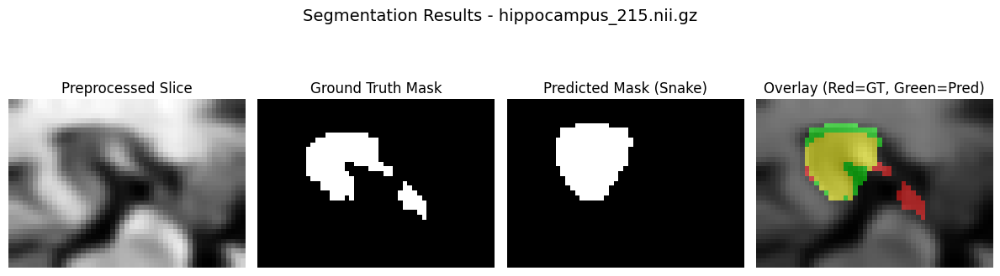

hippocampus_216.nii.gz
  Accuracy: 0.9515
  Dice Coefficient: 0.7853
  IoU: 0.6465



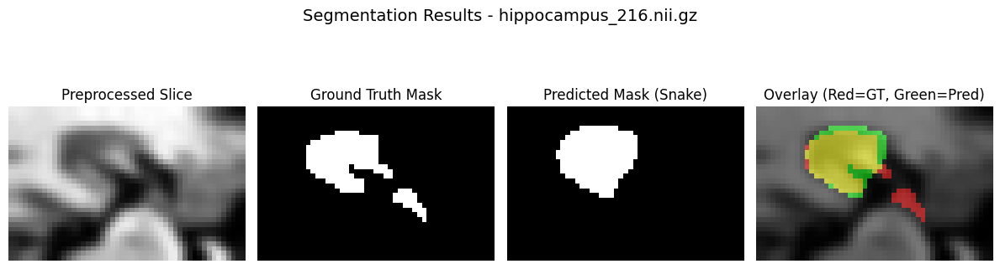

hippocampus_217.nii.gz
  Accuracy: 0.8530
  Dice Coefficient: 0.6263
  IoU: 0.4559



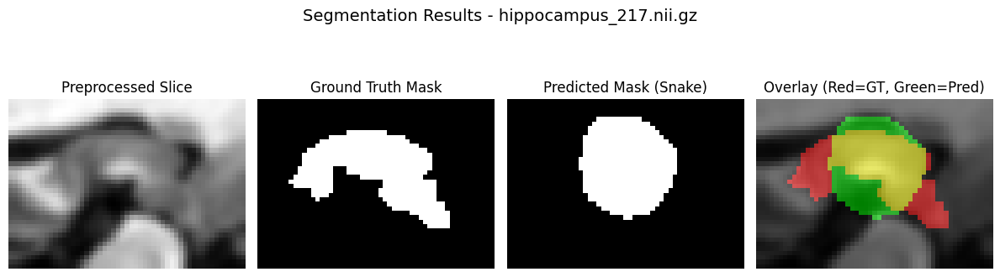

hippocampus_219.nii.gz
  Accuracy: 0.9760
  Dice Coefficient: 0.7260
  IoU: 0.5699



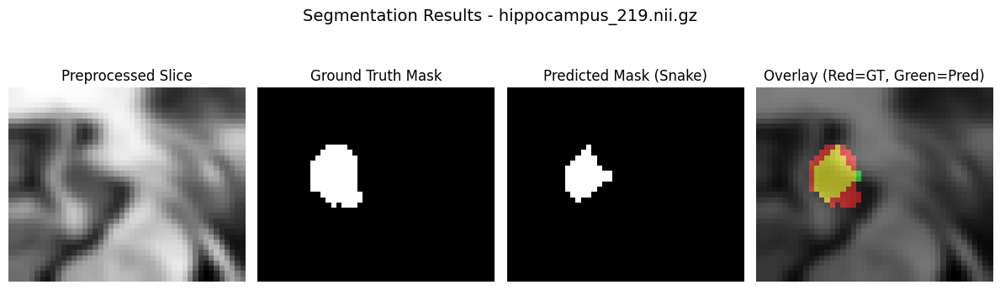

hippocampus_220.nii.gz
  Accuracy: 0.9812
  Dice Coefficient: 0.8755
  IoU: 0.7785



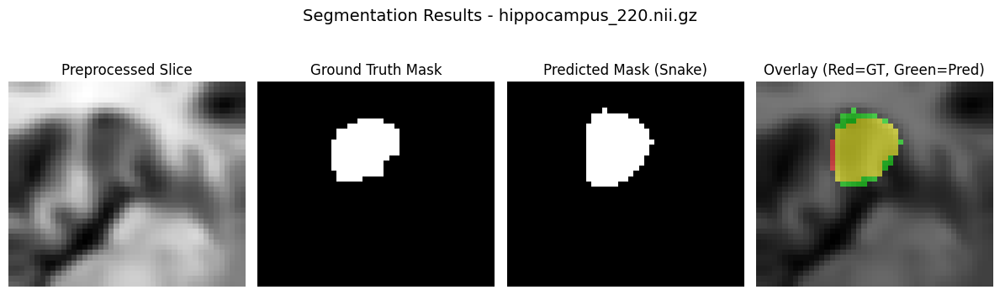

hippocampus_221.nii.gz
  Accuracy: 0.9368
  Dice Coefficient: 0.6712
  IoU: 0.5051



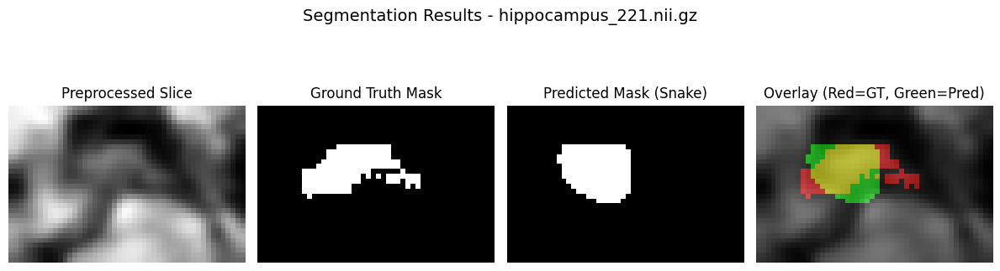

hippocampus_222.nii.gz
  Accuracy: 0.9790
  Dice Coefficient: 0.8087
  IoU: 0.6789



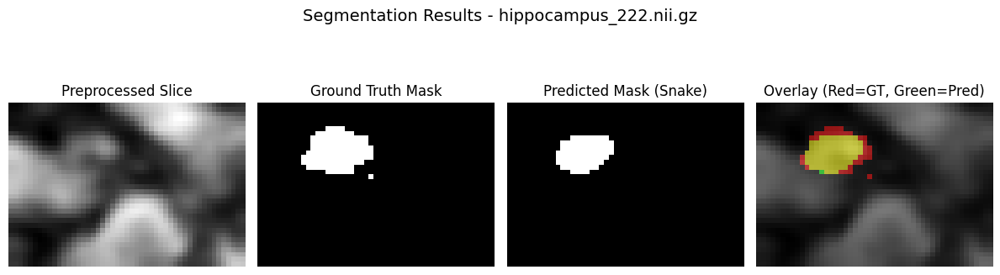

hippocampus_223.nii.gz
  Accuracy: 0.9236
  Dice Coefficient: 0.7290
  IoU: 0.5736



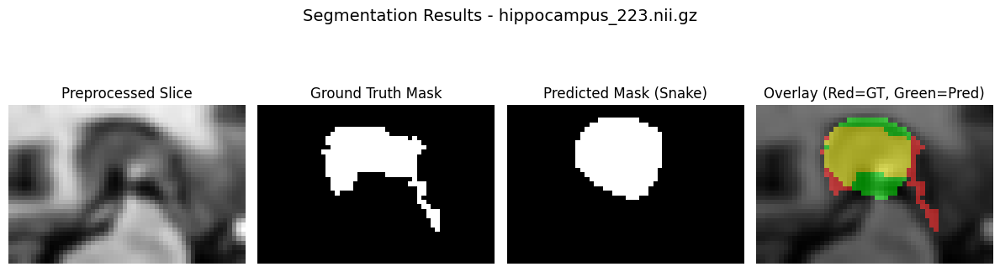

hippocampus_224.nii.gz
  Accuracy: 0.9566
  Dice Coefficient: 0.8145
  IoU: 0.6870



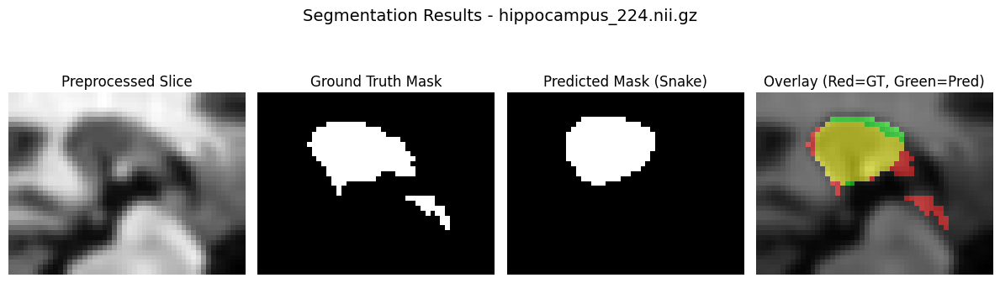

hippocampus_225.nii.gz
  Accuracy: 0.8485
  Dice Coefficient: 0.3457
  IoU: 0.2090



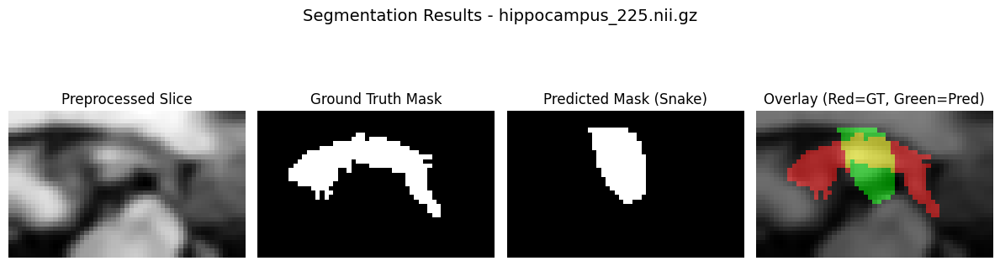

hippocampus_226.nii.gz
  Accuracy: 0.9050
  Dice Coefficient: 0.5171
  IoU: 0.3487



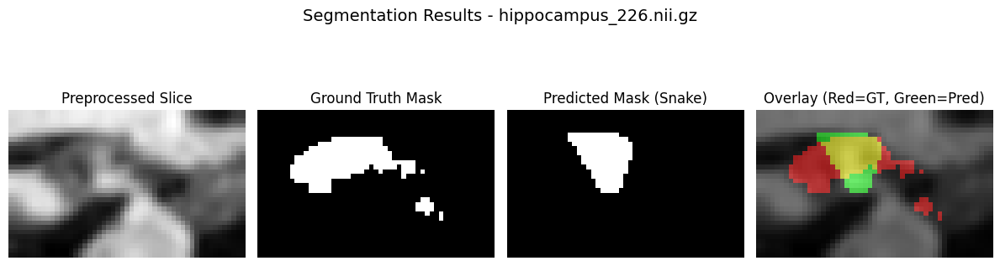

hippocampus_227.nii.gz
  Accuracy: 0.9574
  Dice Coefficient: 0.8209
  IoU: 0.6962



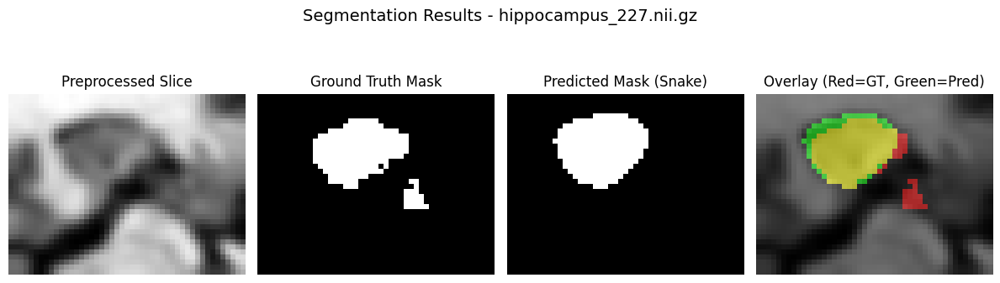

hippocampus_228.nii.gz
  Accuracy: 0.9493
  Dice Coefficient: 0.7541
  IoU: 0.6053



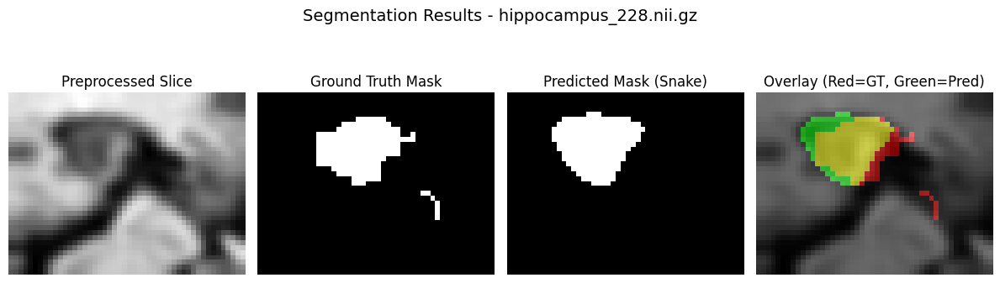

hippocampus_229.nii.gz
  Accuracy: 0.9521
  Dice Coefficient: 0.7969
  IoU: 0.6624



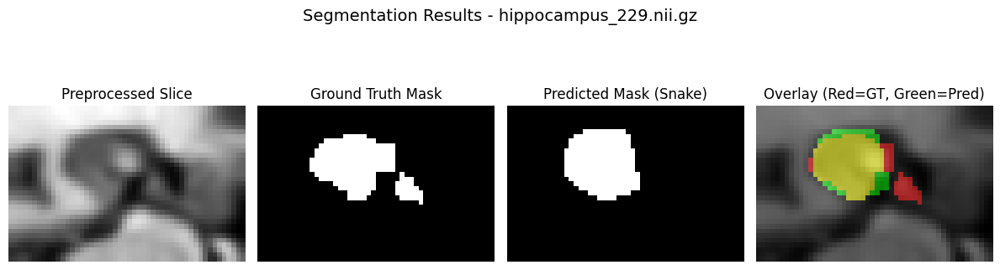

hippocampus_230.nii.gz
  Accuracy: 0.9724
  Dice Coefficient: 0.8589
  IoU: 0.7527



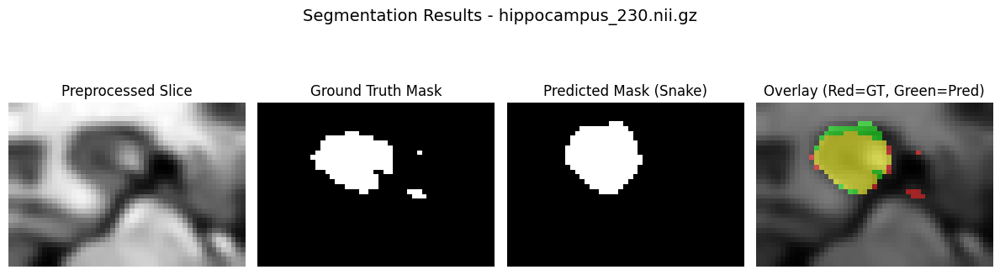

hippocampus_231.nii.gz
  Accuracy: 0.9678
  Dice Coefficient: 0.7984
  IoU: 0.6644



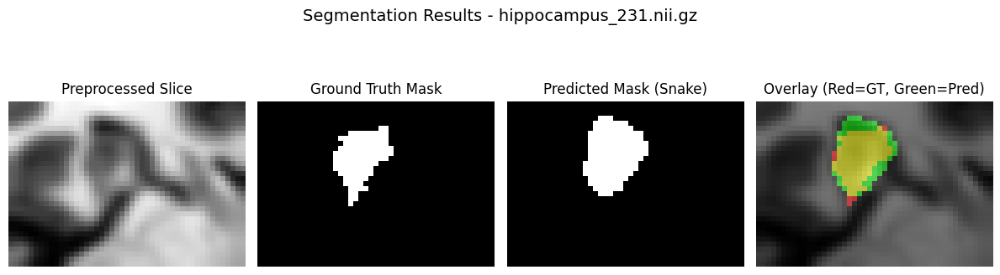

hippocampus_232.nii.gz
  Accuracy: 0.9842
  Dice Coefficient: 0.8555
  IoU: 0.7475



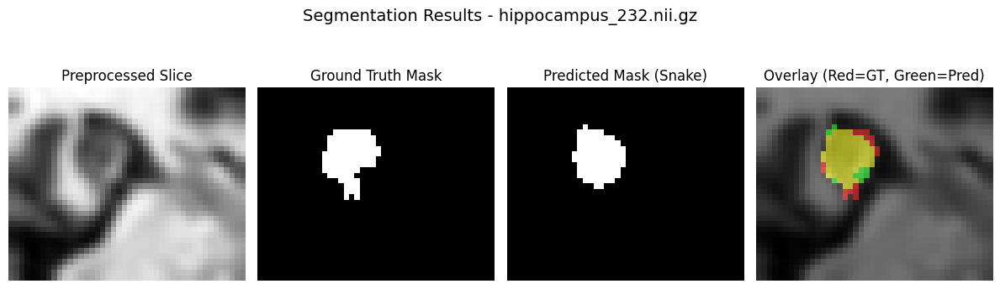

hippocampus_233.nii.gz
  Accuracy: 0.9447
  Dice Coefficient: 0.7320
  IoU: 0.5773



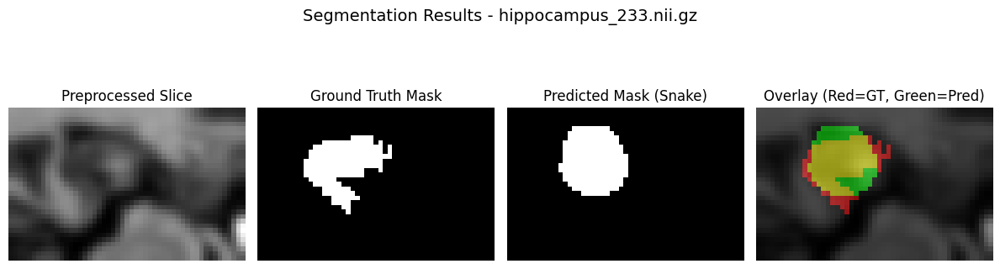

hippocampus_234.nii.gz
  Accuracy: 0.9629
  Dice Coefficient: 0.7677
  IoU: 0.6230



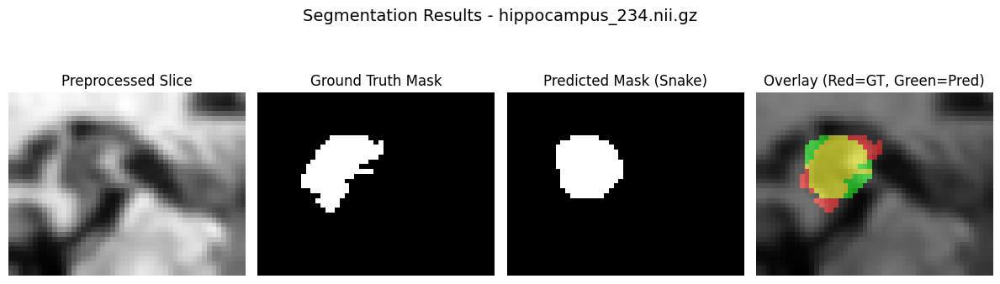

hippocampus_235.nii.gz
  Accuracy: 0.9711
  Dice Coefficient: 0.7634
  IoU: 0.6173



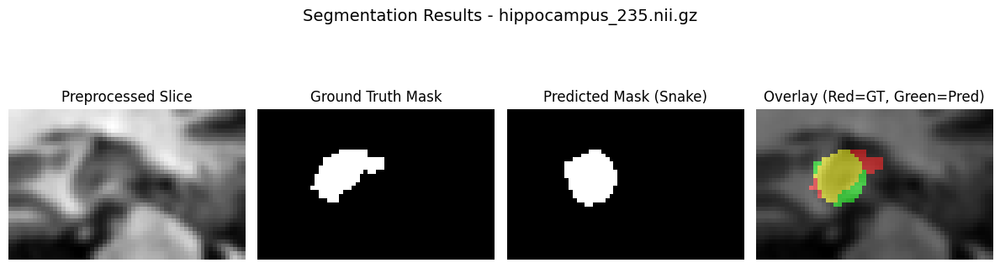

hippocampus_236.nii.gz
  Accuracy: 0.9621
  Dice Coefficient: 0.7500
  IoU: 0.6000



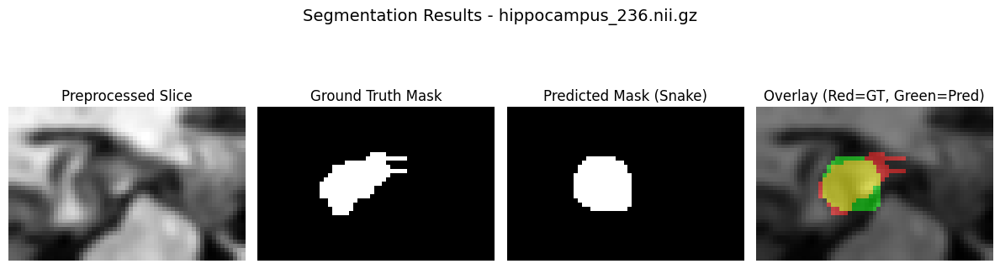

hippocampus_238.nii.gz
  Accuracy: 0.9488
  Dice Coefficient: 0.8015
  IoU: 0.6687



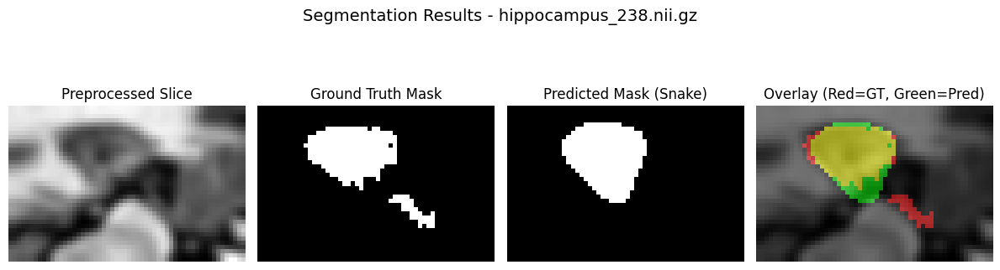

hippocampus_242.nii.gz
  Accuracy: 0.9216
  Dice Coefficient: 0.7891
  IoU: 0.6517



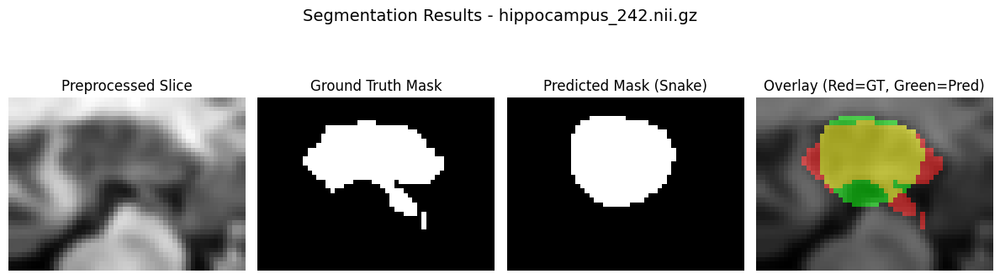

hippocampus_243.nii.gz
  Accuracy: 0.7897
  Dice Coefficient: 0.2863
  IoU: 0.1670



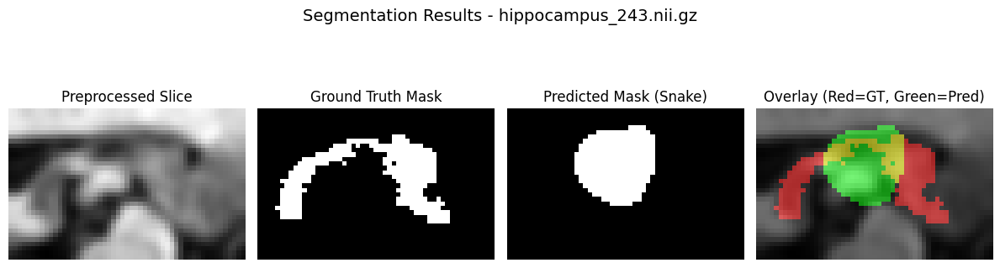

hippocampus_244.nii.gz
  Accuracy: 0.9295
  Dice Coefficient: 0.0779
  IoU: 0.0405



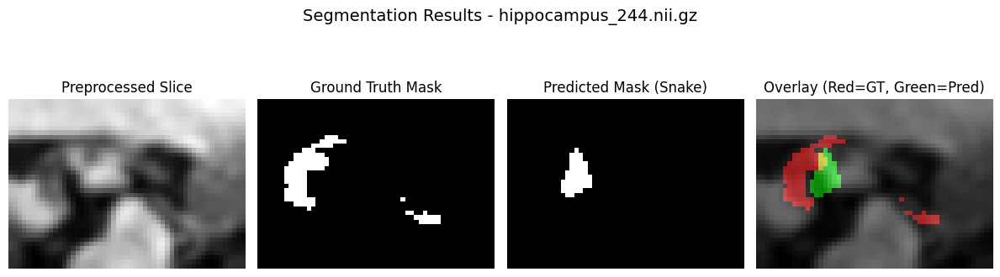

hippocampus_245.nii.gz
  Accuracy: 0.9762
  Dice Coefficient: 0.8319
  IoU: 0.7122



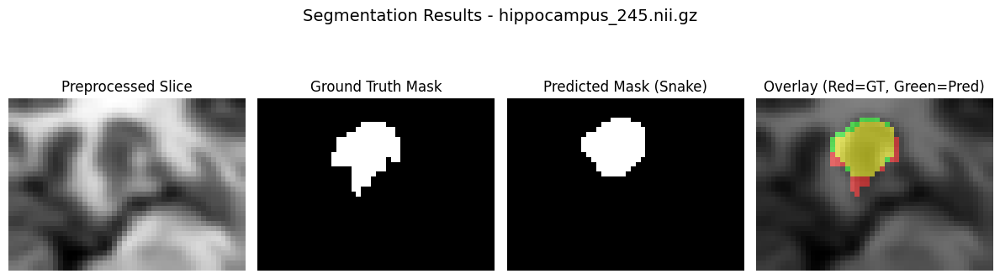

hippocampus_248.nii.gz
  Accuracy: 0.9750
  Dice Coefficient: 0.8148
  IoU: 0.6875



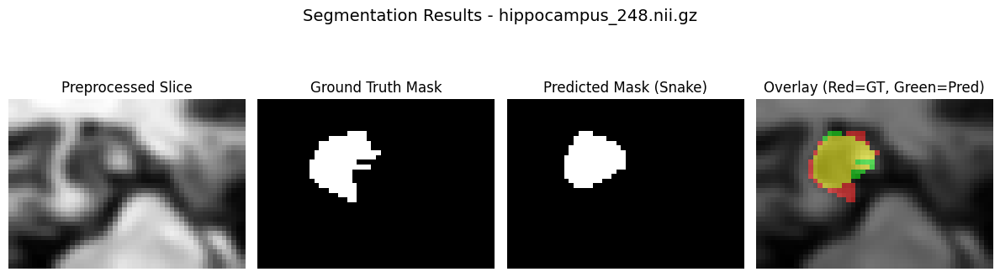

hippocampus_249.nii.gz
  Accuracy: 0.9573
  Dice Coefficient: 0.8203
  IoU: 0.6953



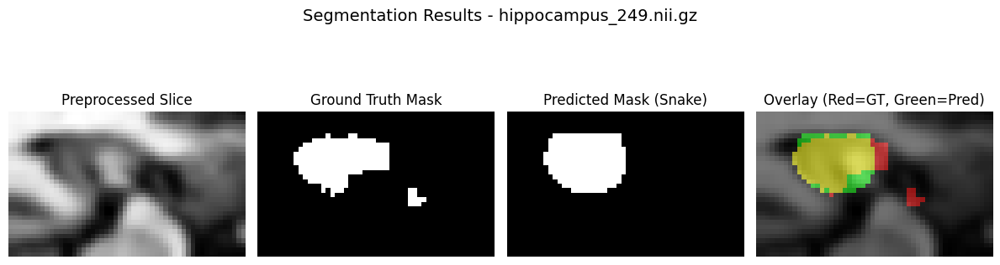

hippocampus_250.nii.gz
  Accuracy: 0.9563
  Dice Coefficient: 0.6977
  IoU: 0.5357



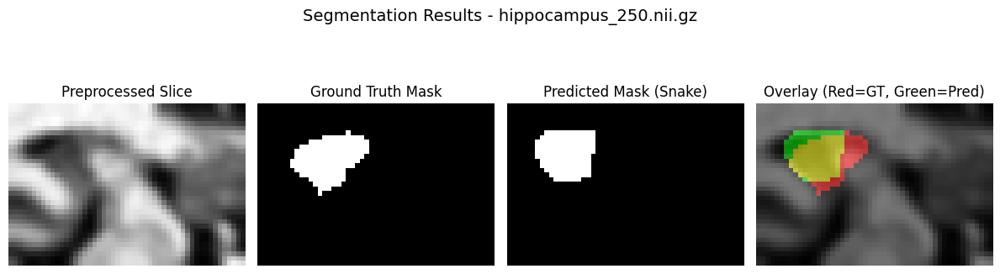

hippocampus_251.nii.gz
  Accuracy: 0.8070
  Dice Coefficient: 0.4634
  IoU: 0.3016



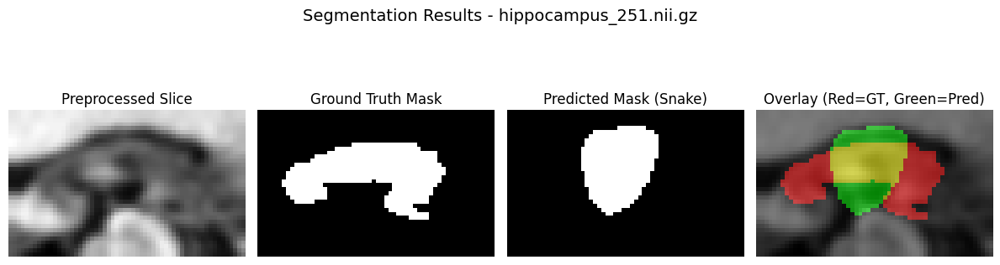

hippocampus_252.nii.gz
  Accuracy: 0.8211
  Dice Coefficient: 0.5550
  IoU: 0.3841



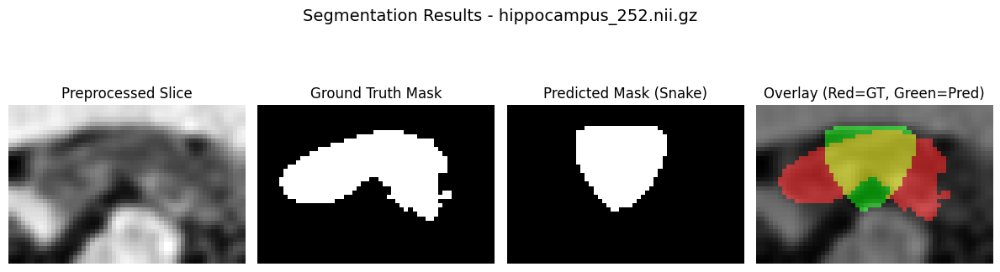

hippocampus_253.nii.gz
  Accuracy: 0.9043
  Dice Coefficient: 0.8000
  IoU: 0.6667



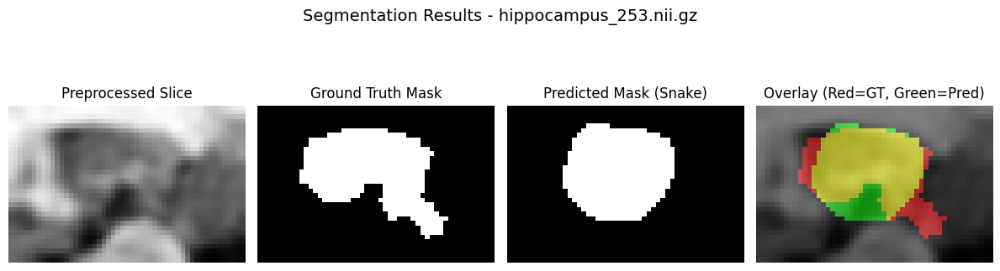

hippocampus_257.nii.gz
  Accuracy: 0.9325
  Dice Coefficient: 0.7568
  IoU: 0.6087



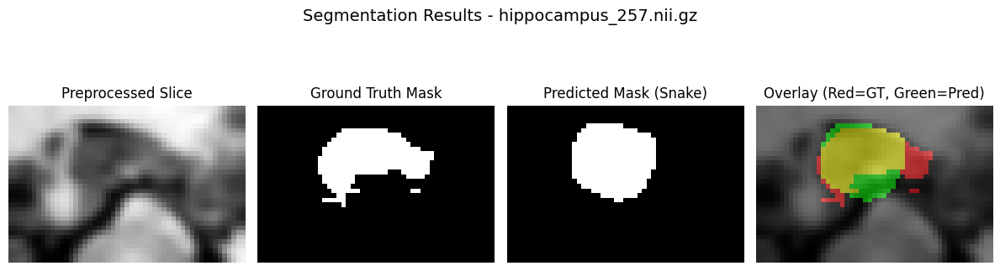

hippocampus_259.nii.gz
  Accuracy: 0.8010
  Dice Coefficient: 0.3876
  IoU: 0.2404



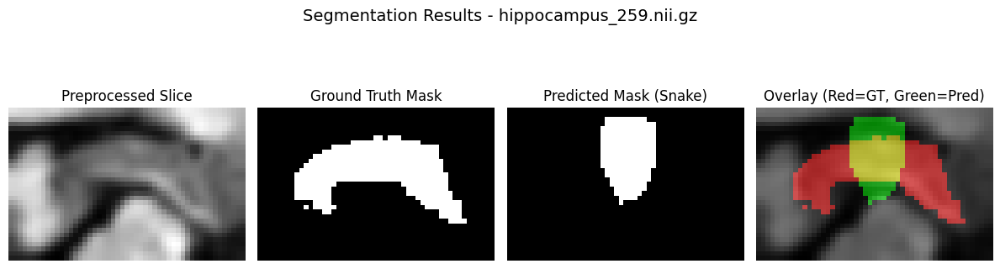

hippocampus_260.nii.gz
  Accuracy: 0.8501
  Dice Coefficient: 0.4135
  IoU: 0.2606



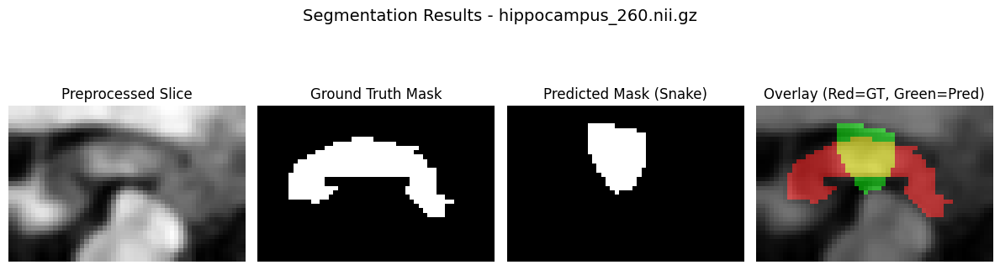

hippocampus_261.nii.gz
  Accuracy: 0.9406
  Dice Coefficient: 0.7143
  IoU: 0.5556



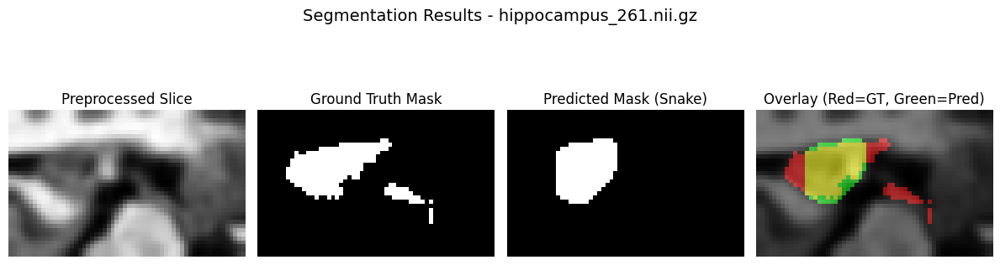

hippocampus_263.nii.gz
  Accuracy: 0.9673
  Dice Coefficient: 0.8605
  IoU: 0.7551



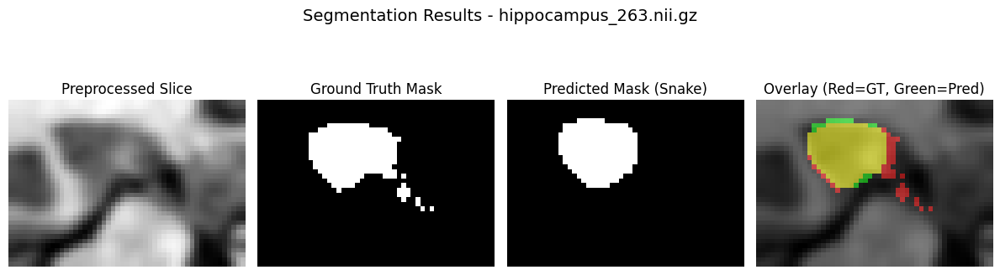

hippocampus_264.nii.gz
  Accuracy: 0.9536
  Dice Coefficient: 0.8035
  IoU: 0.6715



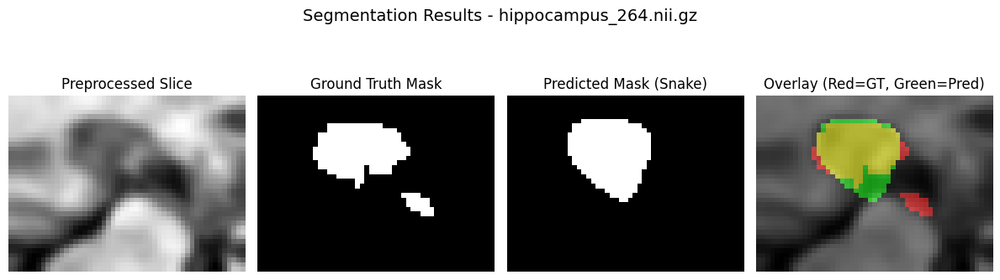

hippocampus_265.nii.gz
  Accuracy: 0.9552
  Dice Coefficient: 0.7619
  IoU: 0.6154



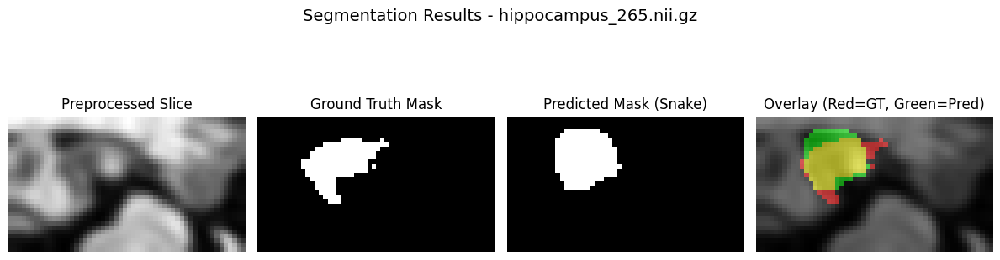

hippocampus_268.nii.gz
  Accuracy: 0.9752
  Dice Coefficient: 0.8459
  IoU: 0.7329



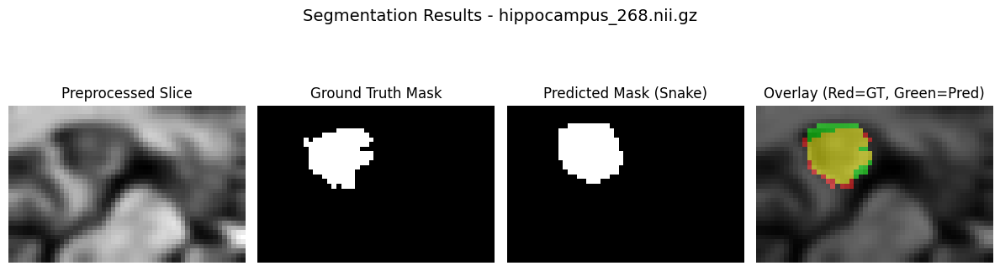

hippocampus_269.nii.gz
  Accuracy: 0.9703
  Dice Coefficient: 0.8633
  IoU: 0.7594



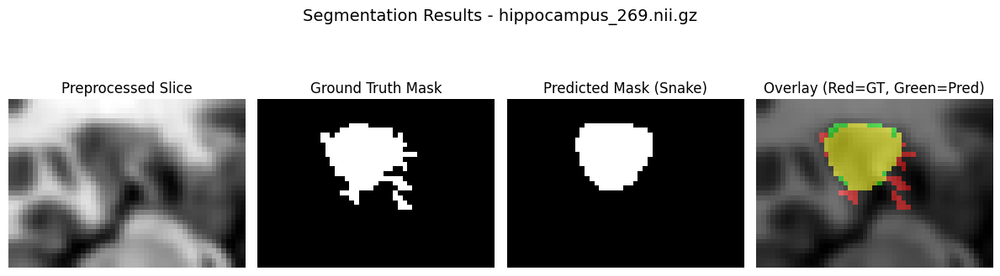

hippocampus_274.nii.gz
  Accuracy: 0.9714
  Dice Coefficient: 0.8291
  IoU: 0.7080



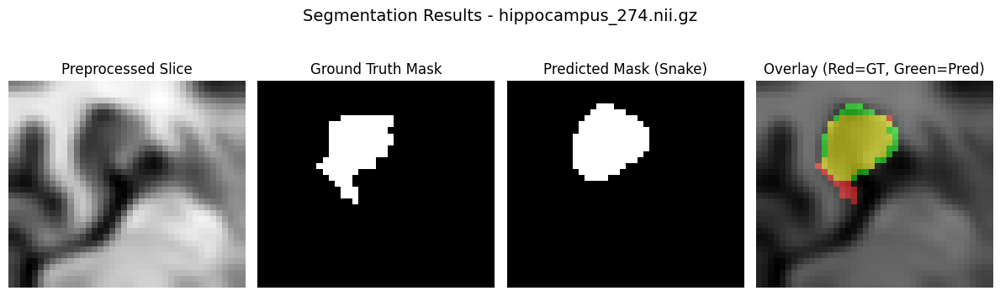

hippocampus_276.nii.gz
  Accuracy: 0.9463
  Dice Coefficient: 0.7854
  IoU: 0.6466



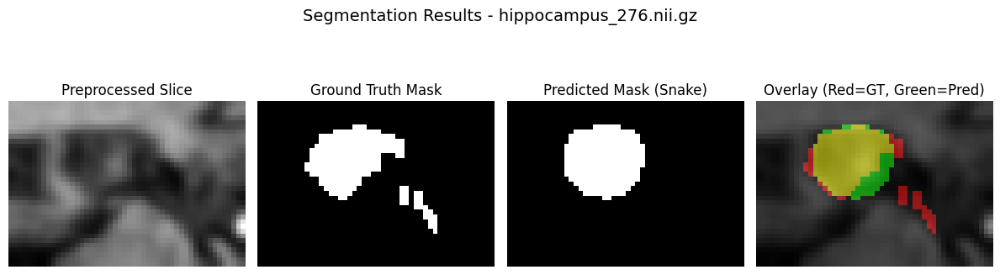

hippocampus_277.nii.gz
  Accuracy: 0.8213
  Dice Coefficient: 0.5014
  IoU: 0.3346



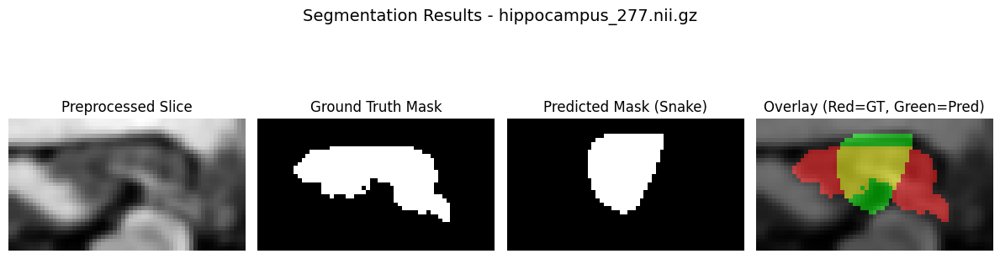

hippocampus_279.nii.gz
  Accuracy: 0.9659
  Dice Coefficient: 0.7852
  IoU: 0.6463



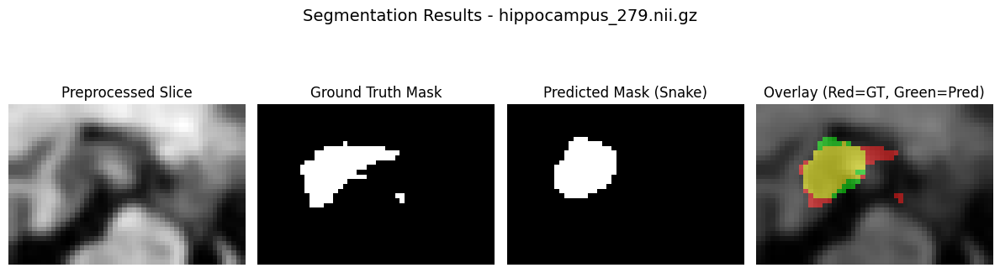

hippocampus_280.nii.gz
  Accuracy: 0.9684
  Dice Coefficient: 0.7179
  IoU: 0.5600



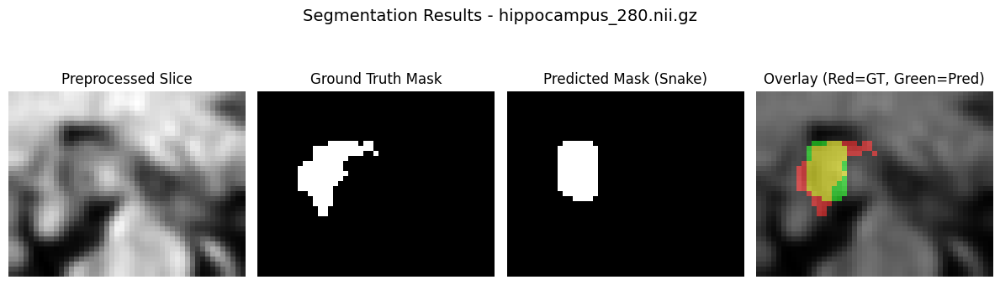

hippocampus_282.nii.gz
  Accuracy: 0.9262
  Dice Coefficient: 0.6619
  IoU: 0.4947



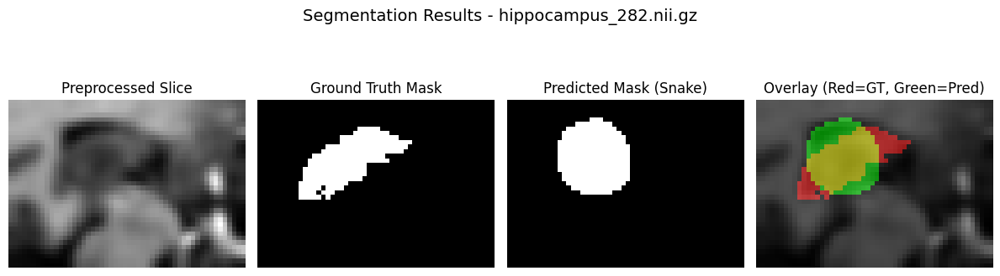

hippocampus_286.nii.gz
  Accuracy: 0.9760
  Dice Coefficient: 0.8374
  IoU: 0.7203



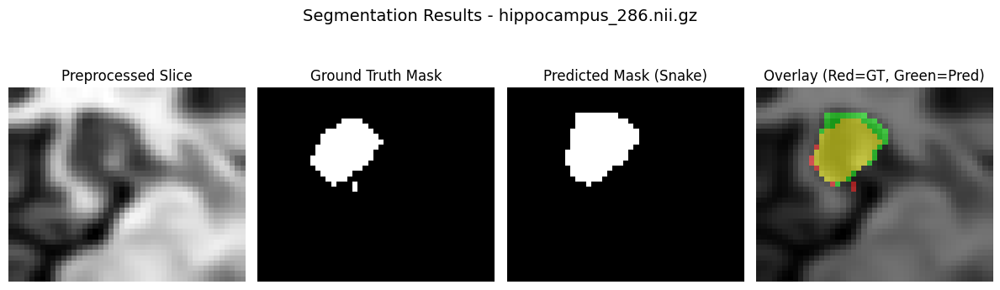

hippocampus_287.nii.gz
  Accuracy: 0.9768
  Dice Coefficient: 0.8581
  IoU: 0.7514



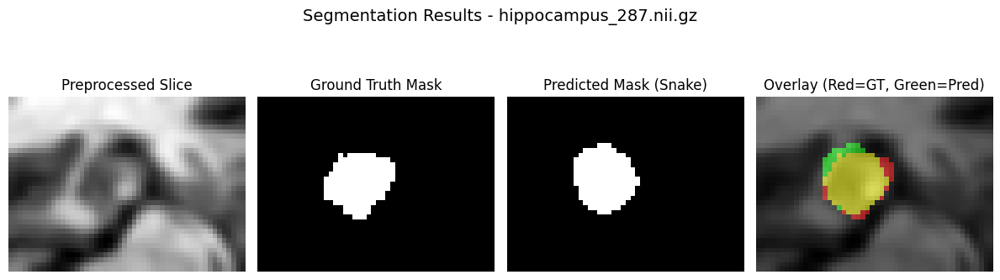

hippocampus_288.nii.gz
  Accuracy: 0.9821
  Dice Coefficient: 0.8896
  IoU: 0.8012



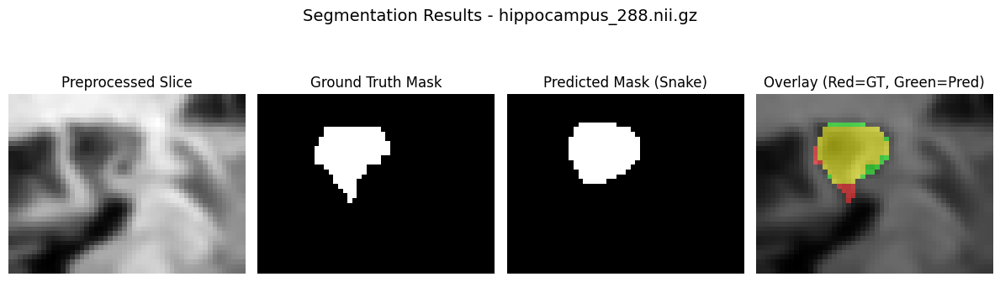

hippocampus_289.nii.gz
  Accuracy: 0.9627
  Dice Coefficient: 0.7091
  IoU: 0.5493



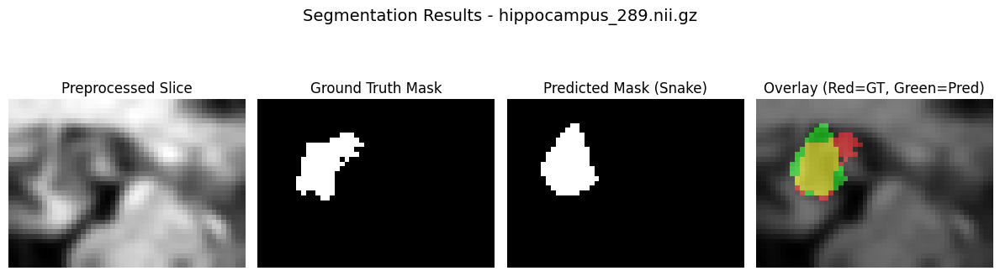

hippocampus_290.nii.gz
  Accuracy: 0.9621
  Dice Coefficient: 0.7186
  IoU: 0.5608



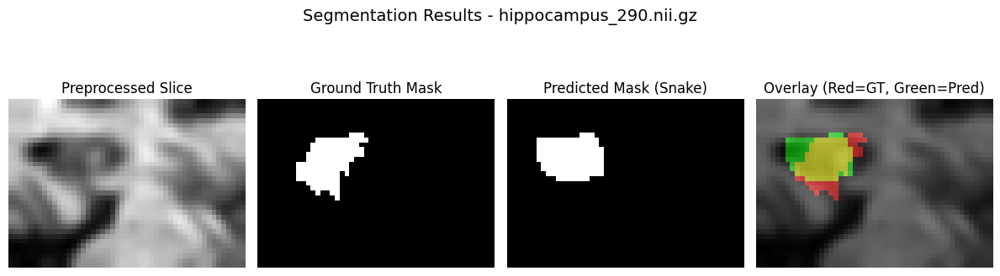

hippocampus_292.nii.gz
  Accuracy: 0.9393
  Dice Coefficient: 0.7674
  IoU: 0.6226



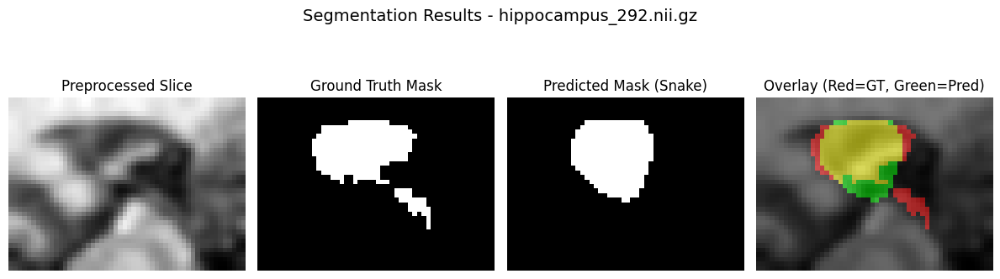

hippocampus_294.nii.gz
  Accuracy: 0.9786
  Dice Coefficient: 0.8619
  IoU: 0.7574



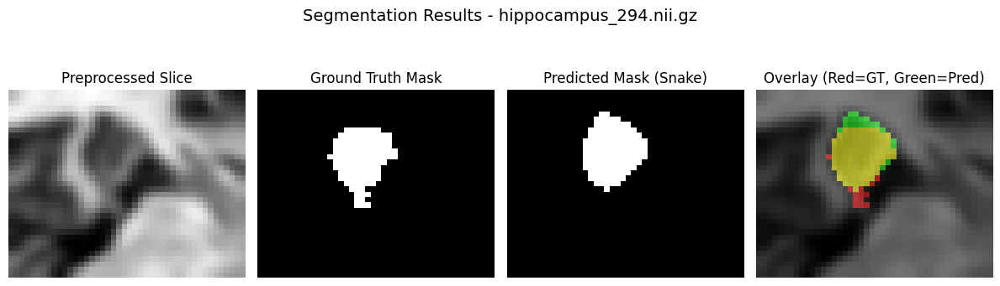

hippocampus_295.nii.gz
  Accuracy: 0.9553
  Dice Coefficient: 0.7580
  IoU: 0.6103



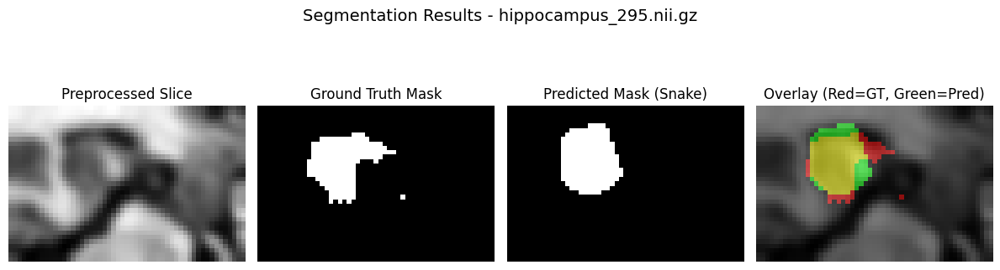

hippocampus_296.nii.gz
  Accuracy: 0.9302
  Dice Coefficient: 0.6812
  IoU: 0.5165



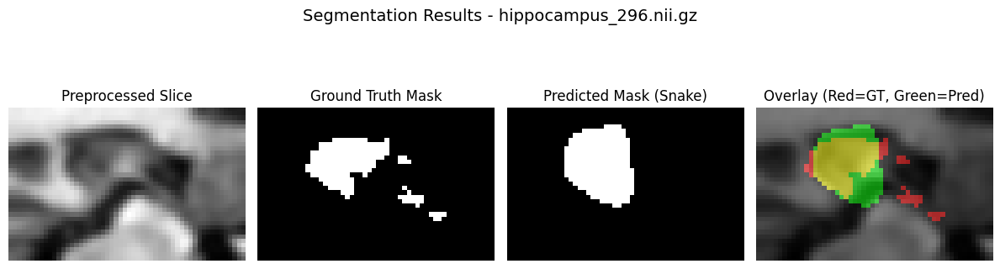

hippocampus_297.nii.gz
  Accuracy: 0.9400
  Dice Coefficient: 0.7011
  IoU: 0.5398



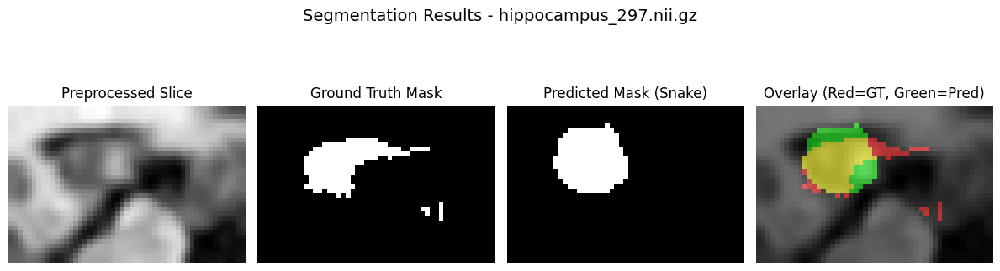

hippocampus_298.nii.gz
  Accuracy: 0.9541
  Dice Coefficient: 0.7335
  IoU: 0.5792



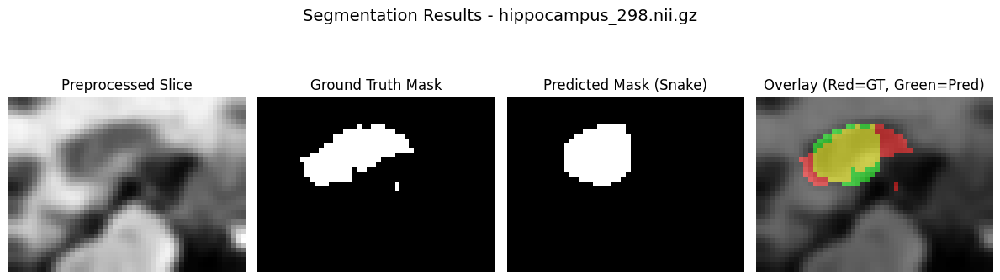

hippocampus_299.nii.gz
  Accuracy: 0.9462
  Dice Coefficient: 0.7466
  IoU: 0.5957



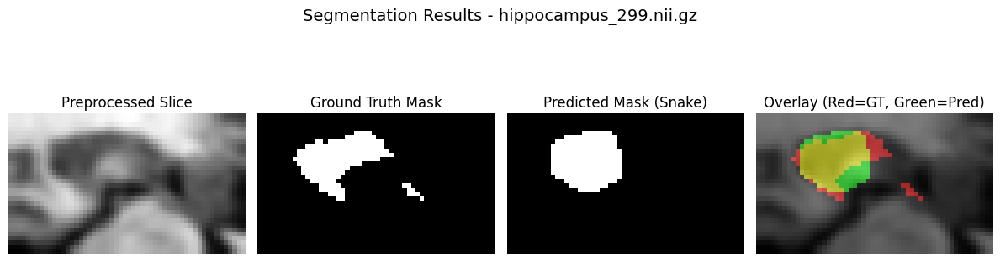

hippocampus_300.nii.gz
  Accuracy: 0.9417
  Dice Coefficient: 0.7953
  IoU: 0.6602



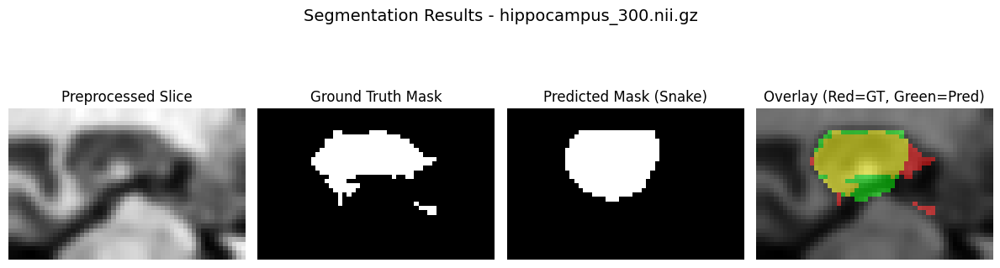

hippocampus_301.nii.gz
  Accuracy: 0.9271
  Dice Coefficient: 0.7483
  IoU: 0.5979



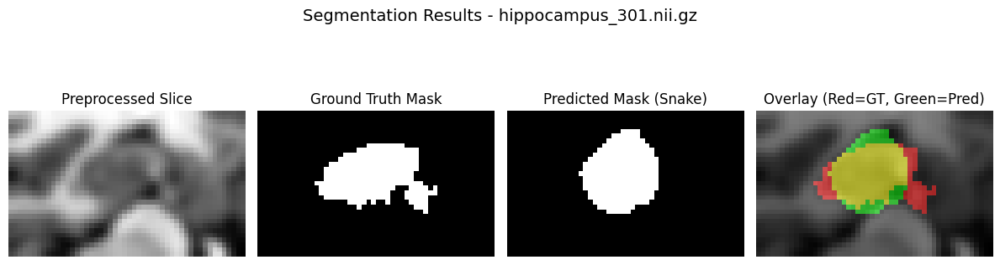

hippocampus_302.nii.gz
  Accuracy: 0.9348
  Dice Coefficient: 0.7541
  IoU: 0.6053



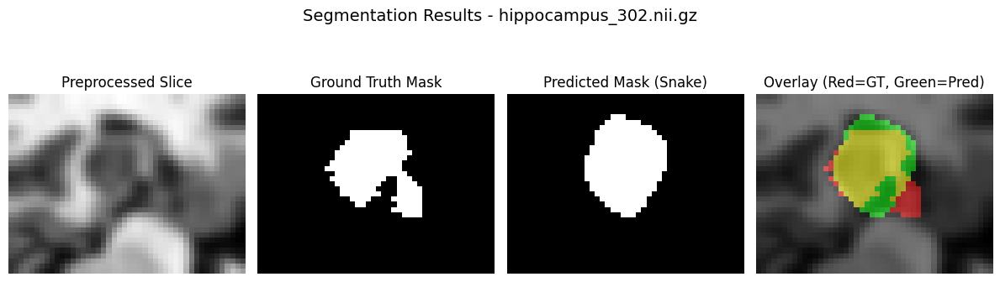

hippocampus_303.nii.gz
  Accuracy: 0.9702
  Dice Coefficient: 0.8447
  IoU: 0.7312



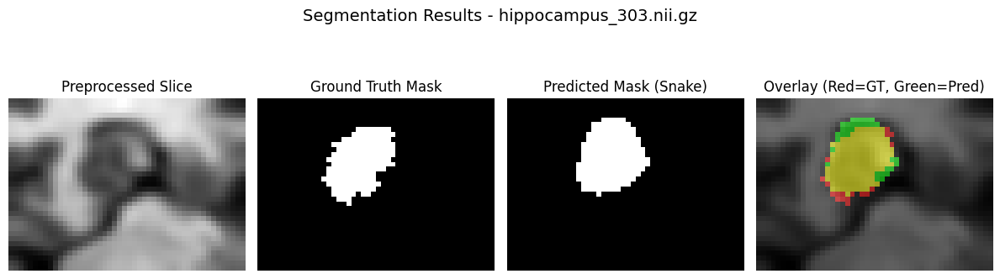

hippocampus_304.nii.gz
  Accuracy: 0.9751
  Dice Coefficient: 0.8562
  IoU: 0.7485



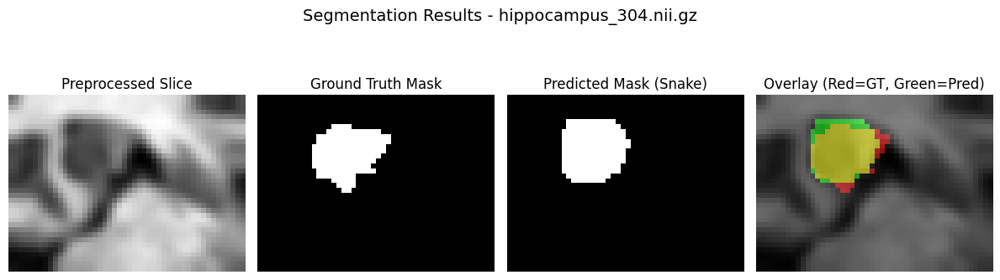

hippocampus_305.nii.gz
  Accuracy: 0.9106
  Dice Coefficient: 0.6410
  IoU: 0.4716



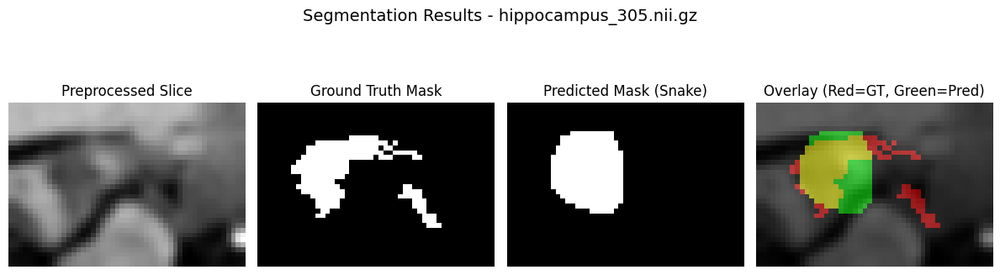

hippocampus_308.nii.gz
  Accuracy: 0.9792
  Dice Coefficient: 0.8973
  IoU: 0.8137



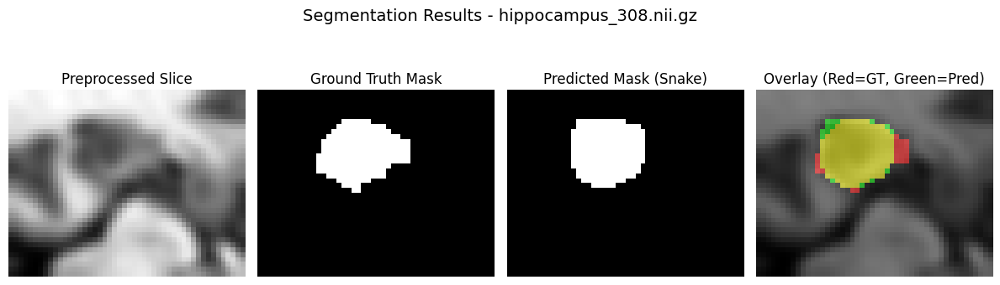

hippocampus_309.nii.gz
  Accuracy: 0.9531
  Dice Coefficient: 0.7594
  IoU: 0.6121



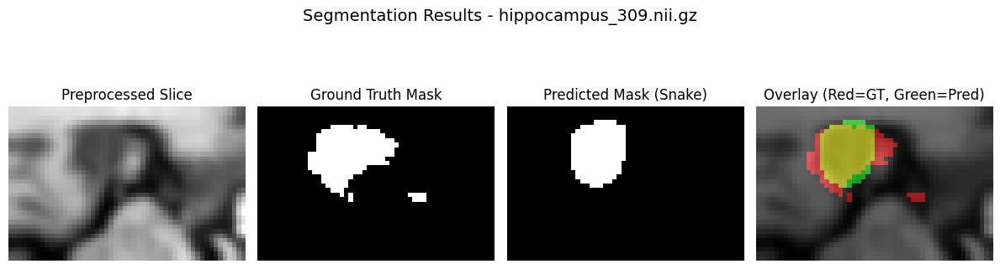

hippocampus_310.nii.gz
  Accuracy: 0.9654
  Dice Coefficient: 0.6631
  IoU: 0.4960



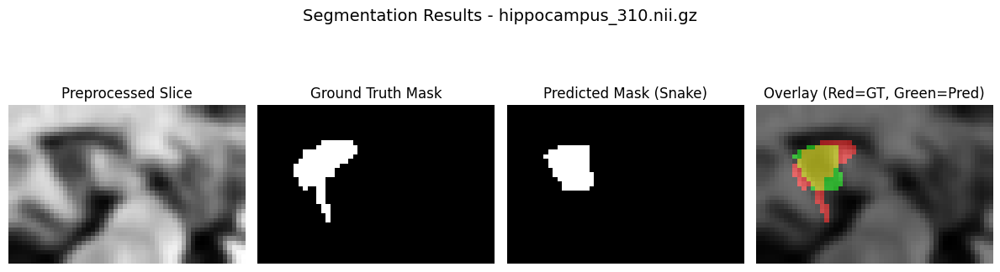

hippocampus_311.nii.gz
  Accuracy: 0.9779
  Dice Coefficient: 0.8658
  IoU: 0.7633



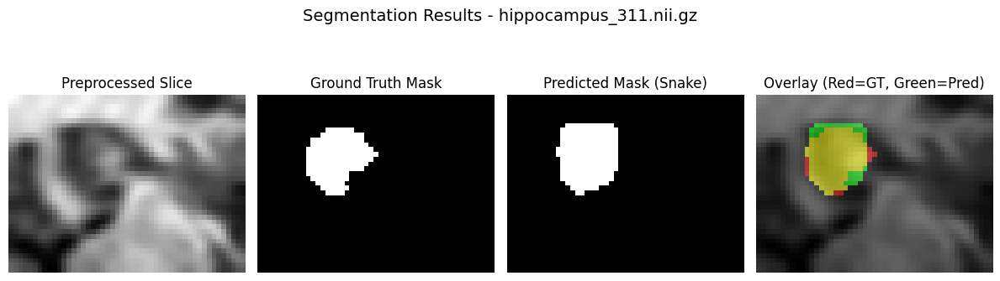

hippocampus_314.nii.gz
  Accuracy: 0.9255
  Dice Coefficient: 0.6439
  IoU: 0.4748



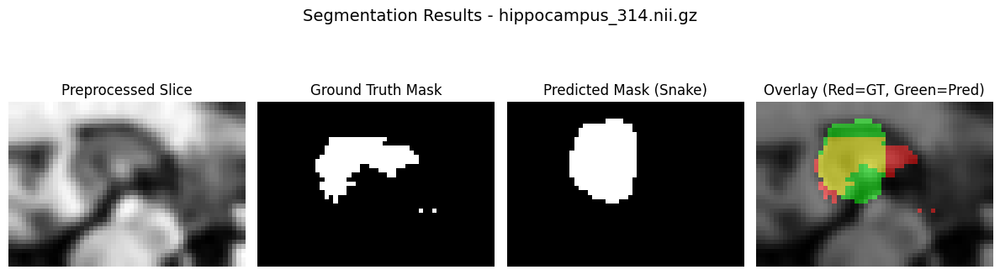

hippocampus_316.nii.gz
  Accuracy: 0.9274
  Dice Coefficient: 0.5226
  IoU: 0.3538



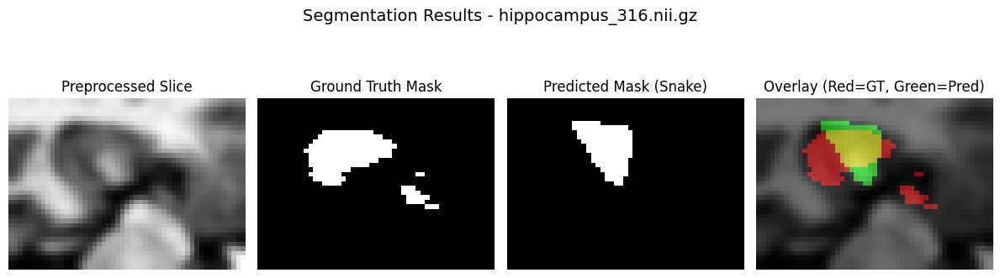

hippocampus_317.nii.gz
  Accuracy: 0.9275
  Dice Coefficient: 0.7570
  IoU: 0.6090



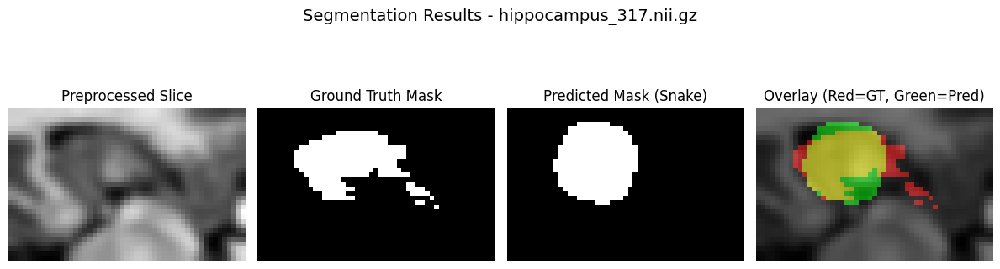

hippocampus_318.nii.gz
  Accuracy: 0.9375
  Dice Coefficient: 0.7739
  IoU: 0.6312



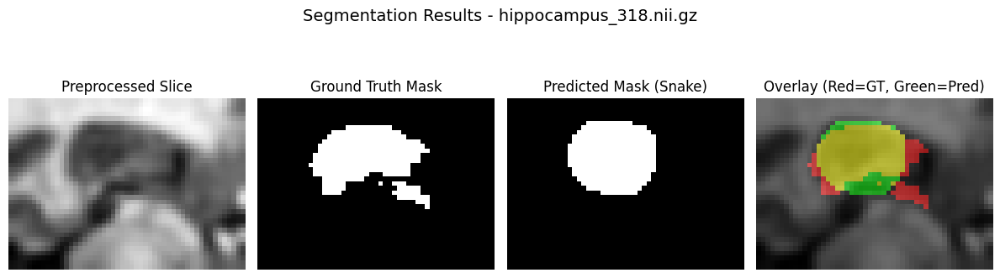

hippocampus_319.nii.gz
  Accuracy: 0.9811
  Dice Coefficient: 0.8544
  IoU: 0.7458



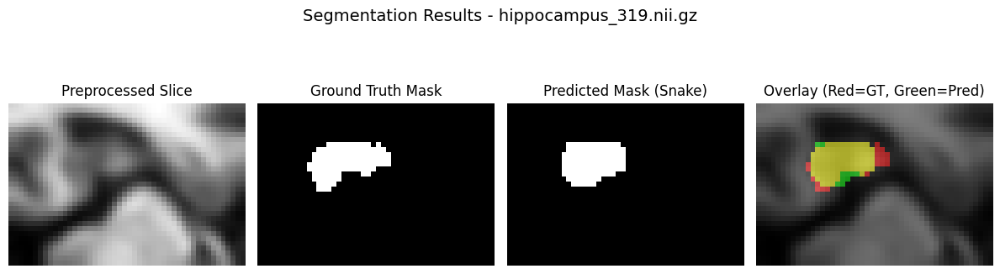

hippocampus_320.nii.gz
  Accuracy: 0.9903
  Dice Coefficient: 0.9080
  IoU: 0.8315



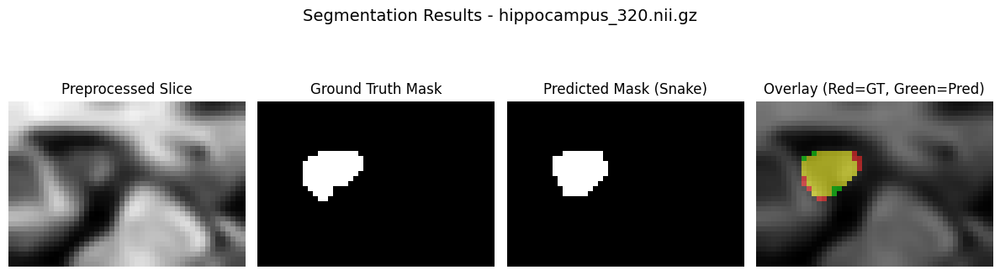

hippocampus_321.nii.gz
  Accuracy: 0.9661
  Dice Coefficient: 0.8239
  IoU: 0.7006



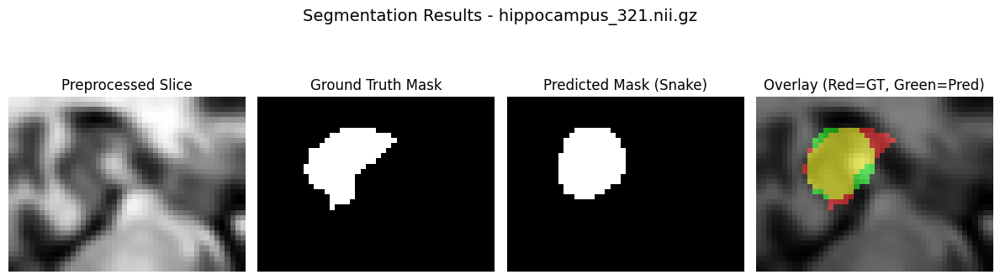

hippocampus_322.nii.gz
  Accuracy: 0.9692
  Dice Coefficient: 0.8000
  IoU: 0.6667



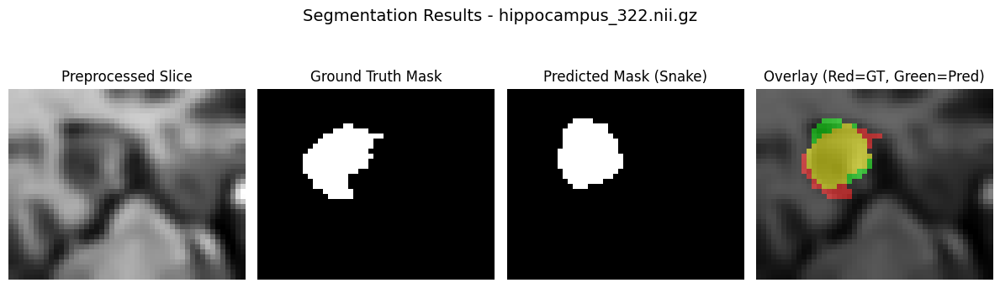

hippocampus_325.nii.gz
  Accuracy: 0.9485
  Dice Coefficient: 0.8375
  IoU: 0.7204



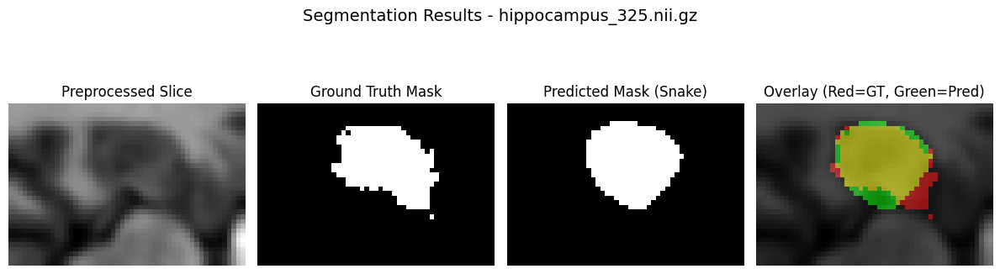

hippocampus_326.nii.gz
  Accuracy: 0.9671
  Dice Coefficient: 0.8263
  IoU: 0.7041



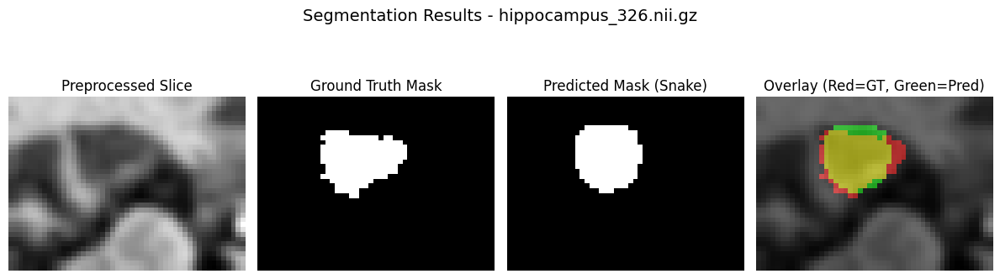

hippocampus_327.nii.gz
  Accuracy: 0.8729
  Dice Coefficient: 0.6555
  IoU: 0.4876



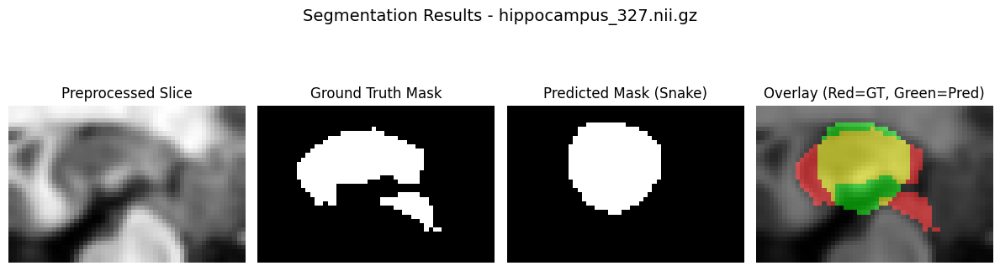

hippocampus_328.nii.gz
  Accuracy: 0.8957
  Dice Coefficient: 0.6310
  IoU: 0.4610



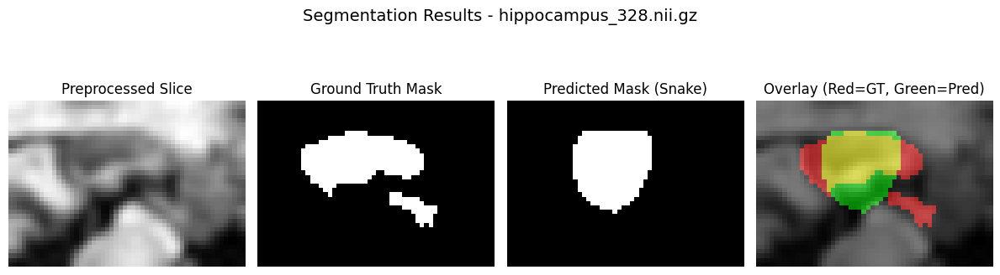

hippocampus_329.nii.gz
  Accuracy: 0.8835
  Dice Coefficient: 0.6688
  IoU: 0.5024



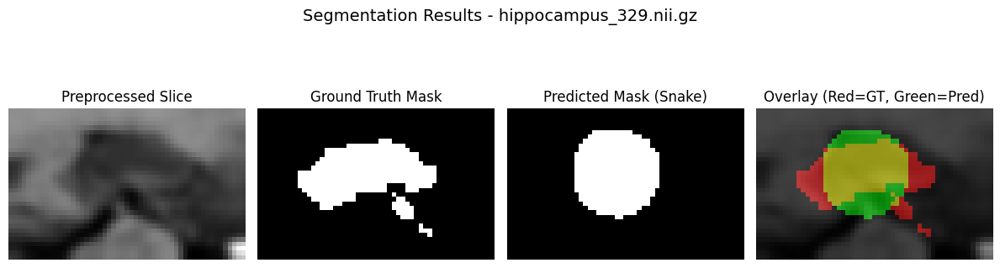

hippocampus_330.nii.gz
  Accuracy: 0.8649
  Dice Coefficient: 0.6049
  IoU: 0.4336



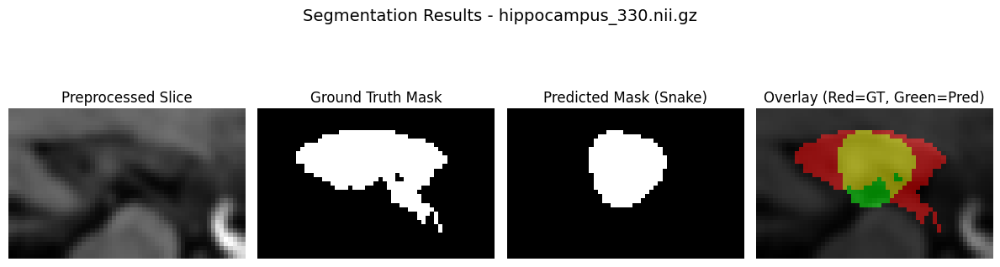

hippocampus_331.nii.gz
  Accuracy: 0.9593
  Dice Coefficient: 0.7613
  IoU: 0.6146



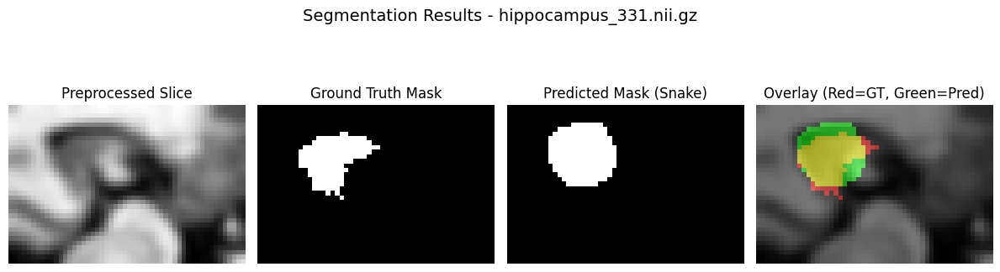

hippocampus_332.nii.gz
  Accuracy: 0.9418
  Dice Coefficient: 0.6989
  IoU: 0.5371



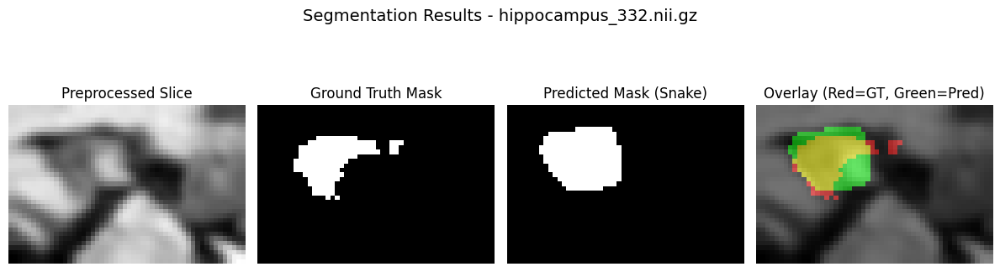

hippocampus_333.nii.gz
  Accuracy: 0.9736
  Dice Coefficient: 0.8246
  IoU: 0.7015



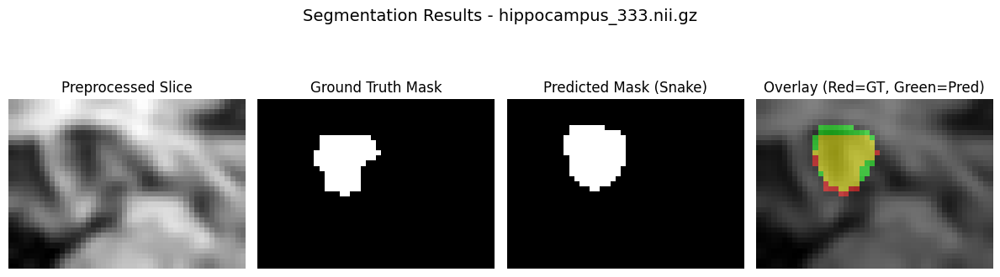

hippocampus_334.nii.gz
  Accuracy: 0.9756
  Dice Coefficient: 0.7845
  IoU: 0.6455



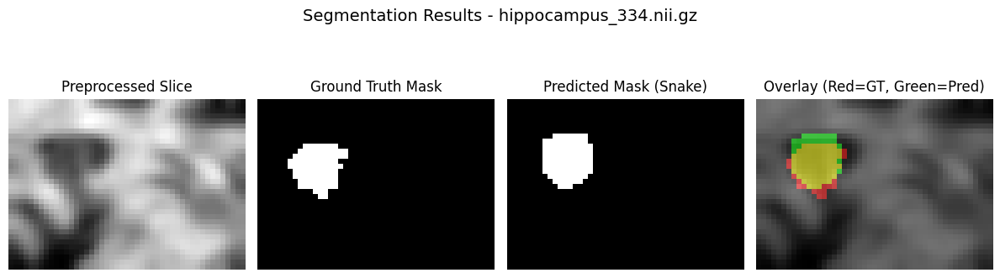

hippocampus_335.nii.gz
  Accuracy: 0.9767
  Dice Coefficient: 0.8416
  IoU: 0.7266



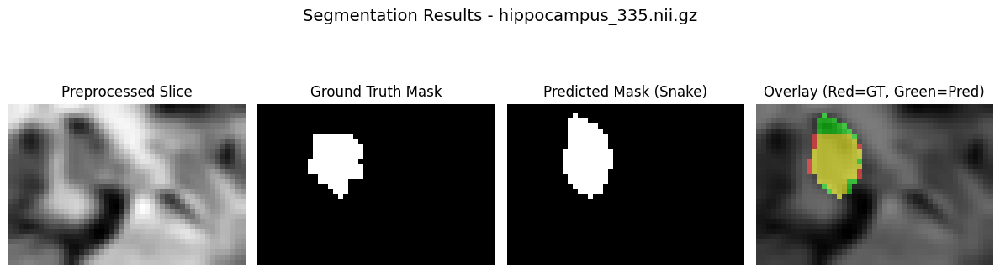

hippocampus_336.nii.gz
  Accuracy: 0.9844
  Dice Coefficient: 0.8936
  IoU: 0.8077



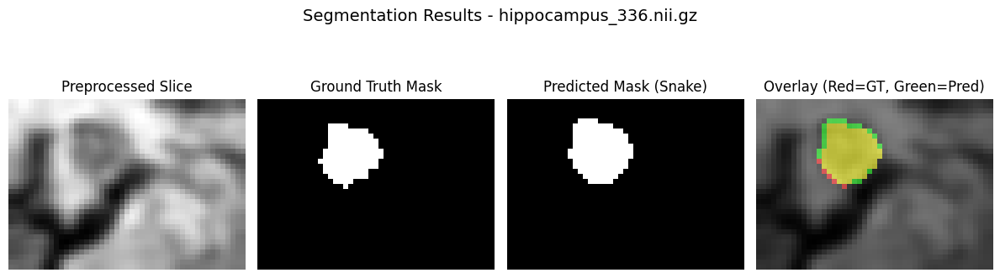

hippocampus_337.nii.gz
  Accuracy: 0.9738
  Dice Coefficient: 0.8504
  IoU: 0.7397



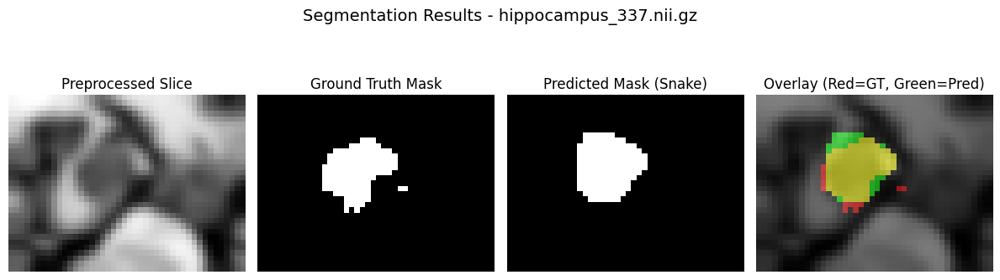

hippocampus_338.nii.gz
  Accuracy: 0.9635
  Dice Coefficient: 0.7786
  IoU: 0.6375



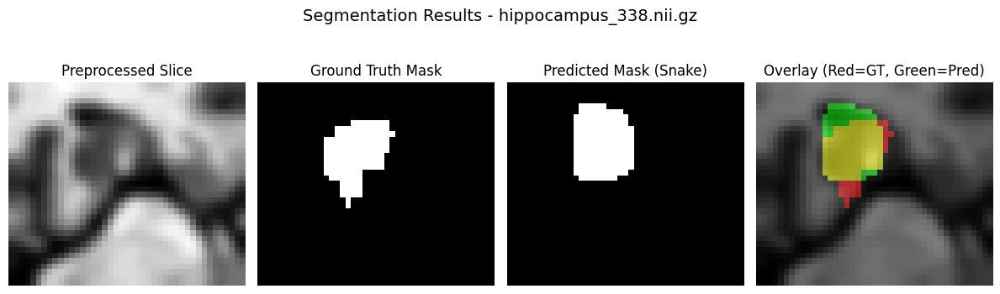

hippocampus_340.nii.gz
  Accuracy: 0.9621
  Dice Coefficient: 0.7715
  IoU: 0.6280



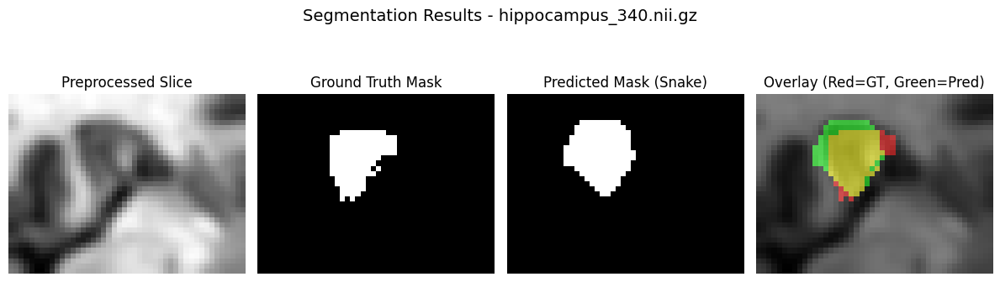

hippocampus_341.nii.gz
  Accuracy: 0.9369
  Dice Coefficient: 0.7482
  IoU: 0.5977



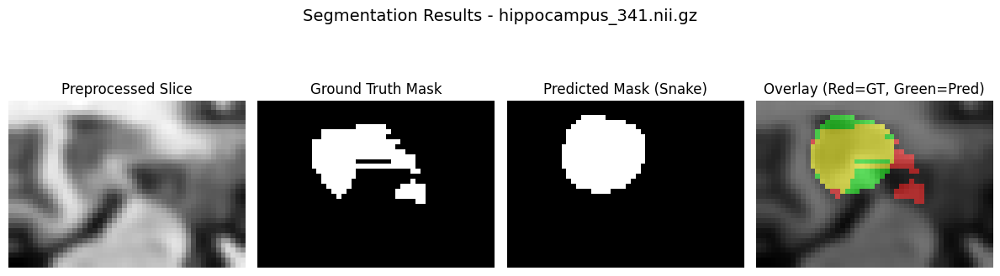

hippocampus_343.nii.gz
  Accuracy: 0.9736
  Dice Coefficient: 0.8173
  IoU: 0.6911



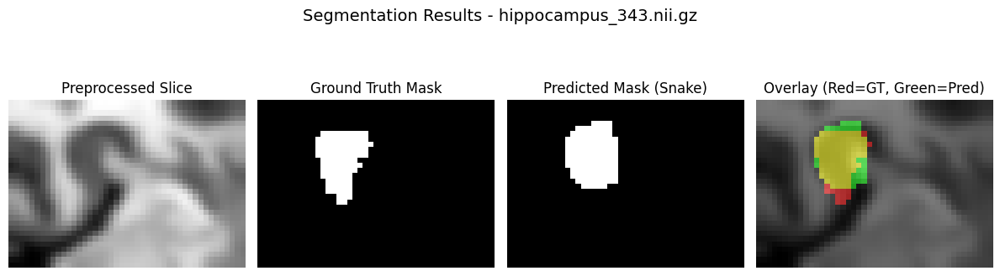

hippocampus_345.nii.gz
  Accuracy: 0.8444
  Dice Coefficient: 0.6380
  IoU: 0.4684



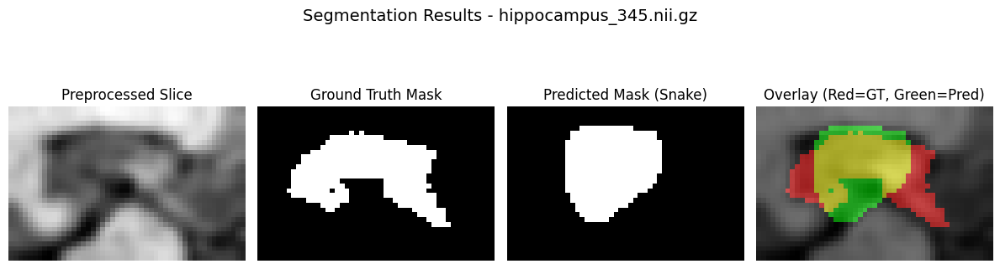

hippocampus_349.nii.gz
  Accuracy: 0.9494
  Dice Coefficient: 0.7244
  IoU: 0.5678



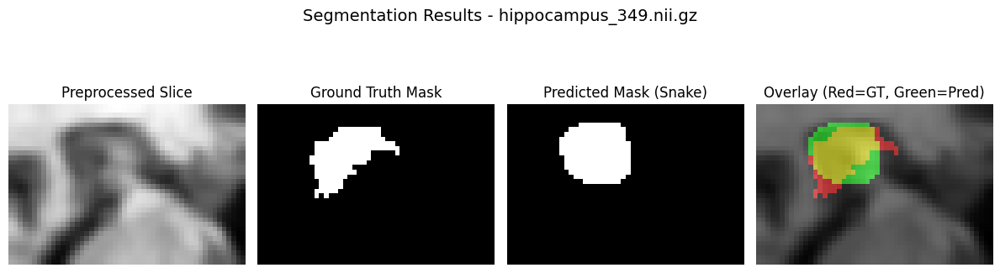

hippocampus_350.nii.gz
  Accuracy: 0.9644
  Dice Coefficient: 0.7766
  IoU: 0.6347



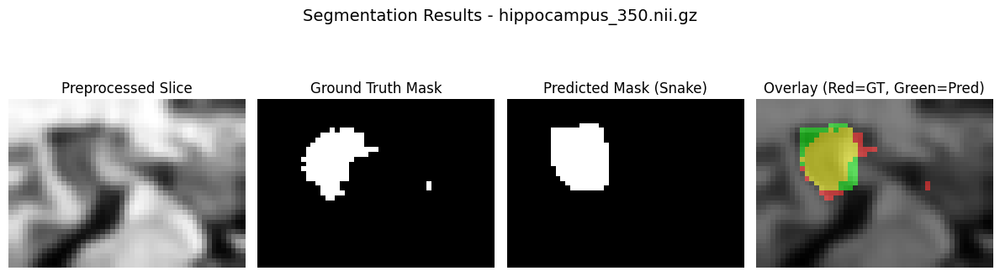

hippocampus_351.nii.gz
  Accuracy: 0.9109
  Dice Coefficient: 0.7028
  IoU: 0.5418



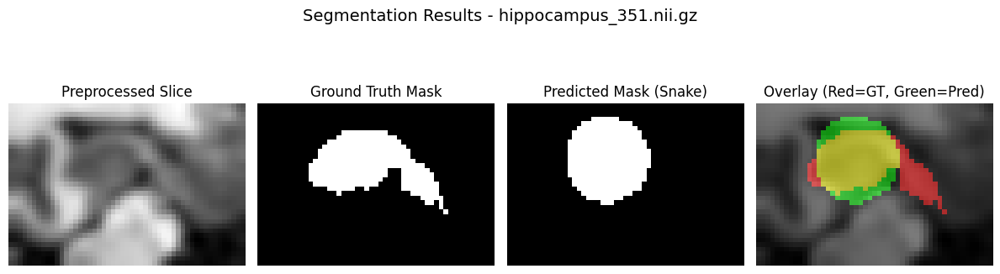

hippocampus_352.nii.gz
  Accuracy: 0.9309
  Dice Coefficient: 0.7309
  IoU: 0.5759



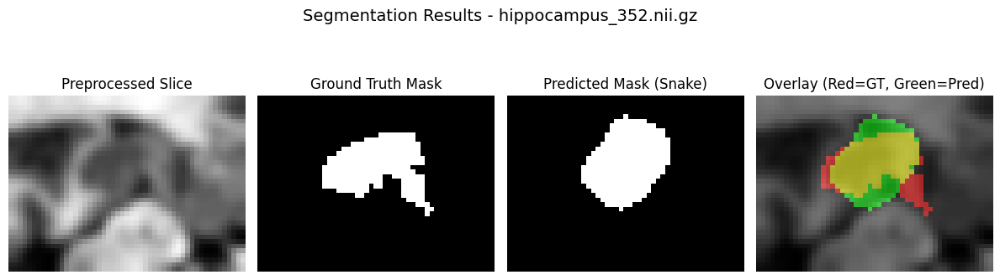

hippocampus_353.nii.gz
  Accuracy: 0.9688
  Dice Coefficient: 0.7884
  IoU: 0.6507



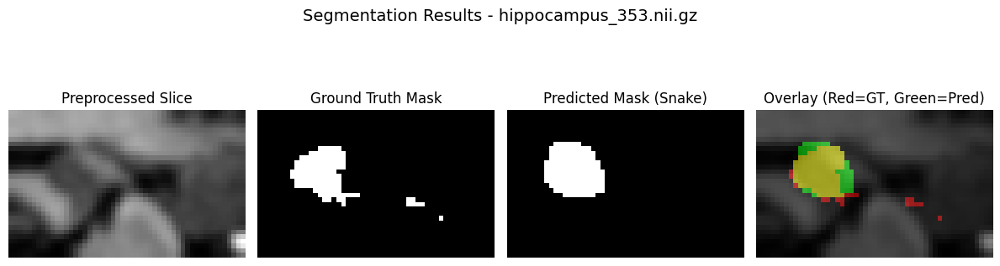

hippocampus_354.nii.gz
  Accuracy: 0.9661
  Dice Coefficient: 0.8039
  IoU: 0.6720



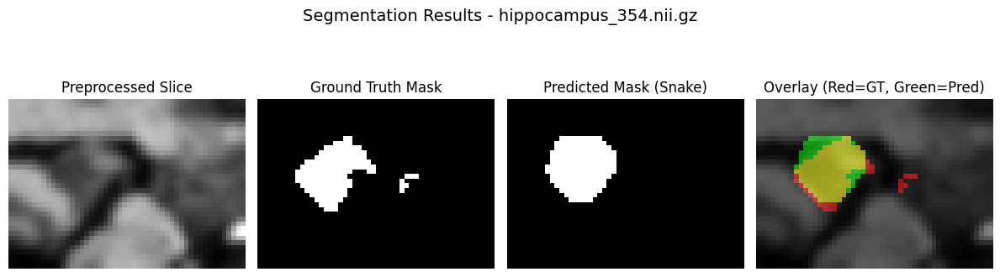

hippocampus_355.nii.gz
  Accuracy: 0.9749
  Dice Coefficient: 0.8458
  IoU: 0.7329



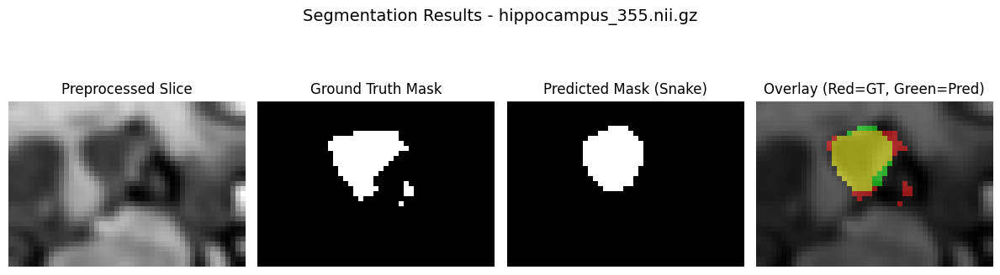

hippocampus_356.nii.gz
  Accuracy: 0.9581
  Dice Coefficient: 0.8108
  IoU: 0.6818



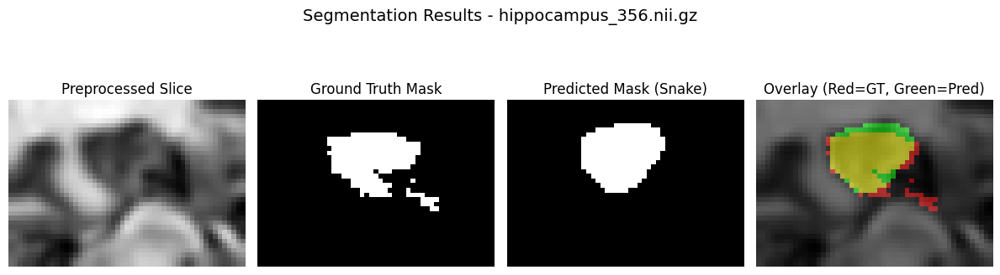

hippocampus_358.nii.gz
  Accuracy: 0.9720
  Dice Coefficient: 0.8588
  IoU: 0.7525



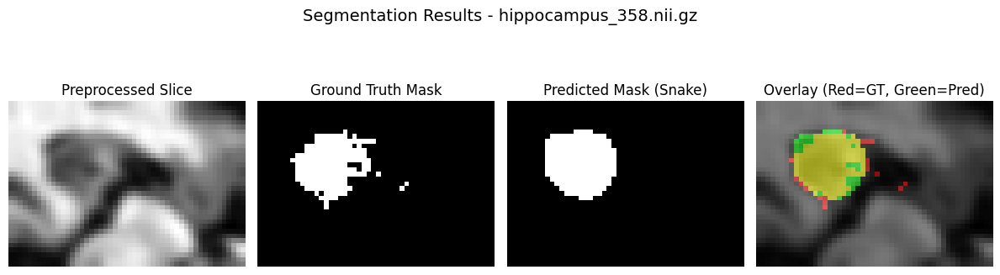

hippocampus_359.nii.gz
  Accuracy: 0.9347
  Dice Coefficient: 0.6433
  IoU: 0.4742



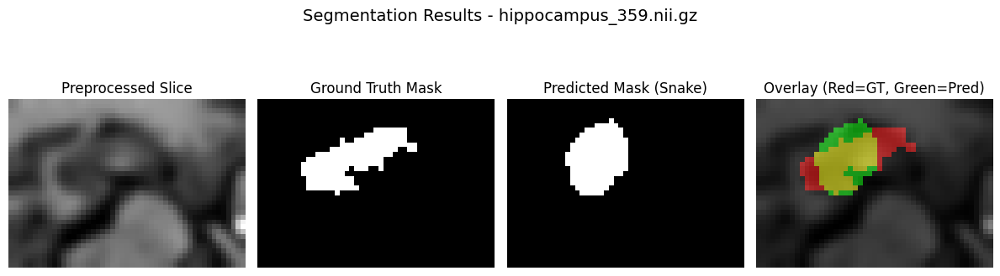

hippocampus_360.nii.gz
  Accuracy: 0.9724
  Dice Coefficient: 0.8506
  IoU: 0.7401



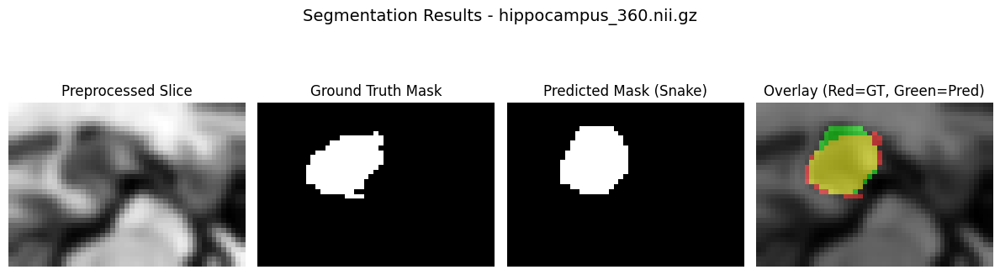

hippocampus_361.nii.gz
  Accuracy: 0.9256
  Dice Coefficient: 0.7265
  IoU: 0.5705



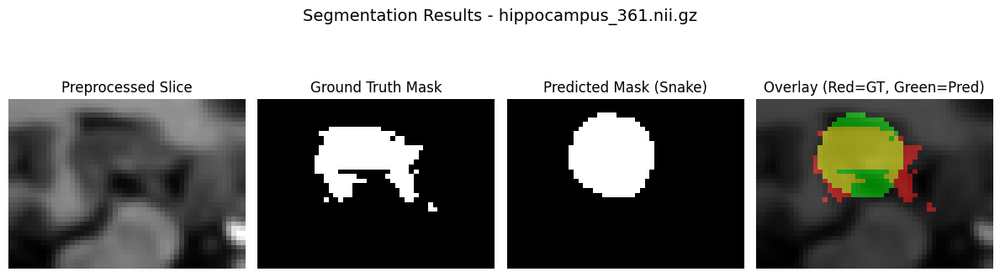

hippocampus_363.nii.gz
  Accuracy: 0.9352
  Dice Coefficient: 0.7181
  IoU: 0.5601



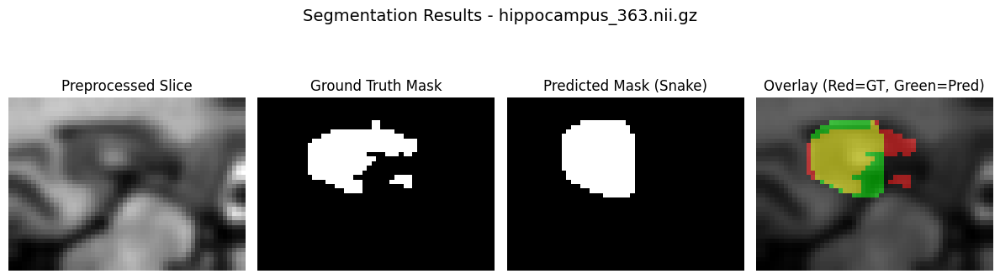

hippocampus_366.nii.gz
  Accuracy: 0.9551
  Dice Coefficient: 0.8550
  IoU: 0.7468



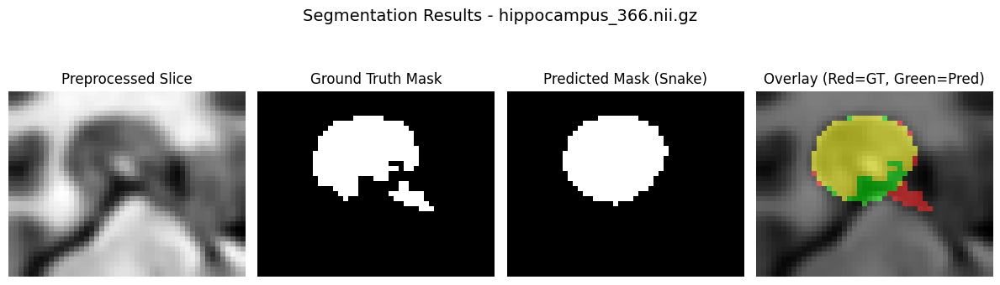

hippocampus_367.nii.gz
  Accuracy: 0.9298
  Dice Coefficient: 0.7209
  IoU: 0.5636



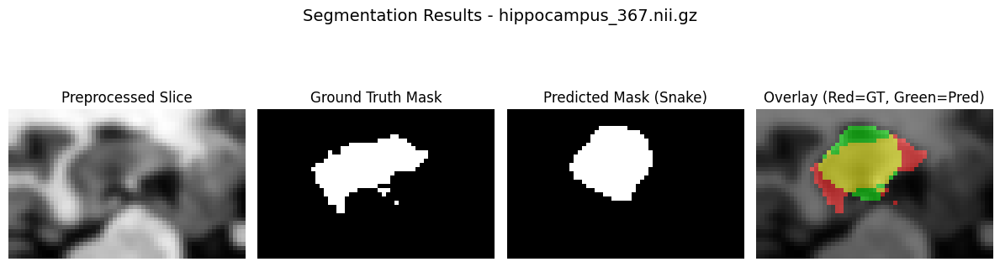

hippocampus_368.nii.gz
  Accuracy: 0.9679
  Dice Coefficient: 0.8232
  IoU: 0.6996



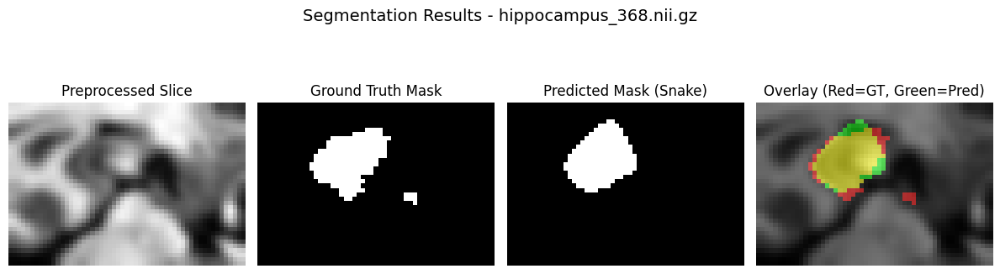

hippocampus_370.nii.gz
  Accuracy: 0.9623
  Dice Coefficient: 0.8000
  IoU: 0.6667



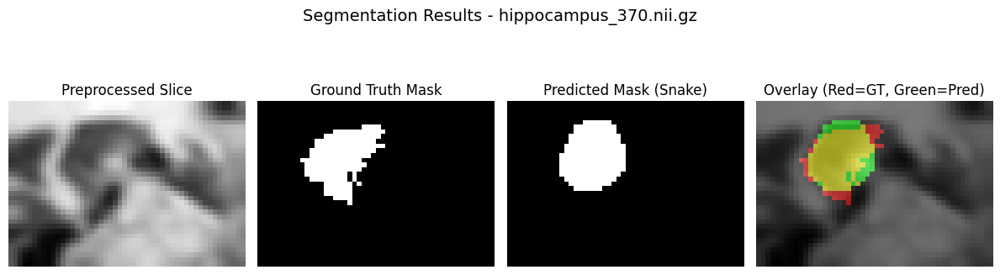

hippocampus_372.nii.gz
  Accuracy: 0.9700
  Dice Coefficient: 0.8247
  IoU: 0.7017



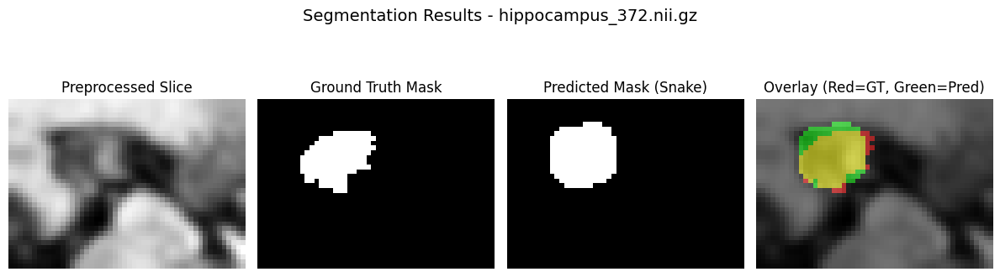

hippocampus_373.nii.gz
  Accuracy: 0.9166
  Dice Coefficient: 0.7098
  IoU: 0.5502



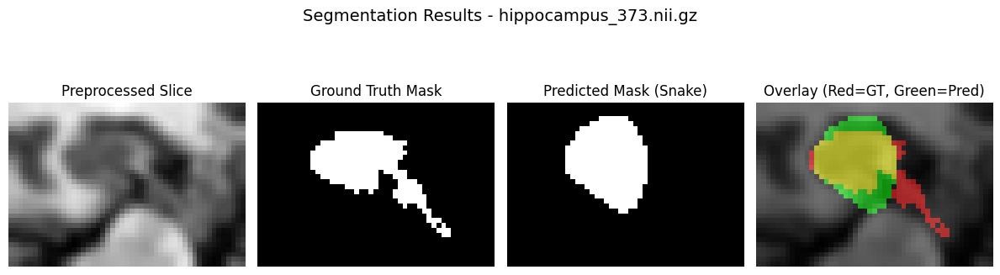

hippocampus_374.nii.gz
  Accuracy: 0.9649
  Dice Coefficient: 0.8222
  IoU: 0.6981



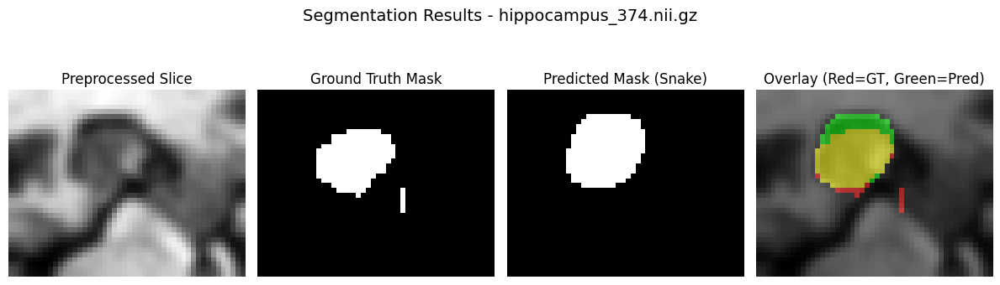

hippocampus_375.nii.gz
  Accuracy: 0.9508
  Dice Coefficient: 0.7837
  IoU: 0.6444



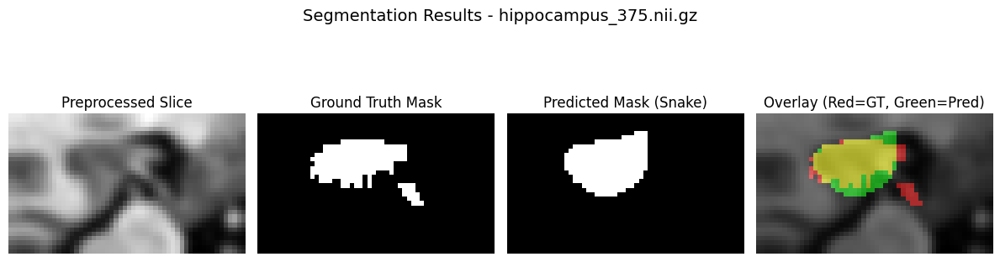

hippocampus_376.nii.gz
  Accuracy: 0.9481
  Dice Coefficient: 0.7487
  IoU: 0.5984



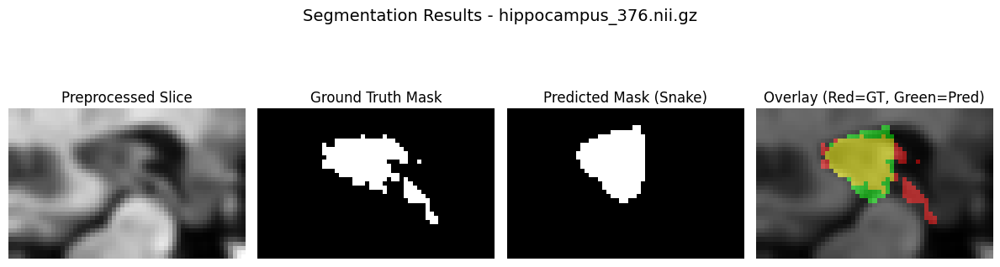

hippocampus_378.nii.gz
  Accuracy: 0.9604
  Dice Coefficient: 0.7907
  IoU: 0.6538



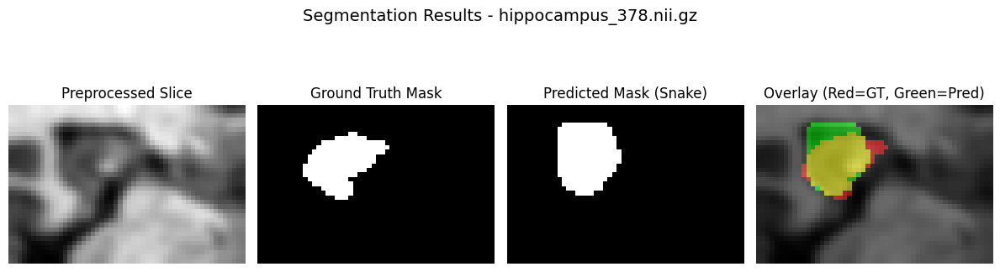

hippocampus_380.nii.gz
  Accuracy: 0.9764
  Dice Coefficient: 0.8504
  IoU: 0.7397



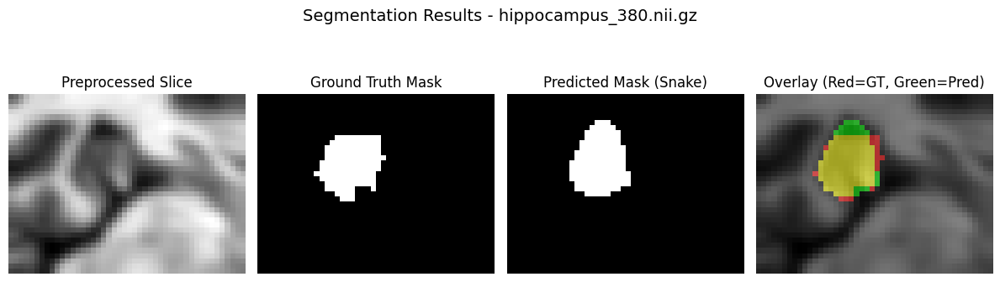

hippocampus_381.nii.gz
  Accuracy: 0.9709
  Dice Coefficient: 0.8498
  IoU: 0.7389



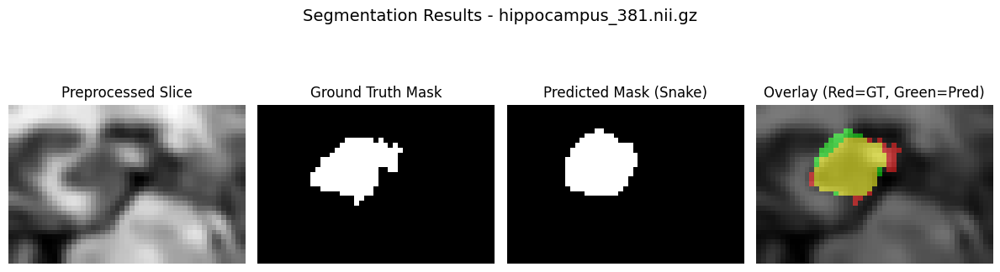

hippocampus_383.nii.gz
  Accuracy: 0.8860
  Dice Coefficient: 0.6677
  IoU: 0.5012



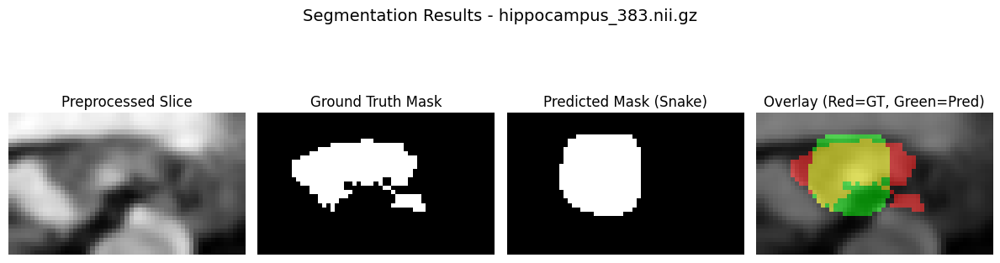

hippocampus_385.nii.gz
  Accuracy: 0.9798
  Dice Coefficient: 0.8828
  IoU: 0.7901



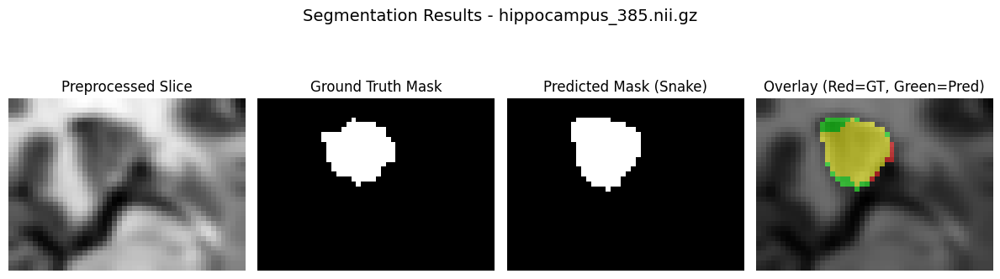

hippocampus_386.nii.gz
  Accuracy: 0.9730
  Dice Coefficient: 0.8673
  IoU: 0.7656



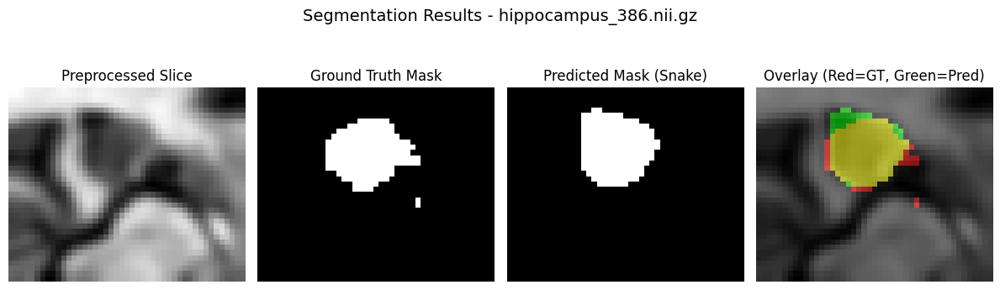

hippocampus_387.nii.gz
  Accuracy: 0.9144
  Dice Coefficient: 0.7085
  IoU: 0.5486



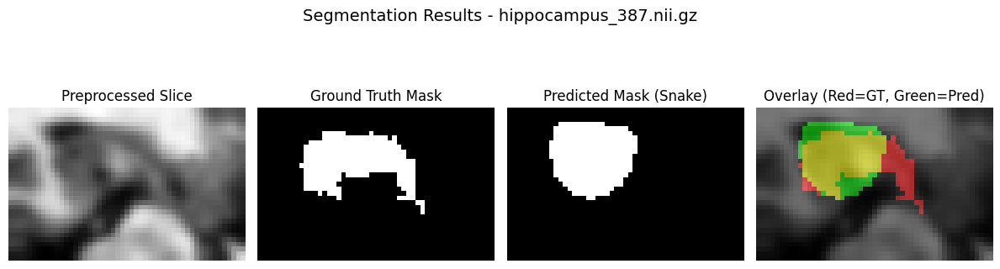

hippocampus_389.nii.gz
  Accuracy: 0.8998
  Dice Coefficient: 0.4924
  IoU: 0.3266



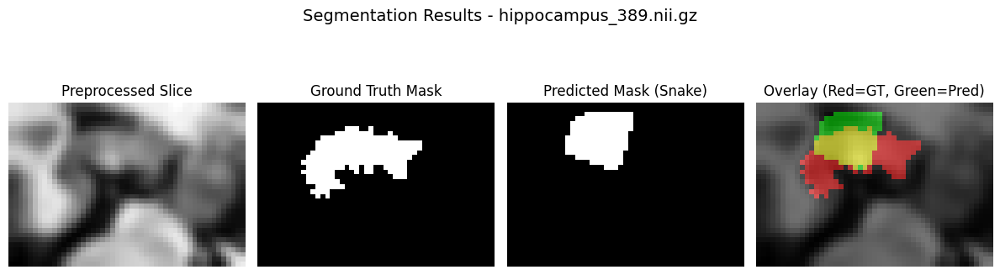

hippocampus_390.nii.gz
  Accuracy: 0.9097
  Dice Coefficient: 0.6493
  IoU: 0.4807



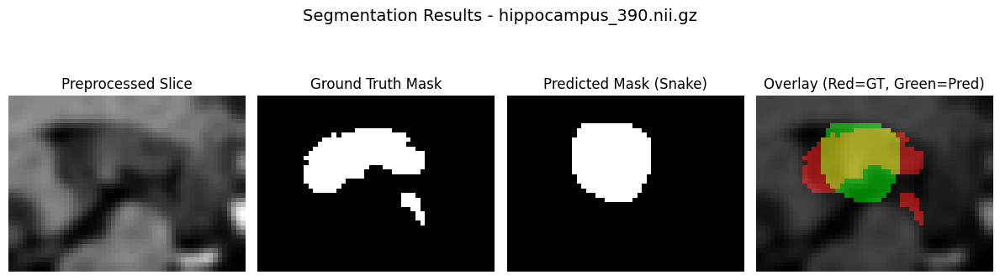

hippocampus_393.nii.gz
  Accuracy: 0.9025
  Dice Coefficient: 0.6961
  IoU: 0.5339



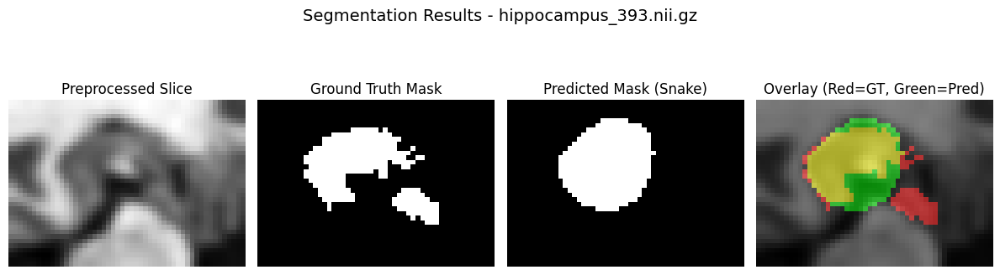

hippocampus_394.nii.gz
  Accuracy: 0.9348
  Dice Coefficient: 0.8185
  IoU: 0.6927



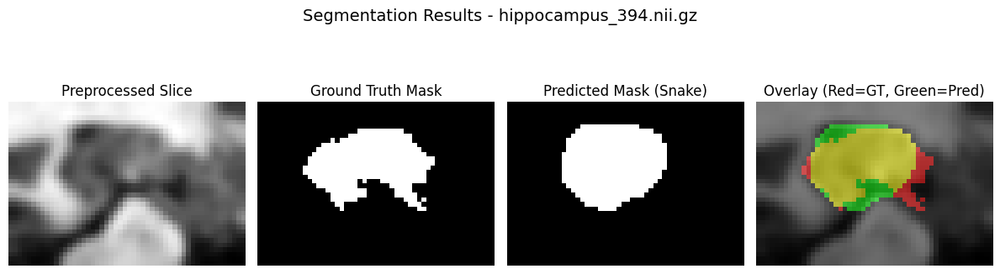

In [6]:
accuracies = []
dice_scores = []
ious = []

for i in range(len(preprocessed_slices)):
    final_slice = preprocessed_slices[i]
    label_slice = label_slices[i]
    file = image_files[i]

    # Ground truth binary mask
    gt_mask = (label_slice > 0).astype(np.uint8)
    if np.sum(gt_mask) == 0:
        print(f"Skipping {file} (empty label)")
        continue

    # ===  1: Initialize contour ===
    y_center, x_center = center_of_mass(gt_mask)
    y_center, x_center = int(y_center), int(x_center)
    

    area = np.sum(gt_mask)          
    radius = np.sqrt(area / np.pi)  # radius of circle with same area
    radius = max(5, radius)  # avoid too small radius

    s = np.linspace(0, 2 * np.pi, 400)
    x = x_center + radius * np.cos(s)
    y = y_center + radius * np.sin(s)
    init = np.array([y, x]).T

    # ===  2: Active contour segmentation ===
    snake = active_contour(final_slice, init, alpha=0.015, beta=10, gamma=0.001)

    # ===  3: Convert snake to binary mask like what we did in label slice ===
    mask = np.zeros(final_slice.shape, dtype=np.uint8)
    rr, cc = polygon(snake[:, 0], snake[:, 1], final_slice.shape)
    mask[rr, cc] = 1

    # ===  4: Evaluaiton metrics ===
    acc = accuracy_score(gt_mask.flatten(), mask.flatten())
    intersection = np.logical_and(gt_mask, mask).sum()
    dice = (2 * intersection) / (gt_mask.sum() + mask.sum() + 1e-8)
    iou = jaccard_score(gt_mask.flatten(), mask.flatten())

    accuracies.append(acc)
    dice_scores.append(dice)
    ious.append(iou)

    print(f"{file}")
    print(f"  Accuracy: {acc:.4f}")
    print(f"  Dice Coefficient: {dice:.4f}")
    print(f"  IoU: {iou:.4f}\n")

    # === Step 5: Visualization ===
    plt.figure(figsize=(12, 4))
    plt.suptitle(f"Segmentation Results - {file}", fontsize=14)

    plt.subplot(1, 4, 1)
    plt.imshow(final_slice, cmap='gray')
    plt.title("Preprocessed Slice")
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(gt_mask, cmap='gray')
    plt.title("Ground Truth Mask")
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.imshow(mask, cmap='gray')
    plt.title("Predicted Mask (Snake)")
    plt.axis('off')

    plt.subplot(1, 4, 4)
    overlay = np.zeros((*final_slice.shape, 3))
    overlay[..., 0] = gt_mask  # Red = Ground truth
    overlay[..., 1] = mask     # Green = Predicted
    plt.imshow(final_slice, cmap='gray')
    plt.imshow(overlay, alpha=0.5)
    plt.title("Overlay (Red=GT, Green=Pred)")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

Accuracy: How many pixels were correctly predicted

Dice Coefficient: Overlap between prediction and ground truth

IoU (Jaccard Index): Intersection over Union

In [7]:
# ===  6: Mean results ===
print("=== Mean Results ===")
print(f"Mean Accuracy: {np.mean(accuracies):.4f}")
print(f"Mean Dice Coefficient: {np.mean(dice_scores):.4f}")
print(f"Mean IoU: {np.mean(ious):.4f}")

=== Mean Results ===
Mean Accuracy: 0.9447
Mean Dice Coefficient: 0.7554
Mean IoU: 0.6192
